In [1]:
import matplotlib
from matplotlib import pylab
%config InlineBackend.figure_format = 'retina'
matplotlib.rcParams['figure.dpi'] = 80
params = {'legend.fontsize': 'xx-large',
          'figure.figsize': (6, 4),
         'axes.labelsize': 'xx-large',
         'axes.titlesize': 'xx-large',
         'xtick.labelsize': 'x-large',
         'ytick.labelsize': 'x-large',
         'figure.facecolor': 'w'}
pylab.rcParams.update(params)
from matplotlib import pyplot as plt
import matplotlib.gridspec as gridspec

import h5py
import numpy as np
import sys

sys.path.insert(1, '/home/ksf293/external')
import illustris_python as il

sys.path.insert(1, '../code')
from featurize_and_fit import Featurizer, Fitter
import scalars
import plotter

%load_ext autoreload
%autoreload 2

In [2]:
save_plots = True
plot_dir = '../plots/plots_2021-01-28'

# r_edges (TNG50-4: L=35 Mpc/h, N_part=270^3, mean interparticle spacing = 35/270 = 0.13 Mpc/h = 130 kpc/h)
#r_edges = np.logspace(np.log10(1), np.log10(1000), 7) 
#r_edges = np.array([0, 1000])
r_edges = np.array([0, 1])
#r_edges = np.logspace(np.log10(0.01), np.log10(10), 5) 
#r_edges = np.array([0, 0.2, 0.4, 0.6, 0.8, 1.0])
r_units = 'r200'
print(r_edges)

m_order_max = 3
x_order_max = 0 # for scalars, only 0 or 2 x orders
l_arr = scalars.get_needed_ls_scalars(m_order_max, x_order_max)

logy = False
unc_tag = '_unc0.1M'
runit_tag = '_r200edges'
y_scalar_feature_name='mass_hydro_subhalo_star'
y_tag = '_msubhalo'

logy_tag = ''
if logy:
    logy_tag = '_logy'
save_tag = f'_xordmax{x_order_max}_mordmax{m_order_max}_rbins{len(r_edges)-1}{logy_tag}{unc_tag}{runit_tag}{y_tag}'

[0 1]


In [3]:
mass_multiplier = 1e10

In [4]:
featurizer = Featurizer(r_edges, r_units=r_units)
featurizer.read_simulations()
featurizer.match_twins()
featurizer.select_halos()
featurizer.add_info_to_halo_dicts()

In [5]:
print(featurizer.N_halos)

2344


In [6]:
featurizer.compute_geometric_features(l_arr)

com [ 7302.88493095 24496.78871082 21282.2689177 ]
geo features
[[    2.94450134    69.06104281    34.16448795]
 [    3.73296086    70.08674401    33.36246642]
 [    3.68467225    69.4507448     33.56987235]
 ...
 [ -198.59507064  -822.64292464 -1082.72036241]
 [ -105.36880651  -809.86025212 -1184.6271867 ]
 [  316.42281263  -837.73078749 -1068.05952745]]
[   0.         1334.26037598]
[  77.1058361    77.71190931   77.22641448 ... 1374.2142361  1438.85989061
 1393.79604779]
com [23684.10647862 15172.6724204   3132.6820673 ]
geo features
[[  8.41234503 -55.17917377  11.99866168]
 [  8.33847506 -55.71712338  11.30495149]
 [  7.62960069 -55.30111445  11.77431471]
 ...
 [-72.00594609 246.0666621  146.88663342]
 [-88.08872249 254.00666428 156.09017758]
 [-67.4717792  248.1543062  174.0463037 ]]
[   0.         1043.34521484]
[ 57.09182646  57.46068162  57.05312045 ... 295.4815418  310.87481736
 310.5239387 ]
com [27088.21081507  7585.37694155  4034.18538223]
geo features
[[   4.38099573  -24

com [16394.07188692 21174.26478263 21897.56821933]
geo features
[[ -8.1724675   47.2431879  -10.42807202]
 [ -7.60428317  47.10747601  -6.3096012 ]
 [ -6.33836459  45.50177292  -8.3715759 ]
 ...
 [ 19.57504964 -51.61976521 -35.60840992]
 [ 44.11431808 -20.33658735 -34.08489885]
 [ 13.15990147 -22.92561431   2.99244083]]
[  0.         598.88342285]
[49.06579984 48.13263431 46.69763899 ... 65.69430406 59.34163947
 26.60303554]
com [23841.08402096 25523.64076144  5212.07296275]
geo features
[[   8.65659189   15.61758193  -10.95488355]
 [  10.27882978   16.91560839  -13.10291039]
 [   8.64895148   13.73523542  -12.22607605]
 ...
 [-444.00289145  284.20372837   61.42032651]
 [-449.36085532  260.52876693   31.41607353]
 [ -34.07549051  199.83060667  -36.22398866]]
[  0.         582.53570557]
[ 20.94886446  23.73770017  20.3208757  ... 530.7379611  520.37235358
 205.92617068]
com [15117.13725163  4791.33588241 33028.01876305]
geo features
[[ -37.04601223   46.92876228   -9.82105375]
 [ -35.75

geo features
[[-10.15139096  13.33199489  -8.25561695]
 [-10.09740264  11.57571175  -8.8281117 ]
 [ -7.7046714   11.23447363 -11.85408912]
 ...
 [117.91097945 108.67063655 261.08470767]
 [105.12355514 113.16936454 238.9177806 ]
 [ 75.65992327  51.81771335 301.98825529]]
[  0.         434.74258423]
[ 18.68015089  17.71694665  18.0580948  ... 306.39440416 284.49951284
 315.60482527]
com [ 9103.91348052 24948.96930174 17661.05327513]
geo features
[[   4.00081175   30.8670058    -0.22404501]
 [   3.13022854   34.23675542   -0.44189357]
 [   4.78165839   30.31719911   -3.73357797]
 ...
 [ 133.81002367 -136.55042837   92.25904304]
 [ 136.20727565 -185.8842247    87.30174938]
 [ 148.02608445 -166.93559195  112.21345248]]
[  0.         427.54934692]
[ 31.12601384  34.38239408  30.91822154 ... 212.28017558 246.42841227
 249.74201179]
com [34949.76104011  5165.58968944 21549.15962585]
geo features
[[ -15.73091609   79.8887298   -65.83368873]
 [ -13.80470525   79.81853653  -64.40298977]
 [ -14.33

com [25749.28925553 32819.58788301 15335.96763849]
geo features
[[ -55.54641513   44.72366699   33.92048417]
 [ -55.86667086   45.03150222   34.31342541]
 [ -58.09598412   44.49110813   33.8964924 ]
 ...
 [ 328.2677391    38.07737615 -465.33689551]
 [ 403.30188988  214.67832313 -320.37084727]
 [ -36.95119607  -17.53566594   87.62043379]]
[  0.         317.61993408]
[ 78.96967689  79.53824406  80.64474112 ... 570.74339368 558.01135883
  96.69659191]
com [ 9354.53447646 29050.16527504 20311.51189183]
geo features
[[ 5.74698863e+00  2.22656325e+00 -6.23107656e-01]
 [ 3.89815515e+00  4.50181813e-01 -4.50252725e-01]
 [ 5.24401788e+00  7.96717267e-01 -2.34408302e-01]
 ...
 [ 3.53166449e+00 -3.61728938e+02  1.35648003e+02]
 [-1.20967400e+01 -1.88363130e+02 -1.08642438e+02]
 [-1.61545375e+01 -1.65781955e+02 -9.91817373e+01]]
[  0.         365.82733154]
[  6.19465297   3.94981072   5.30937183 ... 386.34269545 217.78470804
 193.85985287]
com [31496.75346796 12981.93553615  9151.89642964]
geo fea

com [17539.79477161 26612.71074737 24278.12558756]
geo features
[[  -1.97608915   28.04693569  -21.32425913]
 [  -1.19276207   27.90024314  -16.93522486]
 [  -1.51136026   28.69593908  -20.04316919]
 ...
 [ -74.03849556   71.31413186 -293.95215552]
 [ 134.68567369  -77.88626561 -238.48561753]
 [  -5.22185588  180.95421251   29.22187909]]
[  0.         328.10449219]
[ 35.2882354   32.65957884  35.03526453 ... 311.40853226 284.74882061
 183.37287973]
com [ 7673.86093474  7927.87166303 12100.77638316]
geo features
[[   2.36186239  -28.14366035   17.80248853]
 [   3.60372627  -28.42161153   11.22807798]
 [  -3.03260233  -28.83683527   10.51529028]
 ...
 [  61.69635184  -19.35297069  -28.96564023]
 [ 132.75397031 -257.98116185  135.27305648]
 [ 162.89286391 -189.50935007  142.65650731]]
[  0.         323.53720093]
[ 33.38521544  30.77083977  30.84365535 ...  70.85185685 320.11981556
 287.74773319]
com [16587.31013005 23755.26682022 34030.24834216]
geo features
[[  6.44877009   6.75330091  -

com [27128.20502998  9398.59971861  5249.60513862]
geo features
[[ -7.63507201 -13.13599309   5.4660582 ]
 [ -8.60120987 -14.80140197   5.22057934]
 [ -5.99939788 -11.07742808   7.66496168]
 ...
 [ 32.96893178 140.64572289  -9.73332071]
 [ 72.06488755 135.23461452  -1.17221258]
 [ 56.02915956 156.0342674    0.49046027]]
[  0.         284.60391235]
[ 16.14702546  17.89739535  14.74631565 ... 144.78572914 153.24204079
 165.78962535]
com [17881.83476846  4383.74493073  8135.33876535]
geo features
[[  -9.53242266    5.02102408   -5.58513821]
 [ -12.12747286    9.28161772   -3.56332404]
 [  -9.23662749    6.15098998   -4.26134576]
 ...
 [-128.26717748 -197.85013774  203.08884845]
 [-124.96410189 -203.33964251  267.4266348 ]
 [-133.01142961 -217.92161288  204.75254425]]
[  0.         298.63729858]
[ 12.13554833  15.6818782   11.88734759 ... 311.19483637 358.44112763
 327.2697269 ]
com [ 8478.55871319 33630.79141117 22202.14352765]
geo features
[[ -26.9805235   -11.04070706    8.80505775]
 [ 

com [24460.20764215 16195.00383813 33414.9170801 ]
geo features
[[-23.66156408  20.48744632  18.51217152]
 [-25.45875778  22.40390254  17.50831033]
 [-22.66195996  19.70400811  15.57208274]
 ...
 [-23.96823398 -33.38863263 -60.17209816]
 [ 11.97198953 -55.67616209  23.32563783]
 [-88.23538066  -8.01322923  22.89068327]]
[  0.         278.12310791]
[36.36351971 38.16574547 33.82753502 ... 72.86946154 61.54062836
 91.50780089]
com [21248.01924763 25105.28237313 22508.4310217 ]
geo features
[[-41.14772872 -18.17422349 -59.94746738]
 [-41.63525672 -16.86216903 -60.99948544]
 [-40.65042511 -17.58037192 -61.1348427 ]
 ...
 [-14.95712406 -83.66776271 -51.42689948]
 [302.19487173 -21.48877074  32.94239078]
 [307.55214504 -22.73021199  54.19038873]]
[  0.        265.8522644]
[ 74.94756049  75.75463398  75.4916918  ...  99.3415123  304.74367734
 313.11592532]
com [ 6294.77574123 22692.56113585 18302.19694591]
geo features
[[ -6.37637174   1.45238175 -10.85545276]
 [ -4.56769461  -0.35049249 -11.

com [25174.68638441  9587.37831625 23977.34953525]
geo features
[[  18.84263521  -16.6486926    -8.41455784]
 [  20.47412006  -16.92515392   -3.88530201]
 [  20.63154559  -16.83114384   -7.77593293]
 ...
 [   9.64697859   14.04724777  240.42542565]
 [ -87.62539842  -42.32122564 -204.00942156]
 [ -42.73178121   48.78771538  199.78495554]]
[  0.         266.04940796]
[ 26.51468745  26.846713    27.7382986  ... 241.02857645 226.02907042
 210.04826769]
com [11746.07449087 17585.8974385  27080.60544145]
geo features
[[-6.14527838e+00 -1.02149426e+00  3.04058451e+00]
 [-5.51843361e+00 -2.46397177e-01  4.80607631e+00]
 [-6.06036022e+00 -1.22452325e-01  2.07183214e+00]
 ...
 [ 6.31116796e+01 -6.08542415e+01 -6.60576896e+01]
 [ 1.47092039e+02 -4.59565078e+01 -1.04608363e+02]
 [ 1.81436935e+02 -8.42809809e+01 -1.22156272e+02]]
[  0.        267.1328125]
[  6.9320308    7.32203459   6.40589174 ... 109.77222405 186.25514267
 234.40307123]
com [17904.67454637  4601.40311211 31534.95478997]
geo featu

com [2202.22464013 5518.78721317 1502.72333059]
geo features
[[  -5.09380195   15.25852061   13.08884278]
 [  -7.00839001   13.73627246   15.81632362]
 [  -3.58728327   15.77838088   16.13145383]
 ...
 [ -47.87642173  -55.66424609 -264.61117659]
 [  53.63350608  -89.57096533   73.92213483]
 [  42.64029403 -121.37463753 -204.62199243]]
[  0.         248.25592041]
[ 20.73854081  22.0897896   22.8484071  ... 274.60832986 127.92182309
 241.7026212 ]
com [29856.05381081 32224.75977969  6290.61376925]
geo features
[[   1.07505446   -1.62651936    7.0555365 ]
 [   0.57112702    0.75471115    5.97373284]
 [   0.49642385   -3.00912257    7.49128012]
 ...
 [  68.44362024  -45.54895269  -84.87263864]
 [-164.65668399 -138.10662822   16.85948493]
 [  38.31419425   85.3718475     0.81393525]]
[  0.         252.96180725]
[  7.31996602   6.0482443    8.08829606 ... 118.16345049 215.56787
  93.57880271]
com [34851.79617379 26455.44873262 26358.43231187]
geo features
[[-12.84237998 -13.62545318 -13.2694

com [34572.51945471  3973.47524405 20759.68979042]
geo features
[[  10.31993052 -149.39616937   -5.34242471]
 [   8.60125712 -151.72879412   -0.66348458]
 [   4.34463009 -146.54066744   -4.11735925]
 ...
 [   0.35249269  197.88946611  154.72376775]
 [-145.83004907 -168.41199469  -79.07884119]
 [ -63.96911465  -31.61617117   88.33513104]]
[  0.         186.64982605]
[149.84744872 151.97384249 146.66286398 ... 251.19675427 236.3947256
 113.5549439 ]
com [31981.53631944 32174.49626194 15046.78215245]
geo features
[[ -3.36537293 -24.74538686  -1.72831669]
 [ -2.53221721 -25.82823588  -3.9101676 ]
 [ -3.81530818 -26.52551534  -2.04746386]
 ...
 [212.89316882 112.09186297  -2.41259713]
 [146.20277395  15.511316   -58.04484708]
 [108.12021739 117.31943899  22.30301   ]]
[  0.         233.08781433]
[ 25.03291802  26.24498625  26.8766004  ... 240.61152861 158.06661984
 161.09393666]
com [26712.38901129  9845.37142109  5704.48920748]
geo features
[[  27.24704718    4.50860673   -3.15926812]
 [  

com [ 2450.40249372 10669.14227468  1207.74933956]
geo features
[[   6.72466313   -0.247871      3.00046592]
 [   4.56874528    1.63045152    2.99596348]
 [   6.37429219    1.61164229    6.31477209]
 ...
 [  54.35755169  -48.81454     158.49152042]
 [  70.43320114  -61.84278955  128.87604619]
 [-135.45539885   74.46003731 -184.89521944]]
[  0.         225.42201233]
[  7.3678579    5.7015439    9.11621294 ... 174.51981202 159.35621019
 240.99523731]
com [23372.96950335 16716.87821641  7697.6707158 ]
geo features
[[   7.66659964   -2.87134995    4.60008912]
 [   9.41595285   -1.60950072    5.11753748]
 [   7.35991711   -3.5096217     6.79400586]
 ...
 [ -18.58024408 -142.20291269   73.99810258]
 [-165.29613277   -6.11654632  -99.37292469]
 [  55.4339812  -118.90455611  111.09468679]]
[  0.         230.37834167]
[  9.39053888  10.83696685  10.61340379 ... 161.37723828 192.96425008
 171.91058481]
com [ 2394.52901158 18692.91008214 13866.70782659]
geo features
[[ -8.67376531   1.03826837  -

com [11726.49858935 10965.5859011     54.428199  ]
geo features
[[-13.79070929   3.40146616  -6.92961712]
 [-12.59150325   3.93986559  -5.41410622]
 [-13.10595567   2.18274273  -7.1449388 ]
 ...
 [ -9.31906611  50.19949809  80.33640388]
 [ 50.25998715   8.24551452  31.81608206]
 [ 91.87547106 -62.54805607 118.69820338]]
[  0.         219.59906006]
[ 15.80421552  14.2611725   15.08577443 ...  95.18808954  60.05262605
 162.61188452]
com [  111.72013964  3912.24401816 21429.29381876]
geo features
[[ 1.39468579e-01 -5.20723080e-01  2.16840138e+01]
 [ 1.35952241e-01  6.36680880e-01  1.75677356e+01]
 [ 1.07199915e+00  1.80063510e+00  2.47919491e+01]
 ...
 [-9.10963311e+01 -1.80988370e+01  3.72691672e+01]
 [-2.04564511e+00  1.31738052e+01  7.63663955e+01]
 [ 1.05944269e+02 -3.40860427e+01  1.52118509e+02]]
[  0.         217.52894592]
[ 21.69071368  17.5797946   24.88035789 ... 100.0754728   77.52135298
 188.48365241]
com [23006.68404876 19957.31167055  6480.92514191]
geo features
[[   1.26712

com [19909.18032238 22785.03673349 21281.3737803 ]
geo features
[[ 38.50197487 -10.06918752 -13.50844063]
 [ 37.57893294  -9.33494269 -15.59693805]
 [ 37.66128314  -7.46179815 -15.6157788 ]
 ...
 [-53.78345839 -24.74276352 -69.46711334]
 [-44.61211281 -24.71838185 -80.11157906]
 [ 91.72817079 -13.58400747 -68.89569092]]
[  0.         211.84127808]
[ 42.02699816  41.7442431   41.44759616 ...  91.271817    94.96896394
 115.5214214 ]
com [15389.21325476 28713.53825861 25212.65048888]
geo features
[[  7.91300232  -7.54398131 -17.01278422]
 [  5.83354911  -7.24816353 -14.96741952]
 [  7.06876166  -9.89323695 -14.02617255]
 ...
 [ -5.26340357 247.05232861 112.18450838]
 [ 94.62897581 106.1149155  121.02488396]
 [133.49351311   7.44540535 -10.92467647]]
[  0.        205.3841095]
[ 20.22281105  17.62355858  18.56278657 ... 271.38150345 186.71379406
 134.1465641 ]
com [23015.12027642 12550.03482468 17868.58555903]
geo features
[[  4.86326319  -3.99934265  -1.66184135]
 [  6.83928346  -2.3544337

com [17592.69421657 20118.93366239 22702.60941581]
geo features
[[-2.23309114e+01 -9.95879960e-02 -9.11794332e+00]
 [-2.08074393e+01  3.37487011e-01 -8.56072980e+00]
 [-1.97210656e+01 -1.19660204e+00 -8.45951872e+00]
 ...
 [ 5.51657286e+01  8.04550350e+00 -9.94229180e+01]
 [ 8.02864380e+01  1.40118561e+01 -9.36155054e+01]
 [ 1.42514188e+02  5.19408126e+00 -3.20780477e+01]]
[  0.         201.82098389]
[ 24.12087085  22.50221146  21.49222511 ... 113.98642181 124.12134022
 146.17206733]
com [21204.41480958 26472.26751027 23989.49717545]
geo features
[[  49.79702506  -10.25536813  -40.95120404]
 [  49.20378657   -8.71326388  -41.63618413]
 [  50.71798877   -8.75247971  -40.85671809]
 ...
 [-261.96312723  141.93383308   36.7204151 ]
 [-155.83217928  123.25248451  -21.61032243]
 [-243.88207557  109.99828854   25.35826324]]
[  0.         188.03190613]
[ 65.28336229  65.04233551  65.71294925 ... 300.19707175 199.8545698
 268.73989615]
com [13162.67754292 28128.48376836 25035.09809971]
geo feat

com [23074.85195594  8287.9223791  27507.45622944]
geo features
[[ -19.12776829    9.57153853   -0.76314185]
 [ -19.23451184   10.29242736   -1.31028731]
 [ -18.59432465    8.83889361   -0.34710354]
 ...
 [ -32.95435992   35.25346751 -139.4241776 ]
 [ 116.0352331    56.42966477  -77.32380149]
 [ 155.51852504  -21.05466953  -84.96068433]]
[  0.         192.92176819]
[ 21.40252917  21.85445857  20.59114932 ... 147.53947983 150.42424228
 178.45903906]
com [34848.61693719 20021.09935021  5821.91823574]
geo features
[[   3.13378425    5.34326925   -1.3241123 ]
 [   4.36884263    6.08314472   -1.38553612]
 [   3.09475264    5.69022627   -1.35397401]
 ...
 [  28.97871457   35.61519478 -171.01727529]
 [  14.92021428  -40.59091821   19.4432286 ]
 [   3.37955225  -90.74964143  -45.34243406]]
[  0.         198.75440979]
[  6.33438264   7.61650484   6.61735707 ... 177.0737599   47.41597383
 101.50298084]
com [24947.69924466   917.05552999 23046.37929732]
geo features
[[ -4.84585735  -2.63561851  -

geo features
[[  0.66288241   3.71429309   5.01151949]
 [  0.14278264   5.77840534   3.8510274 ]
 [  1.21935462   5.88505177   0.7003907 ]
 ...
 [-15.39592649  68.36864272   1.36741755]
 [-19.22053482  70.87527314   9.85623325]
 [-11.4032972   78.08022554  10.08183377]]
[  0.         191.01817322]
[ 6.27301473  6.94555737  6.05071956 ... 70.09404889 74.09371522
 79.54998541]
com [23183.65794785 14213.27397809 16456.60894111]
geo features
[[   9.55263634    5.5839841    16.99937681]
 [   8.56822877    6.30991495   14.37669216]
 [   6.70357897    4.13425385   17.71677834]
 ...
 [ -72.94126832   98.90368636  -92.19688488]
 [  59.0116227    15.26424895  -34.66117144]
 [ -82.9586884  -100.14954261   54.71418552]]
[  0.         190.32807922]
[ 20.28330721  17.88627542  19.38850847 ... 153.63148565  70.11965285
 141.08762158]
com [29543.53127182 12514.24206198  7252.76120285]
geo features
[[  19.01185062   -8.20655069  -25.98783588]
 [  20.92064148  -12.47054539  -22.90299986]
 [  23.03641795

com [13915.53771966  4092.83218558  2861.99607785]
geo features
[[  -1.01623149   -5.44648386   -2.83883007]
 [  -2.2065868    -6.42285582   -1.89215818]
 [  -2.96094847   -5.90337564   -3.33842035]
 ...
 [  37.84051588   77.55657666 -123.62354692]
 [  80.56702588  142.23271391  -47.65549335]
 [  60.88993762   68.61459378 -108.43426428]]
[  0.         187.29234314]
[  6.22542119   7.04999041   7.40014259 ... 150.76375087 170.27106804
 142.03357579]
com [26815.22538408 10769.26683113 28423.16590159]
geo features
[[  -1.88823553    5.04357982    2.0600343 ]
 [  -2.53130388    2.04562569    1.22415229]
 [  -0.33176511    2.27367115    1.21107354]
 ...
 [ 134.26403815  -35.54853963  -15.05080553]
 [  18.61164554   11.06110836  -48.18098518]
 [  14.08733341   18.56834438 -117.0147766 ]]
[  0.         187.28909302]
[  5.76601007   3.4771587    2.59737323 ... 139.70346223  52.82185912
 119.31342892]
com [  513.14111131 18206.85807148 23275.01832367]
geo features
[[ -9.43968251 -16.98946172  1

com [23272.71325474 12941.7133475  16770.01365235]
geo features
[[  -3.98971924    6.72128811    3.67734669]
 [  -1.65762766    5.01194386    6.48005261]
 [  -5.1414409     5.22301892    3.72591883]
 ...
 [ -15.19356216   42.00468845  104.67493074]
 [-145.37825602  -18.24555677  -68.45538516]
 [ -29.64482392   -1.23431501  -62.72804635]]
[  0.         182.52612305]
[  8.63808151   8.35813332   8.22172806 ... 113.80720236 161.72160468
  69.39125966]
com [32062.45833773 12708.72977583  9849.68956814]
geo features
[[  0.62292457   3.20138963  -0.26150422]
 [  0.94828169   2.40971239  -2.39035213]
 [ -3.26041452   3.32870117  -3.56118955]
 ...
 [-43.23107265  59.79542662 -97.04720093]
 [ -2.55295444  39.86305324 -75.56480734]
 [-39.76689503 -44.44260983 -30.10271008]]
[  0.         182.78640747]
[  3.27189777   3.52416447   5.8645226  ... 121.91217288  85.47292377
  66.80362761]
com [30893.99899752 13975.56550402  2734.30365348]
geo features
[[ -10.61359671   20.22953978    2.65446841]
 [ 

com [ 3801.32663511 23118.58526061 31857.74245759]
geo features
[[ 1.38764592e+00  1.14266681e-01 -5.53701545e+00]
 [ 1.42115629e+00 -1.05892753e-01 -5.40830599e+00]
 [ 2.20811371e+00 -6.44211592e-01 -5.84318391e+00]
 ...
 [ 1.87216967e+01  1.79330714e+02  4.58006513e+01]
 [-1.53179979e+02 -1.22427815e+01 -3.52228778e+00]
 [ 8.71515735e+00  1.54809994e+02  5.60475043e+01]]
[  0.         176.32897949]
[  5.7093921    5.59291267   6.27961567 ... 186.03146693 153.70880978
 164.87392397]
com [32563.86692082  8258.69131901 25459.80494632]
geo features
[[ -1.84125583   0.71944519   2.82797623]
 [ -0.41768055  -0.19505232   3.35171825]
 [ -1.13981445   1.07183052   3.41979214]
 ...
 [-46.41548901  85.68618646 -25.45562424]
 [-81.62048777  77.78287002 -10.44693538]
 [-10.91291011  59.16967157 -68.01835684]]
[  0.         177.60293579]
[  3.450402     3.38327026   3.76071481 ... 100.71995322 113.23081449
  90.81100433]
com [17304.71014393 16405.87448037  1484.39114185]
geo features
[[   0.34280

com [20384.96773946 33161.33120018 10388.89801587]
geo features
[[ -1.61835411  -5.60578731  -1.45575664]
 [ -2.61686652  -6.94065688  -1.05699007]
 [ -1.84392712  -3.55811036  -1.78830232]
 ...
 [  5.27454736  91.34946216 -13.22237136]
 [  3.23254984 106.28132431  -6.5467032 ]
 [  8.49349739  80.71884215  -7.38265243]]
[  0.         175.35118103]
[  6.01358037   7.49252536   4.38842133 ...  92.45202103 106.53181966
  81.499537  ]
com [2860.14933426 1743.34315707  292.51752753]
geo features
[[  -1.78011118  -19.02370119   12.24710564]
 [  -4.28315716  -18.20542433   14.02402019]
 [  -1.98248098  -18.52852084   11.4226088 ]
 ...
 [ -80.08507772   23.25969714  -86.5857969 ]
 [ -49.91113473  201.78248918 -128.87774922]
 [-113.62742617   59.05445794 -113.2794598 ]]
[  0.         165.56332397]
[ 22.69496859  23.37639948  21.85663073 ... 120.21536262 244.57466867
 170.97033951]
com [32878.76972543  8552.99831791 28287.50277358]
geo features
[[ -3.87971897 -56.51504129 -40.55073145]
 [ -4.979

com [23269.67876213   924.35549929 13744.51748795]
geo features
[[  -0.93982672   -4.70631918   -1.38649356]
 [  -1.53125322   -5.04286712    0.47341588]
 [  -1.94006135   -5.5638418    -1.07720998]
 ...
 [ -58.56879237  -40.48931791  125.82995452]
 [ -27.07404424  -63.77389947   17.02620752]
 [ -15.85408881 -126.02059379  -86.3176607 ]]
[  0.         169.63876343]
[  4.99550587   5.29144289   5.99003797 ... 144.57823404  71.34427705
 153.56848876]
com [30608.52244669 32678.38745441 14040.81446362]
geo features
[[ 1.36717036e+00  7.89539262e-02 -2.15173408e+01]
 [ 4.30142956e+00  2.88707884e+00 -2.39883390e+01]
 [ 4.74646028e+00  2.26015755e+00 -2.60340825e+01]
 ...
 [-1.25175472e+01  1.04889374e+02  9.40199925e+01]
 [ 6.35978688e+01  7.00759524e+01 -4.25449918e+01]
 [ 4.92061731e+01  1.08260925e+02 -9.36669303e-01]]
[  0.         163.38336182]
[ 21.56087529  24.54135137  26.55956791 ... 141.41509382 103.7564665
 118.92246512]
com [ 6521.01828535 27648.65786978 22646.40429544]
geo feat

com [28795.30958478 12117.09824634  2806.6972515 ]
geo features
[[  20.37660794   -0.98723762  -11.6758946 ]
 [  19.80899471   -2.80843857  -12.13884528]
 [  17.87522831   -3.24553259  -10.95044544]
 ...
 [ -71.87097914 -138.89270735  -32.33731485]
 [ -34.47930067  -66.12257005   43.73678937]
 [ -37.3476327   -63.62624838   40.38656286]]
[  0.         167.28916931]
[ 23.50547391  23.401606    21.21248511 ... 159.69446994  86.45185475
  84.10838015]
com [21980.18921499 24610.5080846  19186.79859685]
geo features
[[-20.88567662 -26.45674782 -17.55152851]
 [-23.8632931  -24.02612572 -13.5956711 ]
 [-19.317465   -25.4201808  -17.41542503]
 ...
 [-27.32855149 151.76367741 -22.34706948]
 [ 24.6056375   97.97296365  27.58415645]
 [  8.26230835  41.52123634  48.78565985]]
[  0.         159.97406006]
[ 38.00298864  36.49046105  36.36821517 ... 155.81545181 104.71401382
  64.59349359]
com [34236.44601916 27685.43156899 25859.65850523]
geo features
[[   8.60152178    0.34395843   -0.66428899]
 [ 

com [16184.37203027  7320.81044313 24455.26610513]
geo features
[[-3.15692754e+00 -2.39666244e+00  2.15481254e+00]
 [-2.92708244e+00 -5.43575226e+00 -5.78016559e-02]
 [-5.57585190e-01 -4.60958828e+00 -3.94707437e-01]
 ...
 [ 8.13207954e+01  9.57528993e+01  7.82180274e+01]
 [ 5.21912379e+01  4.47951244e+01 -8.63557782e+00]
 [ 7.52125770e+01 -8.35239029e+01  4.16442488e+01]]
[  0.         163.06515503]
[  4.5114742    6.17402261   4.65993555 ... 147.98563886  69.31884081
 119.86416291]
com [31087.86272914 10542.07473451 34239.30820667]
geo features
[[  -6.41917837  -11.08311429  -29.96607085]
 [  -2.41697239  -13.54984495  -31.13752241]
 [  -8.91382868  -12.23620878  -31.52338775]
 ...
 [ -40.51924785    2.49636467   15.06121219]
 [ -42.94844019  -39.02651832  -25.55930045]
 [-132.00244271  -17.17395508  -46.61030952]]
[  0.         156.85969543]
[ 32.5884439   34.04387398  34.97006037 ...  43.29990064  63.41068906
 141.03939367]
com [ 9296.4214891  17364.45092952 24876.21048722]
geo fea

com [15019.36561387 20636.30839822 12462.96232646]
geo features
[[  -0.35216229    7.65671744   -0.85675226]
 [  -2.62511845    5.14762674   -2.81690629]
 [   0.9919787     4.48470596   -3.16276802]
 ...
 [  46.28334952  -70.78040774   39.01454944]
 [ -40.38712206 -104.84601084   -5.04415013]
 [  96.06169539   22.46206972    5.91725312]]
[  0.        159.0138855]
[  7.71254592   6.42839552   5.57671147 ...  93.13511492 112.46888044
  98.83019671]
com [ 5538.17129768 34542.25086891 17479.48995619]
geo features
[[  1.68825303  -2.01317673  -0.88968293]
 [  1.51491468   1.32198183   1.09914687]
 [  0.81563215  -5.04273643   3.61384484]
 ...
 [  9.53069301 176.38895705 -43.3212598 ]
 [ -7.76663466  -4.55331328 -10.28102879]
 [ 15.95740411 -72.70489191  68.87983139]]
[  0.         158.46476746]
[  2.77391682   2.29144633   6.25734137 ... 181.88081215  13.66575386
 101.41534019]
com [  225.0875921  30536.18966275 17754.35241278]
geo features
[[ -4.31070806 -34.35569373  28.38572843]
 [ -5.87

com [ 5260.14927269 22572.73268736 15983.94381081]
geo features
[[-4.19939633e+00  3.08240928e+00 -1.00798373e+01]
 [-4.35167185e+00  1.65796729e-01 -1.20157872e+01]
 [-6.82094951e+00  2.69355542e+00 -9.05017253e+00]
 ...
 [-4.32497042e+01  3.02278461e+00 -1.69191943e+02]
 [ 6.57798660e+00  2.14215306e+01 -1.36047108e+02]
 [-9.21030694e+01  1.17088513e+01 -3.69003758e+01]]
[  0.         156.71989441]
[ 11.34633406  12.78059775  11.64844264 ... 174.65848848 137.8802654
  99.90850981]
com [20301.72394767 17125.67049514 25900.55561104]
geo features
[[  4.00953197  -1.15360521  -4.22352953]
 [  0.21194979  -0.4528674   -4.50611808]
 [  1.57286376  -0.60906538  -5.61684926]
 ...
 [-59.67583617  33.82549005 -69.58531774]
 [-56.84588897  17.11290232 -76.57199086]
 [ 70.64935812 -51.92547165 181.0448243 ]]
[  0.         156.79064941]
[  5.93677971   4.53377456   5.86462758 ...  97.71123602  96.88950564
 201.15868068]
com [30517.7439265   9564.80605913 23781.76079648]
geo features
[[   5.198860

com [27521.74072894 24237.4370797   4423.17049238]
geo features
[[ -4.30522691   1.15816219   2.94143201]
 [  0.60077771   7.28083239   0.6543057 ]
 [ -4.9930285    6.73227952  -1.55222422]
 ...
 [-21.85558278  80.88552124 -27.2050394 ]
 [ 65.40694139  21.89076235 -37.10935862]
 [ 93.74464658  47.83736771 124.86061215]]
[  0.         152.66285706]
[  5.34119282   7.33481902   8.52427834 ...  88.09227102  78.32226986
 163.29924978]
com [22222.26542478 25005.68004612 32764.04956565]
geo features
[[ -7.42351681   4.4307895  -11.78057592]
 [ -8.30862407   6.04627065 -12.21817581]
 [ -6.7399921    8.8400717  -12.78890012]
 ...
 [ 31.53878952 -74.64565131  37.28650877]
 [109.50230437  53.95294554 -10.61951852]
 [ 55.41005179  -2.89739214  66.42029089]]
[  0.         153.03379822]
[ 14.61240796  15.96478759  16.9449204  ...  89.2017502  122.53346142
  86.54665656]
com [2093.88665467 5330.86030779 2295.74954204]
geo features
[[ -4.73531138  -1.55698721  -4.47920426]
 [ -4.51875027  -6.75526673

com [ 8714.23918172 24425.72477024 17824.67814026]
geo features
[[ -15.05568306   -5.40632823    1.38562341]
 [  -9.0163102    -4.83363416    5.85969909]
 [ -10.02150601   -4.06569669    5.41218859]
 ...
 [ 107.55053788  169.60586435  -98.84158592]
 [ -15.82189151 -118.88646968  -51.13684082]
 [   8.9683536   -39.6782843   -59.99585051]]
[  0.         145.85240173]
[ 16.05683435  11.78956921  12.09347996 ... 223.83683014 130.38136911
  72.48654834]
com [24369.58198213  3290.95012839 15386.94207257]
geo features
[[  -2.60727529    5.64697224   -3.31235157]
 [  -2.37720138    4.51627423   -6.15459814]
 [  -0.88599541    2.57512254   -2.29980662]
 ...
 [   4.80319149   16.53117668   50.14952765]
 [ -13.41080046  -53.51121571   44.53649101]
 [-105.56101085  -66.59780046    7.38746952]]
[  0.         149.77992249]
[  7.04683283   7.9954298    3.56445711 ...  53.02193484  70.89992106
 125.03187092]
com [33925.148006   17971.63093543  6399.7029959 ]
geo features
[[-3.99871883e+00 -8.76020539e

com [26300.23994518 26376.36045147 26314.83889772]
geo features
[[-2.69054633e-02 -5.80145938e+00  2.47867126e+00]
 [-2.48831437e+00 -5.46291053e+00  2.90539692e+00]
 [-3.17448132e+00 -4.11839865e+00  2.47124943e+00]
 ...
 [ 1.68505230e+01  3.28823683e+01 -2.77804743e+01]
 [ 7.74173357e-01 -3.75400200e+01  8.06538797e+01]
 [-4.08026819e+01 -1.00891160e+02 -6.47508017e+01]]
[  0.         148.25975037]
[  6.30884031   6.66906524   5.75722266 ...  46.22710272  88.96572797
 126.63550553]
com [23639.14123937 25750.54693327 21521.76324718]
geo features
[[   2.35346528   -4.87132733    5.29421192]
 [   1.61544273   -1.163993      5.33750096]
 [  -3.15658797   -4.9229149     5.61793562]
 ...
 [ -45.86650639   43.7559075   -29.29287035]
 [ -40.44505443  112.78170808  -66.50430384]
 [-111.7838669   147.26473117  -67.81385908]]
[  0.        145.8500061]
[  7.56949857   5.69679308   8.1092749  ...  69.83113992 137.03407801
 196.92956463]
com [21980.07304895 11335.40905406 18757.14194322]
geo featu

com [ 8064.33511195 16206.64541625 24685.10326926]
geo features
[[-2.01441573e+00 -2.03607677e+00  1.88345360e+00]
 [-3.97579556e+00 -1.03715387e+00  5.15832600e-01]
 [-1.56611238e+00  6.83308888e-03  3.69519680e+00]
 ...
 [-9.13126219e+01 -4.64963344e+01 -7.66700329e+01]
 [-5.15457269e+01 -9.71364065e+01  4.96989077e+01]
 [-4.85682617e+01  1.23004954e+01  3.87604908e+01]]
[  0.        146.0194397]
[  3.42795519   4.14110151   4.01338188 ... 127.97733384 120.67487253
  63.3447226 ]
com [34706.46467304  2377.20961973 20013.5457584 ]
geo features
[[ -7.88760411  -9.24159523 -30.00738289]
 [ -5.31175786  -9.36330201 -28.37244961]
 [ -9.32524678  -9.10272583 -30.09387651]
 ...
 [ 20.13783007  23.42961061 -81.09911609]
 [ -5.99780088  28.88201396 -48.94640946]
 [ 55.12715229 -67.7207212   -3.25822229]]
[  0.         144.57954407]
[32.3738229  30.34603917 32.79422584 ... 86.78447721 57.1480126
 87.38257843]
com [25515.83954865  8085.40746058 26507.5094878 ]
geo features
[[ 2.56861345e-02  9.

com [17027.90306964 18293.11540599 31405.35560873]
geo features
[[  1.17355446  -2.86934152  -2.42448969]
 [  3.21248297  -4.56579325  -2.5814575 ]
 [  0.75051676  -3.30470273  -1.92315009]
 ...
 [ -9.01947354 -85.67433782 109.16737434]
 [-92.37285968 -28.56147402  70.19124863]
 [ 55.06989569 149.00427367   4.01705795]]
[  0.       143.284729]
[  3.9355433    6.15064531   3.89651663 ... 139.06458458 119.47934711
 158.90595879]
com [11780.8525152  29471.12933275 18963.16635832]
geo features
[[ 12.73465941 -14.68422522   3.11052257]
 [  9.415775   -17.0565388    4.60339544]
 [ 10.80489908 -17.65998469   4.99165818]
 ...
 [-87.01875989 193.24032433 -57.6939887 ]
 [-52.76528168 115.54397352   9.04633843]
 [-59.163489   163.61730778  12.53980882]]
[  0.         140.87672424]
[ 19.6843433   20.01933027  21.29642117 ... 219.6421723  127.34371208
 174.43677548]
com [22407.8979815   1553.84023143 12599.38522242]
geo features
[[ -4.36099849  -6.09157634   2.16638634]
 [ -3.47463037  -2.47349014 

com [12040.60501541 17068.70621435 27630.29386854]
geo features
[[ -2.38878162   6.8503014   -3.53736198]
 [ -5.46121887   4.67090606  -3.3936416 ]
 [ -2.84336291   5.09980297  -6.01604099]
 ...
 [-44.27195358  12.70695334   2.89727721]
 [ 62.10416997   9.60921389  11.49303443]
 [ 15.16060705  95.99943766 -99.33300593]]
[  0.         142.30368042]
[  8.07129708   7.9472686    8.38364194 ...  46.15047943  63.8854816
 138.97043608]
com [ 752.78029658 9946.47082902 8394.41825125]
geo features
[[  4.10233373   6.56463107   2.73118616]
 [  4.77599935   9.57519918   2.10661511]
 [  3.55471661  10.64249526  -2.09426482]
 ...
 [ 45.4217023  -18.32449619  45.51360072]
 [-10.76560384 -70.83611932  36.32963123]
 [-17.63572961  77.93139642  -8.54199113]]
[  0.         141.18217468]
[ 8.20870884 10.90561489 11.41423063 ... 66.86109519 80.33365504
 80.35724684]
com [10053.86894329  9726.9231022   9678.43370207]
geo features
[[  -5.30179371    0.23518705    4.49840399]
 [  -1.91484526    4.97559185  

[  7.555357     5.20752466   5.05432025   8.24124057  11.67779663
   6.33856266  10.57980304  12.4009599    4.75579907   8.17834293
  12.35738328   8.68789535  11.94830295  13.87881468   9.24530908
   9.31876075  10.68410609  13.25198392   9.7297855   19.04807787
  10.45695507   8.87672724   7.42378884   9.95432481  15.18652908
   6.04430027   8.18709161   6.38235911   6.72868742  10.33502683
  16.68699473  13.85062513   2.25281058  15.1904892    7.17253566
  12.69878507   2.13474493  11.66101083  20.20738488   9.94472626
   9.24451301  10.57743418   7.15023137  11.13328678  15.75403357
   8.54422443  12.20417931  11.06603458   7.56124776  12.76678436
   3.25474955   5.96304737  20.00758404   8.37523729  11.34110403
  10.58372016   6.16184464  20.61342447   8.98698389  10.23955743
  21.15777386  14.9348124   11.35193403  11.3532844   14.10319995
  13.38747126   7.34660412   9.93822225  12.03923349  20.58465129
  15.74576889   8.8202715   13.41273241   6.24443241  13.564187
  10.2628872

com [16848.22130531 32744.33010122 18038.52889162]
geo features
[[  2.99509878   2.91603631   4.49784352]
 [  2.42750889   4.62374782   4.12043614]
 [  4.05780379   3.268343     7.33442511]
 ...
 [108.98804395  15.77296372 -82.05720635]
 [ 37.42731558 -19.86610322  75.03014265]
 [-77.22398377  36.591844    13.2282825 ]]
[  0.         137.66183472]
[  6.14039745   6.65205512   8.9967566    8.78487305   3.86208784
   6.65219462   7.85932795   7.14267003   7.46154206   8.48814498
   6.20224366   5.74151271   7.07434599   9.83750645   6.21378972
   4.29671375   9.21367373   8.27225067  11.67328376  11.30333033
  11.31055953   4.60542292  10.78145112   8.37585003   6.49508997
   4.25248629   2.39104323   7.01796103  11.81973383   1.79365464
  10.07704587  14.9308631    3.07725737  10.41885306   5.02842518
   9.12987845  12.09910137   9.8217498   14.14992455   5.28672715
   9.13770769  11.69610505  14.97454074  14.71627671   3.49878434
  14.89595887  10.84224051  11.0993756   10.45326907  12

com [ 9886.93339263 32317.93423378 10015.52472107]
geo features
[[ -1.22974754 -17.73937959  61.64238937]
 [  1.93342636 -15.51852938  62.8422712 ]
 [  3.61614251 -17.45252531  59.10519364]
 ...
 [  1.59357049  51.85314946 -54.20050522]
 [ 14.4015973  -56.60364583 -99.20039165]
 [ 88.73711296  42.90463865 -97.30057475]]
[  0.         125.22356415]
[ 64.15591971  64.75889082  61.73403471  69.55007585  62.24691205
  68.25995706  62.84485016  67.19700349  70.74553176  68.5423706
  59.71532671  63.41555096  69.27316092  64.78255432  62.28787554
  66.13409019  70.73282965  65.47726876  61.37624719  73.22603605
  66.00225333  66.08697268  65.69023448  70.41070347  55.01315473
  67.18636908  68.80859281  69.34409157  61.73025707  64.20022089
  62.07597232  56.62937341  63.09320424  56.5238984   57.96302328
  68.53804196  68.5388571   60.72327647  64.97097724  69.60025843
  70.7480581   70.77850774  65.80868097  70.52913364  63.28480227
  65.046939    74.32180973  75.98906459  65.61916877  58.

com [30477.34268865 15150.35590961  7640.74099562]
geo features
[[ -8.47472207  -1.10434607 -10.09174001]
 [ -9.92253367  -5.50138173 -11.50849624]
 [ -6.7158473    0.60806065  -7.19614394]
 ...
 [ 81.1936045  -16.72313085  77.69770734]
 [ 68.35333849  43.38460926 121.16218092]
 [ 80.1101704   56.08115568  52.66698983]]
[  0.         135.33525085]
[ 13.22436051  16.16067328   9.86188776  14.41529449  13.4905791
   9.92181463  11.78979375  15.68099217  16.82550999  11.33910606
  10.4180491   10.08892929  11.0202802   10.68210835  10.46358333
  11.43648742  11.44980699  20.38257702  10.86848196  16.65413607
   9.30556375  15.16503767  16.7749492   17.75974306   6.15354239
  17.06070133  15.09145     16.39000181   7.42549513  12.59610938
  22.51510605  11.13952116   8.76595654  22.19010745  14.20565928
  16.02993737  17.14402162  24.87676643  17.55322648  14.40975862
   9.1526379   12.34221329  20.47454913  17.33634001  10.65218941
   3.06390574   7.88391081  11.6392647   12.42137464  22.

[  2.97694475   6.87127348   4.05769983  10.70523193   7.4695865
   5.42699567  10.31602412   7.12196852   6.17150733   3.26465365
   4.9715919    6.38454924   6.90054608  10.72196862   8.85170593
   8.28236135   9.5130723    8.85105031   4.59432987   5.75232557
   9.6697365    7.54790873   7.4314468   11.0849408    9.29107514
  10.64876113   5.58460656   1.96057804   4.16200802   7.54166237
  10.12579006  15.77567214   4.25368932  12.18659329   6.77298435
  13.14295969   7.29742851   6.88857811   8.19654927  11.82144981
  10.55137527   5.11280117  13.50943047   8.60542239  17.90152995
   9.99719239   6.8710032   14.465324     6.75172493  10.48510856
  14.36717058  15.08979639  11.48448419  10.10406867   8.46615656
  15.94026999  10.01829347  16.27285907   6.98418119   7.32436703
   5.27245585   1.12502656   8.35699595   7.17080154   8.29213069
  10.0220993    9.42390471   9.82103947  11.1567038   14.10222442
   8.55711627  11.76091078  12.02727959   2.55464791  13.15232077
  12.100183

[  8.15632991   8.94665411   7.95814197   7.84300856   5.17083785
   8.42520673   3.74820465   8.97644946   6.30020861   7.37513898
   5.89561649   5.15447181   6.24124242   7.7723088    5.2217482
  11.05829429   7.25692765   7.02406845   4.45838896   9.49770841
   6.95506152   8.35605419   7.63536775   9.93805814   5.65185547
   6.7422124   10.49026964   8.45485302  10.18407444   9.88340005
  12.16396362  10.95083033   6.4466369    9.20918521   9.58436221
  10.41175632   9.85857297   5.87863148   9.23195984   8.44455153
  10.78927695   7.42279636  10.16368415   8.79014639  10.23125969
  10.03348592  10.70109676   6.90999594   9.14893098   8.99305262
   6.97272846   8.20926596   8.1544634   10.36730235   9.47815039
   9.97300083   6.08629764   3.8692861    9.29313909   5.60030169
   7.93403236   5.83522453   9.25419922  12.72233578   9.27224506
  10.01002484  10.1105738   13.40076906   6.47193951   8.05931928
  11.76176317  13.23003235  11.67299293  14.53301674  10.94635707
   4.864217

com [24251.22589335  8286.68712758 14675.16238477]
geo features
[[  1.46684288   0.67704546  -0.27777958]
 [  3.77007447  -0.53516483   0.6782544 ]
 [  1.27208638   1.00443407   0.55337233]
 ...
 [ 27.25393303  65.05438648 -24.62565492]
 [-50.51051827 -43.50614116  48.86581823]
 [ 20.39038111 106.00628093   0.18821892]]
[  0.         136.13075256]
[  1.63926205   3.86780195   1.71269159   4.40630165   5.0615692
   2.52151408   6.98551058   3.92530592   1.74334082   6.03978537
   3.63289995   4.18016767   2.65250902   5.46995919   2.27892607
   2.76168507   3.62810277   8.25550719   4.19788033   6.3343589
   5.81505645   3.64061179   3.80439486   5.48586281   4.36100169
   4.50899695   4.20474394   8.05526267   2.58061649   6.2475871
   4.26576206   6.14353964   6.4100911    4.82501755   4.2684256
   7.58544557   8.1405642    7.24715182   3.29044375   7.8626894
   7.01360945   2.36207035   2.72885029   7.96394807   9.05045181
   7.51856137   7.46039898   5.21958584   8.83569228   4.6687

[  5.55650374   4.68112036   7.34908663   7.55875465   5.7130705
   4.67120586   6.87124481   8.27263603   5.31176237   3.80051478
   7.47407855   7.12645953   7.00662531   3.47581064   9.08063532
   7.22889245   6.93802655   5.53005324   7.14721729   4.90783023
   5.2652107    8.28691431   5.06219791   7.50168114  10.30316998
   4.97274285   7.26280815   7.17262116  10.54905741   6.72116699
   2.51439786  10.59600971   4.0831925    7.13643956   7.13528127
   8.13889994  10.85711662   3.38991141  11.46529588  11.62051113
   5.76247425   5.19270545   4.75555248   7.98982772   8.32926009
   6.02161354   6.46704368   6.79951895   8.87510804   8.81765066
  11.21899297   4.83533532   9.26110321   2.17078794   6.71859012
   2.71910657  14.06596065   6.33806356   6.00632284  10.70845507
   9.80651989   7.59558216   6.97623944   5.13020604   7.92514203
   6.84747234   7.83370955  15.0667556   12.65933441  10.31359238
  11.91001101   3.18398238   9.30201347  10.51174956  15.21600377
  13.186356

com [22889.66568112 14279.74275537 17090.54502744]
geo features
[[ -6.08098609   3.03913     -4.07510614]
 [ -1.70416954   3.43674948  -3.94874143]
 [ -2.59488082  -0.42898561  -4.37294711]
 ...
 [ 23.0487396   89.88982923  59.01558834]
 [ 15.24932151   7.4616993   -3.5528141 ]
 [ 41.85249116 130.38307444 -25.7357122 ]]
[  0.         134.57093811]
[  7.92598215   5.50527017   5.10295028   6.38460898   8.24269254
   6.44824136   9.59219926   5.61775429   5.71267865   9.56106471
   8.77961278   4.82682479   6.6924164    7.89932288   7.47006504
   5.19570298   8.01871727   3.31693795   4.95998959   5.17542137
   8.53188017   8.2784592    6.28082533   9.72906405  12.1366343
   8.32653484   5.81932833   5.17192956   4.8996263   10.49109132
   9.07419787   9.69616704   1.99192454  12.29757884   4.73955229
   9.74540581   5.85692398   2.77280819   1.34971351   7.17802684
  11.43054451  12.55477326   8.2205725    9.28363765   8.27749122
   4.991008     5.69748621   2.02632345   4.69187456   6.

[  0.        135.2394104]
[  7.74985416   7.2192334    6.77414676   6.46993837   5.90956429
   6.96414442   8.72425799   9.79323015   6.08300645   7.14974226
   9.31858573   7.07736978   7.26774717  10.14884256   3.8496243
   8.90857425   6.14505899   4.88306684   8.67336316   8.25703219
   8.17458915   7.04123558   6.9501856    9.50590561  10.82499443
   4.80277789   7.06946771   4.35843351   5.62035629   8.62365664
  12.54671222   6.56943865  11.00879989   8.75402287   8.91037763
   9.99907878   5.70128884   8.73668488   2.76230425   4.99056809
  10.53911387   4.7466314    7.30037608   5.58678013   8.21517476
  12.52217707   7.99273732  10.47308798  13.00663321  11.10264703
   7.03415059   9.71979746   7.19277356   5.61313953   6.70603998
  10.04559155   5.90420548   8.61339466   7.26458337  13.13100274
   7.05997284  11.64593809  14.4975823    7.47085984  13.40669103
   7.47910683  12.26487111  12.58666549  13.96404207   5.00357381
   5.93643098   8.65026001   8.38486119   6.2907797

com [15268.45208659 16983.473075    6263.17617099]
geo features
[[ 1.48426589e+00 -2.15359330e-01 -1.04334579e+00]
 [ 8.28396808e-01  5.25461249e-01 -2.69573356e+00]
 [-1.35718042e+00  2.27884428e+00 -4.02699822e-02]
 ...
 [ 2.68754318e+01  1.04400720e+00  4.92876916e+01]
 [-7.88910261e+01  4.43480265e+00  6.70637818e+01]
 [-4.76120247e+01  3.36041138e+00 -1.18442465e+01]]
[  0.         135.04786682]
[  1.82701814   2.86868092   2.65267631   0.88019553   3.0012844
   3.44656557   4.62045681   4.09331894   3.49785852   3.67011269
   4.04267702   3.2793351    4.14726603   4.68761859   3.49488117
   3.52680689   5.11547306   4.89168595   4.54454857   5.19612736
   1.72501891   4.48540937   6.86141016   5.25092583   1.8636531
   4.69054416   3.07359906   1.49838856   6.68592197   6.74062544
   6.02426073   6.76708338   4.61202566   4.97162797   5.24347263
   3.0452437    2.00319845   1.27099331   5.19572864   6.74518219
   4.15870926   5.10243455   5.14822183   3.54455074   6.75550669
   8

com [ 8364.70248288 31655.40750915 21464.63956908]
geo features
[[  4.86238609   0.71276987  -2.51723118]
 [  3.38918149   1.19693989  -2.19016964]
 [  3.67436297   3.71801659  -3.36633742]
 ...
 [-96.16267326 -44.82558974   5.78231507]
 [-65.31681597 -63.95957555 -27.38888615]
 [-79.01647858 -44.76451111  -0.92130434]]
[  0.         132.97106934]
[  5.52152988   4.20904495   6.21746075   4.25042925   7.5088496
   4.87168127   7.34571689   7.53800619   7.71719517   6.55657125
   8.8660773    4.48712662   3.04214532   6.68876449   8.96848075
   5.97529995   3.91678478   8.07447042   8.44113063   5.24495634
   7.93228733   6.11818186   8.8159076    8.90460413   3.77630761
   8.47478542   7.10498388   9.11365041  10.559074     3.5835591
  10.4033732    4.66051636   8.8327358   11.56980478   7.71225724
  11.40522958  10.60837845   9.91038675   5.95375524  11.61378163
   8.41893902   5.50284739  13.24952443   6.04045655  11.53201577
   5.64074332   3.64560015   6.79693713   9.6102485    3.9

com [30620.41151381 33136.33292404 26090.28745663]
geo features
[[  3.99024788   2.61797028  -9.95005294]
 [  2.89935071  -1.69624514  -7.78188387]
 [  3.03690446   4.25790781  -5.79879623]
 ...
 [-10.09436667   6.10961669  13.64851205]
 [ -5.34986554  14.12711204   8.11344822]
 [-10.49852265   6.30639949   6.44314846]]
[  0.         132.23048401]
[ 11.03537041   8.47591875   7.8088799   10.67778398   9.65984098
  12.43231186  10.32659924   8.05691129  11.89928141  10.85698299
   7.18601271   6.07318608  10.80249109  12.08320828  12.73285637
  12.61979325   6.08276512   9.99133981   9.84450348  12.10359254
  13.396932     5.32334089  11.21809897   9.97404898  10.26544218
  13.21100042  12.61323277  10.06233635   4.51327418  11.61528044
  12.38133967  14.68514705   9.90428014   7.48521586  11.63039994
  11.64268975   8.31183285   9.19994195   5.1439364   11.34642219
  10.7875384    9.67879509   8.1270264    8.77641973  11.13000877
  16.11282544   7.67311936   8.29457768  13.8261599    8

com [ 6380.49694593 27614.10223403 22308.71926193]
geo features
[[ -1.41896089  -4.11963124  -3.24866583]
 [ -1.38368407  -0.46982062  -5.5559308 ]
 [ -1.57806988  -2.33191635  -3.94510253]
 ...
 [  1.65186902 -29.28696717 102.35480907]
 [-34.11929597 -36.8095824   49.80676215]
 [ 55.0002814  -70.4953357  -56.20085577]]
[  0.         132.47650146]
[  5.43494629   5.74488295   4.8468518    6.56091194   9.62179212
  10.6742344    8.36547094   4.00444164   4.8441799    5.67524
   6.47075514  10.54521482   5.96524954   8.28902224   7.91203127
  10.73604344  10.57703451   9.92739061  11.61745491   4.4864276
  10.25090178   6.9667433    9.59094624   5.81115213  10.45531026
  12.6043383    9.48122523   8.78414068   4.8984241    6.8359485
   7.82596264   9.05934038  13.41181709   2.74664005  11.89025107
   7.80676808  12.38199965   9.72915877   4.20896741  10.89290375
  17.44233125   8.51042618   4.38439218  12.57464649  10.21169417
   7.40199338   5.8251788   10.01941792  10.6466236    9.9030

com [17255.00641681 21799.67999799 22959.47526457]
geo features
[[  1.71033781  -1.53498218   2.93431037]
 [  1.19758877  -0.18361124   0.91162101]
 [  1.04765251  -5.26281451   1.64825242]
 ...
 [  2.25041605  45.694139    72.65889087]
 [  0.87821915   3.8799731  -62.78633607]
 [-79.33836396 -34.89657082 -61.75186165]]
[  0.        132.1335144]
[  3.72714409   1.51624036   5.61351302   5.10584626   2.9375606
   5.50187949   5.01758016   6.01713766   3.48650786   5.43668101
   5.44082513   6.3067193    4.61342563   7.50146491   4.23088422
   6.15511034   6.34655405   8.7444344    8.5228393    5.81820661
   7.97379454   5.51103755   6.98780909   3.72474355   5.28042504
   5.46964      6.78712843   6.68221497   5.71690343   4.434012
   7.99370507  11.56026249   4.68961991   7.55247599   8.47300047
   6.38163971   4.25975559   3.65303161  10.62955254   4.87073229
   6.14285177   7.53599696   7.85497978   9.14865989  11.39950926
  10.04982176   9.48815641   8.45036895  10.72822194   3.4035

com [23167.48862629  1581.96792558  5207.10634664]
geo features
[[ 1.88276100e+00 -5.51608938e+00 -3.19152908e-03]
 [-9.77227323e-02 -5.44570079e+00  7.24507495e-01]
 [ 3.40095400e+00 -3.45981018e+00  1.25219526e+00]
 ...
 [-3.85747274e+01 -1.38781175e+01 -9.17639776e+01]
 [-2.78705629e+01 -2.82197174e+00  2.70676126e+01]
 [-4.43258112e+01 -1.23218560e+02  6.59505841e+01]]
[  0.         127.87394714]
[  5.82855396   5.49455348   5.01046581   3.58384808   5.13210674
   6.65365278   5.05991072   7.19736913   3.7794887    4.73224938
   8.03942754   3.02931296   7.79133401   4.28985578   8.71221853
   3.41740546   8.76743507   5.66688968   4.95640404   5.92080212
   4.70044913   6.22840372   3.68620983   5.36052819   5.13665854
   8.38113955   6.4611903    6.08142657   9.8436612    4.67361461
   4.90212594   8.27061983   8.855452     8.88188532   7.78411284
   3.00356027  10.6701785    4.25902672  11.47859947   7.32725705
   6.76361801  10.49934338   5.36853732   6.74389702   6.46114612
  

com [ 5582.39935087 12383.52284947 23041.6735275 ]
geo features
[[  1.75093009  -1.3255405    2.02886345]
 [ -0.5587039   -1.05590797   4.31331231]
 [ -2.85904083  -1.30632579   0.19973436]
 ...
 [-24.47670296 -23.46745313 -48.24217104]
 [-89.41118322  26.85423444 -15.20460929]
 [ 39.66420594  46.99468925  84.01002641]]
[  0.         129.70277405]
[  2.98983289   4.47568484   3.14968178   3.32404543   2.52486793
   3.45751468   6.07773417   6.84150332   5.46539781   2.79023267
   2.09952682   5.50406875   3.19597579   6.36829023   3.92809205
   6.05867294   7.34939949   2.46413132   4.6170339    4.86318324
   4.57639274   5.34023996   8.0541383    6.19403111   6.03342949
   8.69690072   5.2080189    6.93091857   3.81853959   7.74725611
   5.08983438   5.19312399   7.17071386   2.84619153   8.77778171
   4.0479145    9.11039196   6.47936656   3.33532552   6.37417127
   8.43446162   5.26069808   4.40875409   9.73043423  11.12494028
   9.79978055   6.78075787  11.20085351   6.53891906  11

com [33255.36068582 28826.76994726  9460.31173768]
geo features
[[ -17.30789538   10.80798974   -0.24717928]
 [ -17.18817959    8.41094076    2.79079606]
 [ -17.9703383     9.560569      1.46497283]
 ...
 [  27.18558835  -80.68342151   -4.41757096]
 [-155.69147418   -8.33218195   28.70243925]
 [-149.19951182    0.87531719   18.77136824]]
[  0.         123.65709686]
[ 20.40678765  19.33820014  20.40793188  19.9851643   19.53041559
  20.88565422  18.85810106  17.23552625  16.28055604  18.33178609
  16.5035937   18.85612781  20.63625876  16.28378779  16.26023181
  21.0896174   16.5691978   23.58666217  18.35801286  21.30423716
  22.4492181   18.07695008  15.84428667  16.66369259  20.1946749
  22.17812113  19.38752041  20.89725141  17.41589742  21.43343433
  16.38938938  14.5336121   17.46950027  16.70895193  17.94466025
  12.05332677  20.81870285  24.24295352  26.5849307   24.84057252
  26.30094122  25.47008922  11.97155071  17.06969926  16.59974064
  22.42955263  20.0247427   23.78480746

com [29567.90474039 29615.90821276 28665.09442544]
geo features
[[ -9.30053478  11.73135471   9.22460586]
 [ -8.88071385  14.1079832    8.7835428 ]
 [ -8.21377832  11.49330814   5.88906005]
 ...
 [ 51.68903989 -45.06852371   4.63020361]
 [ 12.73603079 -55.50222061 -12.36315608]
 [  9.874024   -42.47991632 -16.17661805]]
[  0.         128.14439392]
[ 17.58459507  18.84284726  15.30500946  15.97796588  18.74614375
  16.17301973  20.27305815  12.30731215  16.79879419  13.95168717
  18.95287589  16.99463885  18.04385651  18.25619826  15.50471076
  18.01580844  18.99455325  17.18816399  12.51523729  20.83113125
  20.59915061  11.90016006  14.06714435  22.69489942  19.31009205
  21.68009548  10.007826    18.63413678  23.4305975   13.98355423
  24.48817313  15.11152289  21.55270928  15.23164875   9.95176905
  21.41648099  25.46952834  23.01997775  11.56165072  10.03033046
  11.48479569  20.06918617  17.35706252  12.04033498  18.93559402
  19.89826401  22.47428436  10.36737097  19.43973317   9

com [32691.41768347 19249.71583483 34064.65136726]
geo features
[[   2.27583619   -1.54454229   -4.86109132]
 [   0.26846753   -2.7460343    -4.73093229]
 [   0.89276382   -1.14123664   -6.50371012]
 ...
 [-135.75654193  -27.17024       7.74079293]
 [-107.44163583 -130.74161736   18.19833003]
 [  54.61260003  -45.8419441    -1.0628573 ]]
[  0.         126.97201538]
[  5.58527081   5.47672344   6.66315943   7.14617471   5.20384317
   4.40064503   5.03316745   7.76895113   6.90881511   7.65501351
   5.55130682   4.26231774   9.13711966   3.92613858   5.38378519
  10.23848245   9.85006515   7.16662709   7.96750262   2.77894896
   9.12151622   9.68600444  11.14881208   6.79695971   5.32304686
  10.54122737   9.29075777   6.1168041    6.36115319  10.86336835
  13.70942085  11.00349854  15.85802804   9.3025336    8.374524
   9.37489232  15.47027059   7.06184384  12.93756419   7.59977182
  15.13510246  10.26706046   8.53653481  12.62019952   2.45738045
  11.78824323  15.77375618  16.58023043 

com [ 6180.62692007  6576.93255119 31867.31384238]
geo features
[[ -1.11096106   2.61233899   2.36288595]
 [  2.17710747  -3.23635678   3.60371761]
 [  4.1086667    2.87230354  -0.78003035]
 ...
 [ 58.52945874  39.88370867  -9.27339543]
 [-81.95714443  75.87351884  43.24018682]
 [ 50.09068168  25.13356484 -18.90483915]]
[  0.         128.87188721]
[  3.69347797   5.31042209   5.07343247   4.8274489    2.08268756
   5.38195938   4.18624206   3.07753971   4.65189901   5.27543886
   6.58553645   6.66310224   7.58195721   3.18746509   5.28291197
   2.74597597   6.97610273   4.06407587   5.764997     7.82636803
   8.38460305   7.57917493   4.37185078   6.31658084   7.85577393
   5.64789907   8.51955934   5.47015763   6.7303069    6.64898391
   7.50599077   7.33763691   4.01321211   5.66556677  11.97552324
   7.25331234  10.55112933   3.44470646  10.20347197   9.46591636
   8.03196742   4.98685567  10.62333167   9.26501809  10.32357194
  10.10633836   7.06670773  11.50653312  11.08860763  11

com [ 7835.79967276 18598.12825936 23306.76792872]
geo features
[[ -4.60885034  -2.83547547   4.95859789]
 [ -4.21583619   0.29853203   4.13849083]
 [ -2.82875889  -2.07978173   4.14322388]
 ...
 [ 44.47535499 124.3283286   25.02617893]
 [ 47.999539   141.35844226  23.99555674]
 [ 42.66275302 125.9237417   12.88288098]]
[  0.         125.05505371]
[  7.33955827   5.91519252   5.43080777   7.02279287   9.81102751
   9.85112569   7.58794895   9.53247959   7.231065     8.25174825
   4.98020663   4.69764204   4.16618309  12.10901915   6.81704019
   2.20111042   4.58820984   4.55029576   4.994783     7.90115083
   9.97699493   8.21453188   4.47687158   8.61670131   7.13147093
   3.59908751   3.16016677  11.79090388   7.14038022   8.14935004
  11.1647169   12.59281263   8.11484838  11.50412878   3.97156714
   9.72299562  11.66325416  13.10022013  12.50186269   5.62619757
   8.35846303  11.87194483  11.24096548   3.4982785   12.6755297
   6.14924317  11.60128514   9.90929364   8.10033645   6.

com [23318.35235938 16615.04032624  8603.55863051]
geo features
[[ 24.21369197   0.4566265   -2.30867777]
 [ 26.95388244  -0.86971189  -2.08064553]
 [ 25.09777009   2.01423797  -0.12618484]
 ...
 [-39.72603509 -58.6554897   99.94728835]
 [ 87.40086256 -89.10856153  -8.32880602]
 [-87.76487864 -39.70314689 123.17872221]]
[  0.         120.81112671]
[ 24.32779028  27.0480547   25.17878355  24.80985323  26.08723764
  23.47379113  23.37653667  20.8793457   24.32073813  30.17782252
  20.67391791  18.47510949  23.62916498  20.45467827  21.45426239
  22.50224081  22.40307795  20.90372444  19.61597522  23.42152849
  21.65655257  23.8585396   21.34397658  25.18161931  29.21689273
  24.18250524  29.67953987  18.81408845  20.05973561  18.72605065
  28.49056128  23.25188543  20.46546861  28.29237157  29.53266421
  32.73650554  26.89468514  23.67850494  18.18450981  32.13240416
  26.02879424  18.77314978  24.13949633  33.02982312  24.86394807
  30.2485018   29.14243036  28.58027449  31.62653633  31

com [24042.08657184 26385.52901848  9832.89391283]
geo features
[[  3.16765241  -7.67467711  -4.1687421 ]
 [  8.85730922  -8.72007592  -0.53475577]
 [  8.68680921  -9.29570131   0.36555781]
 ...
 [-55.20969957  87.12851667  35.62781072]
 [ 56.61923246 -23.55877734 -90.27625796]
 [ 66.0302469   37.14798303  16.637024  ]]
[  0.         124.66915131]
[  9.29048445  12.44096517  12.72809293   9.33998559  13.10485304
  10.33506644  10.44923493   8.50453437  11.59634481   8.37979515
   9.27059535  10.63102315   4.06498655   7.46314584  11.09833055
   7.60791813  12.15049687  13.53457986   5.6564025   14.29919666
  10.14355915  13.25559671   4.34336631  16.80491437   8.10686708
   6.96897164  12.40677202  10.03254658  16.00201135   9.93394755
   7.92829138  15.01522273  14.64000528  10.1782641    7.11882867
  17.49596698  11.23181463  13.55362022  13.91348075   4.38445767
  14.95821298  13.5743262   10.66094706  17.23839392  13.55372348
   9.15646869  18.24125982  13.2635856    9.78607224  10

com [13171.5943123  21978.77068362 18205.32097858]
geo features
[[ -0.64796424   3.38356244  -2.09805899]
 [ -1.80524448   2.40843416  -0.57615789]
 [ -1.34691318   4.84932529  -1.82519602]
 ...
 [ -1.66499348  38.13471486 108.67562293]
 [ 79.35310637  32.90450681 -36.530776  ]
 [-12.22727223  66.63419447 112.37261908]]
[  0.         126.43197632]
[  4.03363409   3.06454249   5.35364095   2.3774706    3.74054305
   3.34539769   5.1886887    5.24540213   2.16514522   6.31425312
   5.49080272   5.6585148    4.14715308   2.23962341   4.21151794
   4.13730917   7.42546556   4.64216931   5.01651718   8.46448602
   6.17914817   4.83353119   3.00038679   4.43812468   3.93312792
   5.73865555   9.18700758   1.66867608   2.76600157   2.47397655
   8.02073878   1.76686404   2.87056633   8.36591062   3.89614992
   5.71361253   7.04354678   6.98512144   8.81496348   8.75958553
   9.99678799   4.35007637   3.69236504   4.2860511    5.1349693
   6.6539765    2.30042144   6.49052717   6.26983821   9.

com [20869.58551013 33756.99496786 15244.33634032]
geo features
[[ 1.94555371e+00 -3.64000629e+00 -4.75369825e+00]
 [-1.37642628e+00  3.94609561e-01  4.79668819e-02]
 [-1.54956144e+00 -3.58532038e+00 -3.54195294e+00]
 ...
 [-6.73086933e+01  5.36582843e+00 -5.71797638e+01]
 [-7.99056493e+01  5.00273577e+01 -4.85952020e+01]
 [-1.41804993e+01 -2.04791328e+01  8.04908166e+01]]
[  0.         124.83417511]
[  6.29543264   1.4326782    5.27267423   3.82601177   5.51709682
   4.97615456   7.64293865   3.72682887   6.63641826   3.12340466
   7.42758551   6.85790719   9.92083246   6.78693811   3.74400474
   5.61658094   9.11932928   1.9306803    8.13577388   2.65809004
   8.09305849   6.3418036    7.37339986   3.02633299   6.85928793
  10.45929982   8.18229785   3.16695439  11.98854105   1.77139431
  10.74635717  10.77092037  12.19728366   9.80263202   7.73412355
  11.27672306   8.37177214   9.28786796   9.29535056   9.19830372
   9.36047603  10.64097178   6.4238394   11.58723979   8.58819306
  

[ 25.96348719  27.71031655  27.93630094  27.43874942  26.42861178
  27.42691349  28.6132393   27.03460793  27.36738208  25.24542323
  26.18832941  27.87933674  23.53429551  28.003463    27.75422385
  23.17349853  22.84405479  27.9560483   28.10285873  23.90650969
  25.81218571  28.02610689  21.30456748  29.68098016  28.05666752
  22.11515384  26.08920818  25.20649552  24.6558819   28.02742009
  29.43656831  26.42561614  24.12892928  26.70642843  19.38923521
  22.73724693  27.03140222  21.82415338  28.854094    27.3571804
  26.59045697  27.4092155   27.13076771  31.85555445  29.58916712
  26.25928458  21.89182806  24.61693641  21.98907968  21.21699869
  23.96019473  19.42001393  25.39476738  22.79018501  18.95276868
  27.64590784  29.22758832  28.39136058  21.44150271  20.06702885
  32.16235636  22.83759023  25.88355409  18.99629229  33.5834842
  32.63466636  28.94607389  26.74612006  28.29267434  28.02690261
  23.14855644  26.57723833  24.92926867  26.61343432  24.16770965
  16.4558666

com [28039.53531413  1557.14290224 22083.30073174]
geo features
[[  4.48074117   0.6544527    6.9468972 ]
 [  4.64141475   1.91078066   5.89746292]
 [  3.66400742  -0.25582052   6.7734261 ]
 ...
 [  4.15200843   8.40332625 -47.70406345]
 [ 12.6543337    1.69714922 -42.4370762 ]
 [ 74.48072788   0.78154583  25.14449349]]
[  0.         124.27374268]
[  8.29245021   7.74428063   7.7051733    8.15112559  11.38100182
   9.37455875  10.71311183   9.00455696   4.74608716  12.59025472
   3.77163832  14.64167142   2.55451292   5.27098463   7.66629182
   1.44448138   1.3903273    5.43809843  11.14907263  14.2389502
  14.6850811   13.07090838  13.67643542  16.6502676    4.0661488
   4.8550731   11.27172339  18.36433723  12.91909555   6.78568109
  13.27341287  13.50520738  11.57414098   3.37374121  18.16110598
  15.89884243  12.41865561   8.05298977  15.97930198  10.98584736
   4.87839333  15.84654205   3.62050828  12.72136582   2.56648626
  18.23587955   6.91128633   2.52066093   6.5446993    4.7

com [24946.26647758  8074.89870887 22200.13470347]
geo features
[[ 1.37267668e+00  6.80056449e-01 -1.45430389e+00]
 [ 3.08010450e+00 -1.73428446e+00 -2.41222433e+00]
 [ 5.76502167e-02 -9.57108524e-01 -4.25920388e+00]
 ...
 [ 6.36480142e+01  7.02587977e+01  1.56422372e+01]
 [ 7.51862992e+01  7.63455169e+01  5.82441894e+01]
 [ 3.45043883e+01  9.67754895e+01 -2.37133050e+01]]
[  0.         123.93927765]
[  2.11227788   4.27944068   4.36579866   4.72468586   4.8524524
   5.51504697   3.36396074   7.14982397   3.10806059   2.10165423
   1.92753993   5.79380052   5.15757811   4.58840442   6.15267382
   3.37498855   4.5532433    4.27500529   6.09135895   7.45082137
   3.99554398   5.91325864   3.17526077   7.5691747    8.50284097
   9.80176739   7.61216771   7.31816118   3.24022994   7.58886494
   8.00019733   8.61870851   3.05289252   1.6839544    4.42285658
   5.62002824  10.18961712  10.46933361   8.77854333   7.4399914
  11.2616719    7.59923252   7.7359445    8.67362731   3.33645529
   6

[  6.93070302  10.84797054   7.6812906    9.61161111   7.48994229
  11.6823582   14.08724248  11.94029139   9.47823209   9.7035709
  10.70881545  12.57485719  13.33104868  13.99602857  10.76456841
   4.78576375   8.48711627  11.97616992  14.87689161  12.35716478
  10.41255073  14.33849145  12.76507649  14.06724252   9.264186
  11.74097389   9.75272523   6.82262369   1.94039471   9.36421369
   9.38811447   5.54040702  10.39406288  16.7724484    8.91276027
  18.55449745  10.65467107  17.54530924   6.58569883  10.92966148
   9.99946927  16.79423439   5.4437382   14.139034     8.28519653
  11.37276903  25.47542675  25.48007525  10.0438472    6.9211259
  22.21132653   4.7477593   13.6469067   14.52813767  12.83194419
   8.26265355  10.45659168  24.91364948  14.23172931  16.71126238
   7.43472242  12.4696496   19.0854528   16.9520121   12.40613722
  18.09635963  16.84742769  19.03601729  14.72814731   6.88374012
   7.3112507   20.70575071  24.7154704   22.27419331   8.24024891
  23.51520151 

com [ 9488.85583868 16088.29393591  5751.19965606]
geo features
[[  -0.67180495   -3.64657003    9.13229738]
 [   2.5573872    -4.77218837    9.00964423]
 [   0.39635903   -1.72111377    9.21708384]
 ...
 [ -59.71796233   17.43085442 -105.60879236]
 [  74.70210407  116.59999302  -67.9140164 ]
 [ -55.07683266   19.53822963  -31.37718299]]
[  0.         121.57763672]
[  9.85635076  10.51131297   9.38477318   7.99072236  11.39371952
   9.85184172   9.13664357  10.40607183   8.9037212    9.67117988
  11.4500727   13.93953402  12.81948651   8.08065946  11.48895688
  15.14205663   4.73447864  10.37069717   9.15092736  15.89551497
  10.75057961  11.84214288  16.6421849   13.06571236  11.87098839
   7.84196727  12.36148768  12.80271469   7.11628552   9.74423322
   9.04709652  10.55196061   8.59125018   4.92231457  18.87331708
  19.45110049  16.32906308  12.02998131  14.65476404  11.22217376
  15.767621     9.37534416  12.75901703  20.02160508  17.45665648
  17.60758763   4.04931189  16.2298720

com [23191.53473602 19359.91947665 13837.91663588]
geo features
[[   1.81807427   -7.49807216    3.39664969]
 [   0.29262985   -8.05631824    4.31157165]
 [  -3.8257002    -9.23203239    7.94742924]
 ...
 [ -28.04944819   99.25120531  -75.2237325 ]
 [ -16.79967862   69.33912068 -106.20297693]
 [ -16.70564257   71.75573228 -107.10152418]]
[  0.        117.6394577]
[  8.42992938   9.14218497  12.76824325   7.86040514  15.70363614
   6.66305015   7.57328213  15.49500358  11.30382757  12.50644157
  16.73729108  16.34768      8.8636378   10.88081127  16.16027773
  10.93524515  12.24552832  14.15752881  19.39189254  10.9592513
  16.6375386   17.16542086  18.90977316  13.73866132  11.93420298
  13.82089516  13.95220353  17.33258563   6.13359959  16.3122568
   8.95933623   6.7610311   12.26413653  12.37605001  18.27816635
   4.35457229  11.51311293  16.75343318  12.79742285  16.10048953
   6.93923608   9.80316252   9.05516013  11.27842042   4.65054691
  10.32023365   6.2928829    6.2046709   1

com [19777.92938462 12412.17751893  2581.21250658]
geo features
[[-18.75338786  -3.46520518  -1.08306697]
 [-17.49995379  -4.13752168   0.55282934]
 [-16.8583859   -1.09745438   2.29611256]
 ...
 [-15.13555773 -54.07389801  95.12039959]
 [ 54.53786689  62.7943984   23.64511773]
 [  2.89447198  -3.72383908  53.71734639]]
[  0.         119.06388092]
[ 19.10157682  17.99091683  17.04939043  17.08039069  18.72743124
  19.0534673   16.33493374  21.11354836  20.33102821  19.00483329
  18.39680862  18.34138574  20.41188185  15.30631239  21.05682269
  12.21935844  19.58742947  18.74584848  21.32726547  21.54052594
  20.34090159  17.87898136  19.2898247   13.90720286  16.89547653
  21.61963045  19.97874315  19.3720071   17.48552373  10.98174754
  21.98137384  18.14535723  20.63190262  13.65156919  24.40646849
  18.83159433  18.07101165  19.45246273  18.28686493  22.21956517
  16.7327376   20.01465141  16.77905443  17.3526163   15.85336869
  20.19306222  21.23166028  25.85626183  17.24575882   9

com [ 8389.72353656 22266.02432685  3232.87668511]
geo features
[[  8.65126897   1.36941609   0.08256303]
 [  2.57662224   0.26790844  -2.01923519]
 [  4.5800405    1.02136356  -3.15496796]
 ...
 [ 28.81280843 -10.77640173  -2.01920007]
 [-46.87523187 -12.76109117  -9.88257076]
 [-55.58884939   1.00548667 -20.55404985]]
[  0.        120.0991745]
[  8.75937052   3.28451943   5.654536     5.73316068   5.75536846
   8.43064423   7.91683096   5.52829758   9.20694748   7.15895698
   7.748952     8.45816383   6.96154864   5.89344276   5.8806849
   8.2231472    9.71802632   9.23938014   4.63444933   4.80019541
   8.01872635   6.20943395   3.53660871   5.51658622   6.49451231
   9.25570132   8.208859     7.09939168   8.5591207    6.37426775
   7.33822523   8.90941404   4.95533944   5.69596118   4.50682452
   6.37365456   6.76665729   9.76430234  11.13791672   3.55182421
   8.2575771    6.28234286   6.13185814  12.26459637   6.76749645
  13.61574359  10.83198678  10.54889766  12.37133007   6.43

com [27604.05555348 26191.71228543 24218.34188978]
geo features
[[  2.06152992   4.19334258  -1.2446551 ]
 [  2.60720425   7.35440535  -2.36231912]
 [ -0.11833517   5.83735448  -1.36865037]
 ...
 [ 67.8124216   21.2252989    1.14461459]
 [-41.45919757 -38.15865259 -75.90511108]
 [-54.87086946 -48.16456935 -11.14180815]]
[  0.         119.79454041]
[  4.83561722   8.15262802   5.99682536   8.0345718    6.76663968
   7.89798738   5.75661753   6.88184361   9.23140786   9.6376488
   6.24959034   6.43853918  10.52679301   7.2258391    3.67843105
   8.33804738  10.32954982  11.57081104   7.78475321  14.46109789
  11.47458028   6.42529188  11.61082505  12.40549753   4.22527896
  12.01106722  11.88133289   4.59866043  14.81600214   5.72239122
   4.85305251  14.82360781  13.40621723  10.48698649  14.66360258
  15.02535327   8.18177069   9.82531881   7.32835753   8.55600521
   6.06346123  13.32162959  15.54906776   8.05679913  15.96451298
  12.81059907   9.99835622  14.4279431    6.39591956  11.

com [25284.00109942  8520.97872771 26906.34840144]
geo features
[[ -1.49920966  -9.29860327  -4.25852592]
 [ -0.41335575  -7.3941544   -3.94086495]
 [ -0.9503077   -6.17359306  -4.20531616]
 ...
 [ -3.91752709  21.04271158  84.23577503]
 [-45.79201638 104.40339276 -39.18997794]
 [  6.48235269  16.71215252  79.96616101]]
[  0.         118.32689667]
[ 10.33666752   8.38896888   7.53000797  11.6681582   12.54885298
  10.43630246   6.15133097  11.91709326  10.92703223  12.18888469
   6.80404278  10.48965948  10.91054468   4.75236906  10.45163926
   5.59380706   8.86690211  13.4518693    3.53714093   5.24593514
  10.83276018  13.79593985   6.06426971   6.56849361  16.22722456
  16.12230619  14.3933741   12.56875398  12.46744182   8.29482606
  10.63781062  12.08658799  16.91449866  18.14810078   7.11187594
   7.21853058  11.43938292   7.51671781  15.71338513  15.65520056
  19.56498029   9.08961534   9.39296918   9.82808609  16.78902827
  13.54809969  20.10277096   6.30382197   8.26868637  15

com [24303.88609532   926.6394968  13688.21624244]
geo features
[[ -0.7289709   -0.82723037   0.12241924]
 [ -0.93871363  -3.00326287  -1.85925012]
 [  0.38451923   2.22392473  -0.16643361]
 ...
 [ 78.1953775  -29.48712558 -72.07695084]
 [ 42.9522144  -45.9845344  -87.14244567]
 [-23.11321327   8.79730476 -22.13024254]]
[  0.         118.82239532]
[  1.109367     3.65480261   2.26305024   4.96526097   5.74319605
   2.08262412   6.58177096   5.82189022   4.17002968   4.51227513
   4.01514031   3.92595482   4.57422701   4.08927006   3.95316333
   6.98923408   4.44133694   4.91987149   6.14358875   2.52263168
   9.39725577   5.59513744   9.24881782   3.34528138   3.49925612
   7.72981879   4.97182397   9.18126721   6.88494882   6.38084059
   3.82113046   8.02989396   9.58401688   4.08519215   3.38137736
   5.86094043   7.1711274    2.40151585   8.07629312   6.48148138
   3.2177694    8.21108751   3.70323224  10.26180807   6.00820901
   7.05609      4.76878096  10.51715622   1.85035022   9

com [1272.59425831 5208.09820287 2390.79003043]
geo features
[[  0.58335873   4.56088002  -8.71571945]
 [ -1.69476322   4.68133429  -9.4506134 ]
 [  2.15353741   5.2126809   -8.47020091]
 ...
 [ 52.82327754 -62.17493912 113.28988211]
 [-26.83650467  67.40796902 -61.41437481]
 [-46.67226988   0.82588386  32.18360646]]
[  0.         113.08159637]
[  9.85422242  10.68181664  10.17615198   9.27711169  13.83091508
  12.93929395  14.96568187  16.40722305  12.42349949  14.74859652
  11.711155    10.34326157  15.24441088  19.56596758  14.63210359
  14.71577984  15.70200991  21.3195447    9.77909808  17.76846493
  17.46261804  21.24311895  12.53749667  13.11480932   9.81905077
   9.12466389  10.55794592  18.18992906  16.8508503   12.02956021
   8.74519227  13.71317657  16.14366462  14.21770405  22.90284548
  11.41396805  16.19596841  24.42150006   9.4486698    4.93196623
  24.83782144   5.12834307  10.38655399  11.7557086   16.66557531
   7.260267    13.84297994  20.46692516  21.2161475   17.38

com [17734.77018981 30313.56888477 11107.45214205]
geo features
[[ -3.95216242  -1.07608864   3.27122344]
 [ -3.71976198   0.45383095   1.94963264]
 [ -4.66389764  -0.82535465   2.78753444]
 ...
 [  4.42611891 -70.72500234  65.92795156]
 [-23.19082427 -16.59649715 -49.52565586]
 [-37.8420096   14.95020343  18.43454612]]
[  0.         118.51400757]
[  5.24198982   4.22417556   5.49577108   5.06169713   2.09007132
   2.198605     4.54172132   3.18690266   4.27293732   2.6588748
   4.70805286   0.82102015   1.12065487   3.98639884   1.32409231
   5.37516567   3.75107523   3.0528048    3.30050129   2.53346129
   3.83436021   4.41171554   7.34145654   7.80274369   5.76269575
   4.95286805   2.21643574   6.57159296   6.24974681   2.50393994
   4.9144873    6.39958262   7.09030792   5.04843112   5.52411478
   4.41516016   4.57103664   6.66355319   1.52099959   8.33162557
   4.11479841   5.53465243   7.69060462   6.85431125   1.6572992
   5.20753077  11.85475097   6.04011768   6.23372218   8.9

com [1749.9433896  4683.82183856   50.71077185]
geo features
[[  1.08822021   2.82882704  -3.25876076]
 [ -1.40876577   3.49648     -1.74086335]
 [  0.57239389   1.13819133  -2.06502702]
 ...
 [-77.72756597 -20.70744976 -41.80862671]
 [ -8.57299302 -28.75754398  24.70392787]
 [ 29.19321869 -91.46893298   9.09385922]]
[  0.        118.1414566]
[  4.45039407   4.15217998   2.42640699   4.93716005   2.17043907
   1.5367681    2.98680627   1.4090608    2.30327627   3.63369782
   2.74133458   3.06789799   7.38890255   5.16563917   2.33710916
   4.24256676   3.47245044   6.4180282    4.76363528   3.75326621
   2.19715979   5.19003791   5.12681534   5.56259103   6.3203127
   5.09165691   3.5735541    5.75603038   3.66121886   7.407133
   4.6585838    5.98098548   3.81207184   5.98077921   7.39152479
   3.26400055   3.07502158   7.03988342   7.23000778   4.75048057
   5.58813178   8.46346921   2.42587705   9.005632    10.56647904
   8.92587343  10.00375316   4.49683413   6.92157611   8.8728829

[ 21.39055243  20.08710069  22.19364826  22.3948245   21.29295711
  21.50427032  22.09534704  22.71083167  19.5583529   17.98734225
  17.20462529  19.22111359  18.3209675   22.73204605  20.73748019
  24.55031526  17.86351612  19.9824526   16.69060153  19.05248122
  19.26225334  20.76391238  23.27868709  24.57787772  15.73872849
  23.32179709  17.1054761   27.97118521  14.33322456  28.29648042
  23.99546563  20.45749694  12.78454972  29.29443245  31.34284006
  26.75752746  32.23439436  21.84402384  20.65723495   9.22420111
  19.52720301  17.6444924   16.80424778  20.26957881  30.71719933
  28.41991986  11.45527437  29.48640625   8.04903004  11.00687968
  23.05289667  19.47962887  35.64391147  28.23330401  16.75067598
  26.42303382  35.92747381  31.29805152  32.74097955   7.01288777
  26.67917696  24.83750387  30.96803746  29.70676625  37.35088233
  23.14316364  27.73342407  24.84087625  20.19738368  30.6483039
  23.86379338  30.67471298   7.15822445  34.18665614  10.56342404
  28.673581

com [16656.69405787 23572.1825429  23000.15282596]
geo features
[[  -5.8800667   -57.10843147  -42.73266319]
 [  -8.36541847  -55.88282383  -43.40137878]
 [  -6.29600747  -56.80097403  -44.40028518]
 ...
 [ -30.7494877   -21.4823745   -85.42610479]
 [  33.66549625  -15.8162388  -120.21483216]
 [ -13.55853346 -151.07943341  -70.87177969]]
[ 0.         96.54335785]
[ 71.56834938  71.24991162  72.36971524  71.76291063  71.37914519
  71.03977094  74.31209471  74.3024509   74.60481891  70.67645665
  68.39089181  70.88415442  72.37016861  71.77526767  71.42186273
  73.48910755  74.49106498  71.98433598  66.66180959  67.95713417
  67.26152472  68.94253997  72.40649137  73.15794634  71.64913822
  73.07334922  67.08505515  75.94854744  73.94303534  71.88895456
  68.79063386  66.18223501  67.96286151  69.69736111  65.97074937
  74.7500797   68.22745853  77.34018682  76.58052313  67.85502454
  78.10904058  69.56895677  80.07610062  64.84930424  70.654039
  68.86404811  71.40789016  79.08209084  7

com [23778.20285108 15598.59896328  5542.93155989]
geo features
[[ -1.6734023    1.27318571  -0.56275915]
 [  4.18674959   1.01254362   0.10184247]
 [  3.11592272   0.75510488  -3.81663015]
 ...
 [ -5.0227899    8.31503111   8.77524459]
 [ 20.90832738  21.43447945  86.32214928]
 [ -6.41479079   9.21355462 -12.88976506]]
[  0.         116.81913757]
[  2.17668899   4.30865276   4.9845585    4.81737712   5.12545875
   1.99725131   2.61536969   3.52724546   4.74953089   6.9381429
   5.87821407   2.75745001   4.70302921   5.08478975   5.26240778
   4.98175519   5.06456228   5.8579672    7.18132879   6.26865657
   3.74054173   4.3741087    2.08688602   8.09756725   6.22930389
   7.60259162   4.74296017   7.78788069   6.97300506   6.42987781
   6.93446672   6.71606158   2.57654198   5.4862371    8.56451312
   7.77778235   7.18072361   4.97874437   6.15090035   6.27670267
   6.10961796   3.68494317   6.81356562   9.25143289   9.15620071
   9.26187344   7.73697191   8.39047077   7.20245076   5.

[  0.         114.74964905]
[  7.78066898   8.4084541   10.29520782   8.70700205   6.36672918
   7.21712384  11.82972164   8.99837633  10.67012518   3.76039901
  10.25954767   8.27565783   3.55948964   7.92199556  10.99514768
   5.47739573  11.47378288   3.90521422   9.59088789   9.42609113
  11.87780613   6.43785464   9.63441601   6.74471024   8.60614022
   9.50713006  11.40737849   8.72782222  10.74008422  15.00420234
  10.45728953   9.8373001   11.29247075   9.07624598   9.06201455
   8.71880362  16.0195739    8.83714735  14.22119916  15.42536479
  15.31441375   7.68037827   9.74458328  12.93140809  14.22606493
  12.68569089  14.62008454  15.24382276   9.17557077   5.29310734
   4.70452771   8.11528297   8.75635706  17.99041604   9.27360705
   5.40190874   4.62889078   5.984577     7.40769003  11.18207659
  16.42464847  11.88247564  18.70062015  14.02317683   5.62623545
  12.70946436  12.24341887  19.59496121  11.47340609   5.62030503
  14.92483499  10.73470737  12.46302599  10.9749

com [11899.680046    7830.41409925  6014.20891611]
geo features
[[  2.21986508   0.47334783  -6.84151913]
 [ -0.19059592  -1.52066703  -4.86245842]
 [  1.04699862  -0.34929981  -6.31637991]
 ...
 [-40.87537619 -38.48429438 -64.77612296]
 [ 43.99999095  -7.31246818 -23.78105668]
 [-36.6151041  -27.35144298  27.42171766]]
[  0.        115.9912796]
[  7.20820666   5.09826018   6.41208793   6.60682523   2.95892862
   4.24877732   3.98313829   6.13865823   8.73520392   7.28391493
   9.70946142   9.03826626   9.85604783   8.40786403   7.48358413
   6.20854388   3.64714398   7.24176323   5.43848989   5.356864
   6.57954341   9.05652597   4.20124891   8.78065244   6.8599418
   2.67011925   6.93388809   6.93323156   9.19520941   9.71370264
   9.72846971   8.13757977   4.4991661   10.6981102   10.51006791
  13.23673714   8.08626791   7.91695814   6.69629281   2.51294335
   6.43704308   8.6939718   13.49735257  11.6738535    6.86604024
   7.8631476   12.96896813   8.50467991   5.24746608   2.2580

com [31459.04085053 16676.81372405  3309.72520378]
geo features
[[ -6.59068393 -31.59417977   5.51846484]
 [ -6.46685408 -31.09127055   7.87568928]
 [-12.74694955 -27.548675    -1.19818606]
 ...
 [-95.72913127 -41.81242881 -61.77872791]
 [-65.29526378  75.11140311 -71.70116217]
 [ -3.93368981 118.25070363 -56.32552062]]
[  0.         106.39003754]
[ 32.74267497  32.718707    30.37844412  28.91464781  27.67019019
  28.09757772  33.67239082  28.89961671  28.02937094  31.02643591
  34.43009635  31.39300366  26.21407423  27.96184293  29.88570816
  28.30948078  29.78811948  29.25286875  27.73028415  29.27915055
  38.45246491  30.89583572  26.72027355  28.19278884  30.47758759
  30.30358937  24.64823676  39.06801719  33.51284742  27.00491332
  34.25704939  29.90029307  34.25001609  36.86575506  41.9249681
  28.66530176  28.33388571  28.62262612  33.34220021  38.23870377
  34.35039556  41.35040703  23.99007809  29.93967172  28.50128107
  35.85501849  25.31865976  36.46639721  38.45725319  34.

com [  249.02358467 22104.97398864 34503.86215914]
geo features
[[-44.13633749  20.08021295  -0.58297046]
 [-43.05774637  17.56274347  -0.15939898]
 [-45.13125637  15.7204255    0.66615645]
 ...
 [109.62455861  -6.05188219 -12.49410416]
 [ -0.68289405  -7.1693495   -2.42824498]
 [-24.28902896  36.39814359  48.89856398]]
[ 0.         97.37386322]
[ 48.49300046  46.50209553  47.7954584   47.89019611  45.3553175
  49.95313306  48.09701097  46.83847502  50.7279074   43.99871365
  43.87552763  39.33324054  52.91114515  54.98997173  39.29422606
  46.22852384  52.5328153   44.99613425  53.61533239  39.65048809
  39.03743814  47.73769156  54.17517215  42.18575031  40.60287938
  50.36824593  45.38196846  42.3539737   47.25073628  43.77894334
  42.71198617  56.30561511  51.97785255  53.28004574  43.53175929
  41.84841893  48.55670921  43.17568382  48.55505861  48.4429496
  39.96132286  50.71571753  46.39620876  36.19311361  55.06994395
  50.62693889  51.58618467  48.7157121   45.93488334  42.922

com [ 5919.56233128 22991.55373561 34302.517298  ]
geo features
[[  -1.62412772   -5.04704951   -0.43716868]
 [  -1.49631673    0.97987922   -0.82210598]
 [  -1.70373709   -2.49967047    2.13925017]
 ...
 [  20.63646535  -56.81325733 -102.67259727]
 [  12.85251387  -34.4510703    85.96682197]
 [ -43.19538482  -30.55158205    3.19167435]]
[  0.         116.05164337]
[  5.31992633   1.96849823   3.70505922   1.94199146   3.76187094
   3.14812472   4.19172297   3.96928794   4.60345277   4.02556109
   3.45292861   3.50887738   4.4867473    1.06827562   8.75687116
   2.56850617   7.09457441   3.18998885   7.54790108   4.65141725
   6.07862622   5.01171598   7.4250931    6.76021429  10.37924842
   4.57818016  12.06005339  11.14478589   6.73049286   5.28561531
  11.21438789   4.93359954   8.72237472   4.41311601   7.09611514
   8.02705664  11.75800345  15.34015064   6.83911345   3.88422325
  11.82684829   9.46026559   9.36964551  12.91238678   9.47976877
   4.76793018   7.68872406   7.7132838

com [ 2059.10500938 18790.21753181  7049.05357362]
geo features
[[  0.7066863   -3.64233966   7.41305478]
 [  3.19712894  -2.4941718    6.95770022]
 [  1.85590342  -3.24870981   9.46578972]
 ...
 [-40.37659597  61.39414627 -34.87749029]
 [-40.15701182  44.51885161 -11.82576171]
 [103.19256889  28.79316246 -55.36068495]]
[  0.         113.01652527]
[  8.28971802   8.05308132  10.17839222   9.57066203  10.10096812
   5.62436739   8.31158554   6.92401941  11.48206506   5.4662418
  12.40756401  11.1777513   10.16772144   5.7686881    8.17758804
   8.74968237   5.96891073   5.2715072    6.51538387   9.37530264
   8.96876102  11.40098009   7.44904768   4.45124356   9.21774106
  12.99347078   6.40272841  14.94855423   6.31618872  10.59170146
   9.27041447  10.32510496   9.55878406   8.99433176  15.92244927
   2.40134839   6.5623044   16.18061769  12.95323028   9.28494574
  16.73652412   8.13589052   6.08293971   9.35461229   7.59615034
  12.19334189  12.26792613  13.33868902  14.06785118  10.

[  2.07782234   1.6940076    3.72986458   1.10735953   1.65505841
   4.53128862   1.97850857   2.67611      2.00672189   4.85807914
   4.11985197   3.63670574   2.75452447   3.50404861   4.08210741
   7.94084189   5.44550224   3.38851885   5.29925954   7.73627833
   5.37476985   7.26341282   3.52286164   5.94019124   7.65146247
   5.20185415   4.18995796   2.90112905   7.69829793   5.94971375
   4.69463053   5.77428421   5.34841121   5.49649291   7.94283646
   7.60103178   4.64712245   2.9126082    9.34796102   8.62000888
   8.24059475   6.45139046   8.08198849  10.77044916   1.42788813
   7.79211416   7.91574922   8.88671056   8.77139296   7.80202891
   5.43588494   4.50885584  11.37361426   5.30404838   9.50932115
  10.3135885   10.07107559   6.74398294   6.14129538   8.65317618
   8.66944598   4.77654885   8.50666108  10.1598448    4.85194389
   7.85051616   4.97343269   9.71244197  11.53855723  10.89983692
   9.43740322  12.72699598   7.15758731  10.80682005   3.61626897
  11.65663

com [ 4198.8466049  27948.47758799 10569.73764629]
geo features
[[  1.63623607  -2.38009866 -12.40943433]
 [  3.79020159  -2.90073116 -12.50748489]
 [  5.98079936  -0.58009011 -10.33701347]
 ...
 [-39.32007323 -17.31490168   5.99918688]
 [-52.52375272 -30.95565648  21.60142229]
 [-23.52875588 -15.70657072  14.19722885]]
[  0.         111.50122833]
[ 12.74112234  13.38719716  11.95660123  13.88518487  11.81306383
  14.27004787  16.16473741  15.87968578  13.15243262  10.37781946
  14.97787314  15.09931831  15.62493454  15.87445339  11.37974108
  13.73105871  19.32822402  15.23703773   3.75298957   7.05428019
  13.16582179  13.13607871   9.2258189   10.05492249  19.34108422
  11.33712856  19.55191602  16.24173333  13.48364089  12.70240863
   6.54392304  19.91920426  15.94368277  20.8313853   17.78866831
   6.60802016  13.2303369   18.28307745  11.90741239   7.90428679
  16.25519594  15.26871623   7.30948411  21.25817451  15.44853143
  13.16526774  13.44385988  21.80671342  21.57530161   5

com [34394.01528286 32124.84943269 33774.18108203]
geo features
[[  5.20180082  -2.766401    -0.41820074]
 [  2.36861964  -2.49165131   1.77408339]
 [  0.54610307  -1.26509359   1.77412456]
 ...
 [ 87.76866732  10.04920027  49.10249784]
 [ -1.66459624  53.56307964  55.95282829]
 [-29.35816752  28.67156653  77.84600476]]
[  0.         111.91847229]
[  5.9064878    3.86859885   2.2463767    6.05693419   4.05094831
   8.60255795   2.92459214   4.30893458   4.18070588   4.34210727
   6.45248322   4.6169768    6.41929748   3.87436367   3.85550474
   5.18380494   6.64851586   4.00832665   4.85216866   7.59225797
   3.05043327   7.69321442   4.32650181   6.23648264   7.14835646
   4.46405982   7.5825836   10.68386717   6.89896671   5.72421357
   6.90369998   7.04353331   3.42390213   2.60344457  11.60362616
   9.93250865   6.30259041   5.81931525   7.97650034   8.95386751
   9.19192969  13.17240077  10.08605808   5.39374349  13.17770909
  10.16826499   4.15609303  11.12301651   4.46530627   5

com [32489.16776327 18641.40280672 34525.8098739 ]
geo features
[[-2.20426157e+00 -2.23130548e+00  2.38744171e+00]
 [-2.59443367e+00 -4.56360556e+00  8.87148769e-01]
 [-2.96344229e+00 -3.35405166e+00  3.68506305e-02]
 ...
 [-5.95972841e+00  4.87685051e+01  2.87241693e+01]
 [-6.09572244e+00 -2.08872885e+01 -4.91223066e+01]
 [-4.22040461e+01  9.52971561e+01  4.51567901e+01]]
[  0.         112.60919189]
[  3.94174722   5.32396607   4.47582514   5.02581197   3.92400682
   4.48149694   4.98364466   3.30213184   6.82148293   2.83473151
   4.03670585   4.8090182    3.39447629   4.43988251   7.95688303
   3.19272309   5.83025461   1.92783092   3.06980553   3.564795
   4.75007992   9.08991156   6.2668611    1.94575468   7.33049306
   7.30319592   4.10901429   8.94192197   6.23830151   4.15190057
   4.62690418   6.74231179   7.22821103   9.84488848   4.94947644
   9.01724996   8.21659528   5.11975088   3.3016571    3.10096975
   5.8577583    6.73567528   6.23560462   5.54650125   8.72147248
   7

com [15930.26999552 31965.14429837 21134.84235334]
geo features
[[  1.98660088   8.65722425  10.18057438]
 [  1.36150422   8.64788142  10.49614717]
 [  1.87018441   8.74286787   9.07226582]
 ...
 [-70.60062152 -30.47263911 -65.77764214]
 [-93.82200644 -40.8111071  -42.45896318]
 [-42.0408493   -2.9919678  -50.54097593]]
[  0.         110.51770782]
[ 13.5106702   13.66779617  12.73739908  11.53766447  11.57205769
  13.22115549  12.33405277  13.87054231  13.88884084  12.53361937
  12.07302968  12.60778959  12.33445402  12.18811488   9.71985584
   9.4650499   15.76349332  13.28918514  12.00162412  16.98104685
   6.06703029  12.08769772   7.75597037  17.69787676  11.15796597
   5.03052264  11.9266861    9.04191611   5.24669335  17.81155675
  16.66459873  16.83257053  10.02922959  16.37512548  10.97041352
  13.37196333  17.45863368   9.39707817   5.20874029  10.35648428
  13.60142943  16.55325206  13.49052237  12.94818219  11.92546399
  18.31525293  18.00765854   9.04538525  15.18950147  10

[  3.86110043   2.92943675   3.41620464   5.35451104   3.5819714
   3.50673275   2.91299748   4.05954647   2.62755813   8.40708448
   3.19888955   7.06389561   3.80351236   3.82144659   7.46958779
   3.93185566   7.33094957   7.18609223   4.76275668   6.06783898
   9.24367181  10.3678248    5.53253102  10.58031835  12.05453991
   7.401172     5.98409084   5.99621389   4.69010161   8.48771783
   5.78089063   6.3040764    3.3231683    3.16211073   5.51487733
   5.29735598   6.42868941   7.58688324   9.75929741   8.3187481
   8.36583759   7.44366585  10.39727475  11.93385914   6.69866304
   6.76169703   5.05277909   7.35941181   6.01604562   4.74894167
  11.90563413  10.33031538  12.0648646   11.03000581  15.71567575
  13.52811247   9.64311503   2.51651959   9.64816181  12.24525221
  13.34377347   9.54490607  10.60041801   9.07175702   7.24954141
  11.35081139  11.98165418   2.9151195    8.33453099   9.49035719
  12.39731525   6.04417256  15.63428743  12.78503852  15.91824316
  11.0838796

com [25031.2624214   6161.99421159   656.55104442]
geo features
[[ 20.99647675   5.40069972   5.71432765]
 [ 17.07928591   5.53611712   9.67296701]
 [ 21.61768553   5.90131037   6.98499226]
 ...
 [-18.81509178  54.02613238  31.38786958]
 [-68.6399545  -45.23211067 -60.16910285]
 [ 30.74702048 -51.47941527  54.52854835]]
[  0.         106.15910339]
[ 22.42037319  20.39404057  23.47210916  21.53206892  16.53254727
  17.92472753  20.4748016   24.26803725  17.66129054  22.55400288
  19.99608143  23.77404524  21.31986761  22.0192761   21.03671786
  15.49267366  19.25158392  18.38736396  22.47370963  19.31361358
  20.98054715  14.9438006   24.81133412  23.25134181  17.72250065
  19.36953781  21.46006034  20.95044829  22.00338089  20.46666301
  26.7278042   18.17645907  16.33263032  17.93994161  19.33234111
  22.01928634  21.20259432  15.7031442   20.5759933   20.06946119
  20.6517093   17.47623598  21.17917474  17.33969058  23.56133938
  15.70178213  23.33256472  20.94481052  20.71094365  16

com [33546.24265838 24039.36992164 24353.38875864]
geo features
[[-14.0074834    6.6787839   -4.34678207]
 [-16.13860749  10.27149701  -3.03734506]
 [-13.97718998   4.04397677  -6.4682608 ]
 ...
 [ -0.79451706 -44.47843689  13.47882835]
 [ 25.44853404 -64.43303721   8.14485628]
 [-10.61493852 -40.84104525  24.70988814]]
[  0.         104.91579437]
[ 16.11552853  19.369661    15.92337859  14.01671902  16.01399273
  18.185548    14.7520914   18.91807834  24.51498721  14.77319675
  19.28781852  15.2114621   19.6776841   20.04762231  17.18310885
  26.56523847  16.40913977  13.34562854  13.47923316  19.39023517
  17.77611705  17.919828    21.85661869  24.02231991  22.17762925
  34.09439148  30.68288064  20.41222761  16.88080091  29.18630899
  12.34694349  27.1152626   19.66866259  24.86823402  39.39450238
  28.86850448  20.71065798  32.11061359  18.34718565   9.7506012
  19.87405769  11.22430857  21.66761669  31.57039963  16.90489141
  30.51076134  27.60565142  35.21948396  35.43949662  37.

[  2.51486205   5.61921059   1.4472389    3.26768466   6.71050104
   4.73740499   3.06855449   5.49451798   5.63161321   3.17782069
   5.18911623   4.90735863   4.89219598   6.34027492   1.40166721
   3.87612031   2.03380068   6.299074     3.83358961   2.84042696
  10.95511548   5.19515989   9.08719754  10.47552516   5.61222982
   8.30463594   9.67171227   8.00445864   7.97192757   8.82673884
   3.66311546   4.11519366   7.13865289   6.8771033    7.27671741
   9.20824721   9.0795132    6.04287737  12.3883834    8.4181028
  11.61826975  10.69985351   6.76208172  10.89733455   7.33878279
   9.40487206  13.31391697   8.48839596  10.3973005    5.68220035
  11.47345171   9.37829083   2.12805338  14.17797522  13.88560424
   9.523485     9.05232875   8.91847675   6.30056994  13.66153689
  12.34752191  11.5785336   12.6566443   11.73265031   9.96353593
  13.55968865  11.83545568   7.07142463   3.72524041  12.40583825
  11.14828608  13.08598647  12.05331697  10.98792455   8.78397539
  13.804364

com [ 4489.79519694 27939.05105319  7841.08993213]
geo features
[[  2.68090845   2.57030306   1.81481038]
 [  0.96190812   0.23750259   3.53664897]
 [  4.15311618   3.71337131   0.18506745]
 ...
 [-40.53950315  41.01227688 -42.77488399]
 [ 16.70288743 -14.03934606  12.91899811]
 [ -3.10057375   6.70433806   8.54775687]]
[  0.         110.72592926]
[  4.13367447   3.67281373   5.57420402   3.97895486   2.5342594
   4.46244342   3.80476395   6.68159939   3.52811248   5.81934541
   7.58127889   5.9953412    4.24770915   6.2912122    7.2234359
   8.03842047   7.51778247   5.68387577   5.52116313   5.40786777
   5.24806512  10.30319145   8.25247135   7.49990312   4.71376318
   7.2076727    3.76194388   9.86744756  10.67851048   5.33185594
  10.49909232   5.82061615   9.59011164   7.26411521   5.42998132
   9.89835158   4.42156956   6.09208082   5.72419871  10.99019386
  10.97927794   9.03421892   7.61382562   5.82835719   8.87188491
   2.51350174   9.39994152  10.95919152  10.93559535   2.5

com [28341.35778141 26225.02457541 22118.21589379]
geo features
[[  2.71714803   1.03095549  -0.8481256 ]
 [  7.36725991  -3.80208099  -2.77281372]
 [  5.93256194  -1.45060286  -2.23850344]
 ...
 [ 42.74245221 -34.90662401  -6.71490624]
 [ 37.03458877 100.48988908 -28.28028757]
 [-20.9145294   72.3385057  -38.52198001]]
[  0.         108.93136597]
[  3.02738826   8.74190107   6.50464738   9.92806376   5.53783459
   2.97279212   4.82444116   4.73005435   4.31828758   3.87492152
   5.72608301   7.21023763   8.4944226    6.53021136   3.34352729
   2.21855106   2.35861814   7.71751878   8.0230164    7.2365565
   7.03987248   2.68255884   7.74727028   8.29247122   3.13009965
  14.28030123   1.88338695  10.85067757  11.05103739  12.35795378
   4.00893918   9.3189569    5.39118583  13.55791541  10.78986258
   4.54802205   6.0922199    8.21344408   6.21400208   6.05508016
   9.642267    14.84507297   4.70849019  14.11470339   2.89614516
   9.3872111   10.3315111   17.98442819   8.29961886  11.

geo features
[[  0.75707838   0.70090528   1.51461965]
 [  0.74525954  -5.39145452  -3.33800887]
 [  1.64911101  -2.66358522  -3.91914568]
 ...
 [ -6.91352627  33.05036941  70.73696631]
 [ 73.14604956  47.0684839   41.93104017]
 [ 81.0269272   -3.80110111 -51.28500753]]
[  0.         109.00777435]
[  1.83262342   6.38478635   5.01736547   3.92374551   8.0658463
   5.41161947   4.32280539   8.36418788   5.1028877    2.64898961
   4.85138862   7.45341481   5.70415009   3.95484072   4.16886737
   5.03023577   6.55568184   6.16691525   6.5052875    7.7221604
   6.56595424   4.00782642   5.4759892    7.83271205   5.7547212
   6.33651457   3.14604848   6.82896101  10.40411655   7.34211568
   2.36627977   8.98619383  11.53574159   8.51742733   7.1145346
  10.80449023   3.56399429   8.25571412   7.33691561  11.87796938
   8.28777387  11.91593654   5.46641118  11.47625863   5.26168753
   9.82353737   6.56324885  10.09363785  10.83915839   5.15200122
   9.19955638   4.73917982  12.10131765  12.8

com [31478.89215305  9565.81575991 29279.90718207]
geo features
[[   2.46438576    2.79552381    3.33115232]
 [   0.22597009    2.75540871    3.99032975]
 [   4.45443358    2.74688362    0.1118375 ]
 ...
 [  11.19511171   25.30845945  -69.80557568]
 [-110.55997994   59.6901521    59.86547591]
 [ -94.07793689   59.05097932   14.01801635]]
[  0.         106.46643066]
[  4.9984724    4.8544898    5.23448715   7.13379038   3.76074454
   7.18942185   7.82595394   7.62756973   5.61493524   6.44321649
   7.14614311   3.62165318   5.86154131  10.79823569   4.96309672
   6.95304668   6.35691357   9.93646653  10.78315512   7.7876458
  10.29701106   7.49493233  11.28862751   2.97202387   7.25907091
  11.30786186  10.36099985   8.35417101   4.03364399   3.50282638
   2.54732621   4.98561988   9.10732021   2.25847772  12.6784416
  11.91963936   8.0973366   12.44990295   5.02731397   3.47537926
   4.49572881  14.12898632  13.93172529  14.13037699  10.684016
   9.5677986    9.97632021   5.44171247  1

com [34095.79240438 30422.76594977 20437.15095927]
geo features
[[ -2.5367035    3.18452674  -3.48840331]
 [ -3.34427457   4.43170743  -2.82856118]
 [  4.47557441   1.08273263  -1.35831978]
 ...
 [ 16.49452708  25.63946181  32.36117753]
 [  1.87304051  87.37133524 -56.119835  ]
 [ 24.55655701 -57.99251      5.81200901]]
[  0.       108.123703]
[  5.36143944   6.23096794   4.8008446    8.645386     3.42427634
  10.27085166   4.50526129   4.64970308   8.73643834   4.62043788
   5.20318793   8.83957414   9.3602848    5.93677939   8.61427612
   5.82569209   7.98720763   6.78957551   7.49248629   8.02700855
   7.85985835   7.44159391   5.61448538   5.65970071   2.11017844
   9.3719975    9.69372671   8.37005627  10.74039563   9.96690089
  10.0116152   11.70359796  10.58667561  13.87142324   6.16660234
  10.36234874  10.37939059  13.66552781  10.86104845  10.71570342
   7.79472822  11.21941566  13.7701479    6.88678779   7.29991673
  10.0801727    9.04950534  11.81637014  15.16152883  12.485

com [ 6921.15532036 26262.70110436 22370.34850899]
geo features
[[ -4.0629776    3.98403368   4.25360577]
 [  1.19034302   0.43189064   2.70446812]
 [ -3.39972469   1.39261896   3.03259514]
 ...
 [ 14.57780011   0.20919706  13.04587825]
 [ 23.61434999   1.38083455  16.91618222]
 [-20.32426083 -38.75350121 -40.5553451 ]]
[  0.         107.29836273]
[  7.10446855   2.98623406   4.76383762   6.14008158   6.93252135
   8.46727453   8.10034304   6.90505074   8.16284093   8.46073262
   7.84645059   4.53710237   6.55350342   8.76306474   4.91508697
   8.99673036   5.66543063   7.88273371   5.70393555   4.20291639
   3.85217609  10.68271422   2.15160752   7.75740134   9.96220308
  10.32282835   8.56504711   6.34479203  10.79732978   8.96673685
   7.72756867  11.26489812   3.28868317   8.59948012   5.33414036
   6.67888524   2.2107453    3.78217375   3.87055069   7.16007688
   9.68139018   5.25222134   6.88625904  10.95961787   4.17685908
   9.84272792   8.54237472   5.40611886   6.17497673  10

com [ 3944.83030394 28839.86524967 12087.24357339]
geo features
[[ -0.30876526   4.72859427   0.81880132]
 [  1.63568083   0.67960691  -2.44949829]
 [ -0.2219038   -1.92534964   5.40285148]
 ...
 [-17.77871054  85.462082    -1.9591315 ]
 [-34.43227899  -0.53756608 -33.96184525]
 [ 91.33972622  35.32496901  12.25174418]]
[  0.         107.52318573]
[  4.80888505   3.02280651   5.73994918   7.54052895   7.06557327
   6.9073721    7.0696285    2.474154     8.66497503   6.04717248
   7.9478942    6.36654979   4.18499419   8.79400064   7.91817825
   6.83957877   7.32665863   3.66551245   5.27358637   7.66674153
   7.55050797   3.17716281   7.7297759    4.51501728   5.80453969
   6.80897682   8.00253278   9.36427428  12.58779321  11.88479058
   3.75513394   7.25460821   5.06964142  11.00778762  13.07964825
   6.09345507   4.23823016   9.88233379  14.98199737   8.21255583
   9.84900849  15.4264553   15.12026405  15.39619557  13.08113962
  11.49033587   6.37577993   5.35774774  14.35149679  10

com [18367.31543604 14585.28997459   625.09953438]
geo features
[[-1.74811113e+00  5.01913254e-01  6.94784221e-01]
 [ 2.12788697e+00 -5.10686483e+00 -1.72322410e+00]
 [-3.59036652e+00  1.06638146e-02 -4.01656401e+00]
 ...
 [ 8.70509340e+00 -2.87856852e+01  5.90976626e+01]
 [-4.86893008e+01  4.86920339e+01 -3.15319933e+01]
 [-3.55361653e+01 -4.65720306e+01  4.83988420e+01]]
[  0.         106.38717651]
[  1.94692952   5.7946072    5.38735853   2.63492456   4.12375466
   5.1591867    4.65170639   2.21333129   5.44868944   3.58474244
   2.17327551   4.67905838   6.79292731   7.0079626    5.37500649
   8.06555163   5.26814431   7.37805654   6.9823817    7.87911267
   3.42734527   5.46417441   6.43653242   6.88098748   3.00955785
   3.91838812   5.5056565   10.58853219   7.0894114    4.86835589
   4.04752691   3.46698294   6.61253527   8.93832412   8.00614788
   3.18435801   7.5246902    6.54094295   7.4089641    7.89121352
   3.29400866   9.9615201    9.44923704   5.66065125  11.05596208
  

com [ 3191.93102598 23294.89668304 16386.30650373]
geo features
[[  1.49584276  -1.13783931   3.8387258 ]
 [  2.32780503  -1.03095392   1.31076118]
 [  2.70194846  -4.52819738   3.09829889]
 ...
 [-38.85069669  -9.05771566 -47.99924628]
 [-34.89879903  22.61297549  -2.46822956]
 [-54.35253805  20.09444012 -54.07804292]]
[  0.         106.30929565]
[  4.27411274   2.86350085   6.11592618   3.82162964   3.1272845
   5.64508247   4.19170666   0.81632747   5.65702446   6.30761971
   7.55715624   5.03659424   1.60861933   6.98224704   8.72434147
   7.34752037   7.84488428   6.20179256   7.83946737   3.33002128
   5.08280042   7.54839514   5.31564534   9.24841239  11.40107848
   6.40887636  10.04295484   3.04565109   8.32737573   9.49950484
  11.78841554  13.07205941   6.08893607  12.98690458   5.88073221
  10.15218522   1.61944205   5.81393273   3.53905942   5.59515092
   7.76657646   8.77532032  13.94216379   3.00283606   6.44145181
   7.46823428   5.81342566   6.23022649   6.5769541   12.

[ 15.51865306  18.41258069  12.02309206  15.54695474  18.37380762
  18.78259664  12.73014507  12.9817803   19.82385053  18.47243918
  13.39863398  11.98939043  19.6737039   18.67867701  19.02111354
  15.27879886  19.95548529  15.97379023  19.25247706  14.34739784
  10.54000246  15.63332691  14.17410675  14.46936659  20.33143568
  17.43804355  15.92798861  11.01417182  11.60911069  17.26772961
  16.90811229   7.91760282  11.83383983  19.6172666   15.57982014
  20.7958624   19.51744293  12.44098914  17.28312369  21.71190169
  17.56470118   6.26932371  12.93754515   6.34423174  23.34747004
  16.99226671  11.98109743  22.49202629  20.1200715   17.21125958
  18.61150158  24.58370476  23.14687119  26.25357264  15.04142687
  23.46188887   8.97222281   4.47843867  25.72456664  14.28933212
  18.80362687   8.55751619   9.33885883  14.81751055  27.91024422
  12.69135293  22.09012905  20.11413838  23.14036402  13.30730894
  24.97835441   7.68946608  14.1497664   19.05195097  13.84596734
  25.15671

com [ 1646.46189413  5946.4165383  27993.78141807]
geo features
[[ -0.93764919  -7.84908162 -11.30158026]
 [ -2.80964102  -7.95073024  -7.14842047]
 [  3.37430214  -7.88140629  -2.96694167]
 ...
 [ 20.78788769  20.76636933 -22.98538176]
 [-68.43964887  -4.63509703 -21.56515176]
 [ -6.36877436 -62.60530603 -49.05885965]]
[  0.         103.23013306]
[ 13.79177235  11.05477767   9.0722226   16.01806969  16.76206801
  12.61754555  14.62535435  14.30064052  18.59683502   7.39445511
  12.54105593  17.14022218  18.15836482  21.61854204  17.88861996
  20.34963561   8.81350642  19.75198129  11.23722686  16.17949984
  18.02589138  18.26131213   9.88515766  11.14993372   7.66603259
  12.63957765  18.21132863   5.24146875  15.7439957   22.65940589
   4.09587815  13.61498235  13.48338289  15.8739738   13.94287537
   9.92904239  11.99997568  13.08961044  21.78853918   5.74286084
   8.76087981  12.14041295   9.55082155  10.85105589  12.11446413
  11.26416075  18.19001739  16.45789631   8.47804479   8

com [10449.59985193 26338.56793241 16257.15957118]
geo features
[[ -6.16054192  -1.61458104  -9.89224035]
 [ -2.92919985  -1.20128741  -9.97349466]
 [ -3.18212171  -3.60074606  -7.7628891 ]
 ...
 [-21.94713638 -30.98017758  71.53849049]
 [-51.91787479 -66.47962994 118.74165139]
 [-61.07030116 -64.79834405 109.08966857]]
[  0.         102.90507507]
[ 11.76501457  10.46393324   9.12982573  11.15749866   6.05739529
  12.70423004   7.75488991  11.39320201  12.05141955  11.90268778
  11.58725627  15.49256643  12.46637513  14.53804478  10.47589237
   4.15996244  11.87204197  12.27871018   9.37738211   6.82434656
  11.66263759  15.32986129   5.51175417  11.10052735  14.10116147
   4.60778254   9.95907913  11.46397225  15.30266034   7.77466
  14.66259525   9.13660216   9.94144612  13.6915152   12.19982027
  13.8004623   16.73497594   4.37192268  18.54870791  11.67144797
   9.72670601   5.87615436  12.4962403   14.05401528   9.68771494
  21.10776065   8.59586179  12.23918817   6.59095539   8.22

com [11459.36770628 30503.02815813 17041.6248842 ]
geo features
[[ -5.50404677  -2.08653338  -2.25559819]
 [ -3.30591517  -2.44685274  -3.07724084]
 [ -5.93131679  -0.16786552  -0.85825777]
 ...
 [ 78.84151209  41.85315303  75.30517944]
 [ 32.62585358  17.60071398  62.67160505]
 [-91.91430877  52.0996761   19.79168839]]
[  0.         103.95700073]
[  6.30363987   5.13668907   5.99544027   8.47768472   5.89128793
   7.25456449   6.00042428   5.83811472   9.26217024   7.2199477
   9.63689337   4.83660196   7.40582871   5.97980553   3.02219276
  10.1300557    7.02403131   7.57851678   4.62240812  10.62474319
   7.84638023   5.85942054   7.85705693  10.30605645   8.07605372
   7.35675536   6.7737056    8.71212287  10.08751789   8.7951532
   9.056284    12.48700729   6.06980779   7.25599326   6.26897973
   5.23805464   5.20598927   9.04652926   6.74879219   8.34785525
   3.68538556  10.1469428    4.40643844   5.13979041   9.92966399
   7.881763     4.79183386  11.00781886  10.63507734  12.5

com [20009.77231959  6496.86297156 14689.19169647]
geo features
[[  -7.38503914   13.58857325   -0.49931369]
 [  -7.31267273   12.68071039   -0.61391282]
 [  -4.67921997   13.35280967   -2.58565164]
 ...
 [  15.5151113   -59.61787565   16.09677188]
 [  15.82530357  -85.83548949   18.93465751]
 [  28.29536957 -101.46858292   -8.3462132 ]]
[  0.         101.82876587]
[ 15.47376619  14.65102342  14.3832618   13.49336954  11.98244817
  15.06717756  15.07893778  14.92484538  10.35549691  16.29181286
  17.1704328   15.0658651   14.19251374  19.35068618  12.14474204
  15.38990604  12.82642558  13.31892755  16.74654579  17.10865529
  17.33495293  11.69551845  16.63614749  19.3474149   20.33735267
  17.11193518  14.58962797  18.69474932  21.07252584  12.44610157
  17.73954331  14.68749335  11.81378219  17.17419485  18.91889397
  18.66317302  14.67293507  12.6602899   20.46385259   6.3198413
  12.52401746  17.67907955  18.99063414  21.69637224  14.40107389
  17.11332932   6.38233027  17.13957968

com [30684.46105802  9379.63429181 24272.30061358]
geo features
[[ -1.38773217   6.16405729  -3.1653918 ]
 [ -2.51367557   8.03437232  -1.82206615]
 [ -4.22857178   7.0027862   -1.42064421]
 ...
 [-33.97859576 -34.9262654   56.24558961]
 [ -4.05683051 -24.69817696  60.48312876]
 [-79.92164105  -4.00282444  25.29598419]]
[  0.         104.12085724]
[  7.0669023    8.61334015   8.3028949    8.40600659   6.20874449
  10.00220083   8.8123638    9.20172474   9.05701009   9.08775761
   4.29853354   8.37993104  12.47377307   7.74510409   7.24831179
   5.76592469  11.62560532  10.14734822  11.21915079  10.1367447
   9.22428343  10.3640087   12.59985972   1.45710307  12.93175492
  13.83823569   9.55414742   5.63644547   9.31686477   2.53978142
   8.46949364  13.89223424   9.1055666   15.3102208   11.11502609
   5.68363187  10.75633112   5.23177072   8.94506452  10.28830031
  14.70864308   9.7135347    8.1189274   11.62509668   8.15179699
   3.59123152   3.85038683  10.99190233  12.8222497   12.

com [15880.96838382 19087.22253862  6462.4046821 ]
geo features
[[ -0.43616183   3.92367053  -0.77078743]
 [  1.41411359   0.51989389  -0.31751977]
 [  5.08545637  -0.2120021   -0.88776915]
 ...
 [-14.56776136  38.13314951   6.15333305]
 [-31.27292789  59.37583219  65.00421925]
 [-27.76016165  19.11735412  46.202593  ]]
[  0.         101.16007996]
[  4.02237999   1.53974859   5.16671515   5.91027883   2.386981
   4.53616475   4.57009172   4.03276099   7.8439917    4.06000676
   8.92135429   4.81809349  12.4919657    7.80107939   6.05000889
  10.83814527  10.80136137   8.84328032   3.05422978  10.97762278
   7.13630409  13.24521489   5.9970794   16.5844122   17.55238493
   7.93818172   7.41125828   8.02795347   8.26006599  10.82228676
   3.42602775   7.42825012   2.95170748  13.30856182  15.91953301
  15.41573407   6.7535002   14.65737383  14.38516348   8.89941482
  16.45350262   6.67065045  10.07352498  12.73518107  22.39268289
   7.51617983  11.79662731   4.94221198   8.14560308  11.6

geo features
[[-2.61342922e+00 -2.66978167e+00  7.60514969e-01]
 [-1.55238943e+00 -6.63135922e-01  3.38092644e+00]
 [-1.88753177e+00 -1.30099682e+00  6.96486159e-01]
 ...
 [ 4.30004740e+01  6.94377473e+01 -6.36518534e-03]
 [ 3.78401861e+00  1.39254915e+00  6.21971554e+01]
 [-2.13727396e+01  1.82495654e+01  4.25440421e+01]]
[  0.        101.9116745]
[  3.81262764   3.77893183   2.3959261    4.38393817   6.46041726
   5.62215544   4.54549275   5.13437915   3.0401518    2.32967801
   5.51681336   5.47890261   7.04018714   4.70910691   5.44076946
   6.81625414   8.05815298   6.39633562   6.72918553   2.55338541
   3.39431764   2.79793555   7.69140033   4.73134445   4.22927033
   2.66497723   9.14405985   8.87766537  10.4131385    6.39997574
   8.53715157   3.06939864  12.269671    10.23335834   9.7518611
   8.47470807  10.99011377   8.83715809   7.40460681   5.87201666
  11.44883283   9.2680012    7.02089907   8.90678253   6.30028421
  11.87847684  11.1688468   11.21685746  12.32333861   7

com [25482.073929   20291.44070862 29701.91781619]
geo features
[[ -0.23722146  -7.74428061  -1.33862539]
 [  1.38175027  -6.05907457  -0.15985077]
 [  3.94115502  -9.6815172    1.37246159]
 ...
 [  6.84989403  39.45489837 -44.42912644]
 [ 29.09796775 -53.02792673 -30.62460803]
 [-74.64579548 -33.58097668  10.80389907]]
[  0.         100.90526581]
[  7.86270145   6.21668487  10.5426813    8.13765046  11.50343064
   6.53442772   7.79103933   8.4966718   11.57655925   9.3927592
   8.26864834  10.54502347  10.07662935  12.45538927   8.43541714
   7.16023473   9.30669657   9.72849723   3.2742845    6.48074199
  10.74635101  11.576612     8.19296027  12.72350205   5.29744796
   9.86737838   8.78927844  14.66419427  12.2670676    6.87484246
   6.03277393  13.32491697   7.16557335   9.03023804   3.92090616
  12.18478963   7.20213347   5.73731935   5.67886255   6.43587217
   9.30714612  11.95683866   5.96228306  11.22222297   9.95945285
   8.0602265    8.69335124  14.86979719  13.5557234    8.

com [18206.06868878 30146.57051127 12179.00113015]
geo features
[[ 4.28727857e+00  1.34346301e+00  2.40905868e+00]
 [ 5.47157481e+00 -1.34785704e+00 -7.02049962e-01]
 [ 5.59443577e+00  3.89420850e+00 -5.99159336e-02]
 ...
 [-5.92766717e+01  5.63032898e+01 -2.96006351e+01]
 [-3.67860128e+01  5.07216800e+01 -1.85484243e+01]
 [-4.31683481e+01  6.29161728e+01 -2.29179128e+01]]
[  0.         100.90116119]
[  5.09796176   5.67870792   6.81660922   3.17611025   5.74889444
   5.13062884  10.46813156   7.69278901   5.13679983   4.86246294
  11.29707313   7.90647523   5.04945441   8.37669178   7.37524741
   9.28070857  10.68070143  11.02451805   8.69970486   6.04166876
   3.77758064   7.58677545   5.18928723   6.60013674  13.52616538
   6.98925286   8.35444481  10.72520261  10.86908383   3.99556412
   9.32133699  12.6411294   13.46395942   9.53369806  10.37358991
   3.67892058  12.97085118   7.36758281  11.2710195    7.49675224
   9.96862622   5.36528187   6.71377992  10.53349622  12.00965827
  

com [ 5695.32908271  1638.81195679 23931.50724007]
geo features
[[  7.09993293   3.09443843   0.87957227]
 [  8.9439918    4.8207825   -0.77330447]
 [  7.29784463   3.15286249  -1.15050588]
 ...
 [-71.38054412 -56.55272187 -74.42650362]
 [ 18.99115851 118.68325254 -42.72269156]
 [ 17.67898188  36.84191167  63.46279257]]
[ 0.         98.73011017]
[  7.79475748  10.18984461   8.03260493   9.09297105   6.44995752
   7.22180939   8.2064793   10.12986427   8.66525495  10.92581051
  12.24600264   8.68642162  13.59024609  12.25507376  15.52250991
   9.87384246   7.44825405  13.8522073   18.63955419   8.42435238
  18.65256247  12.12043682   7.766891    20.20673341  11.3183876
   9.583345    15.86078174  14.4441966   10.16633226  14.38369587
  18.03389755  12.84733654  13.07504976  19.39908979   4.89076329
  15.21896379  13.00099437   9.72991056  12.37801199  12.82331108
   7.59744181  16.95340075   5.81235567   8.75809302  21.22928884
  11.1874401   11.87922631  12.85739645  16.79730159  16.15

[  0.         100.73490143]
[  9.55801931   5.06128061   8.94578706  10.71767049   6.62934935
   3.95327706   5.21114232   9.75453822  12.08105259   4.30031206
   8.06391911   5.32623595   9.02971644  11.08380105   7.65226054
  10.40463542   9.03697397  12.39645744   3.97558175  12.16712029
  13.04413232  11.4487454   11.59208996   4.44466688  11.71152655
   9.67700557  12.03653451  13.56877252  15.29541311  12.94149202
  12.50526531   5.12369343  13.92402021  13.63380368  11.03603456
   9.43334921   5.91705935   5.16030531   6.64644393   3.28505864
  16.26830226  17.23846146  12.43290105  11.37601493  10.4069223
   0.6752752    9.32210782  11.57321149  14.29095155   6.11616791
  11.25663846  13.23676062  12.38688647  18.84219425   9.46867677
  18.09669819   7.68095592  11.8016096   12.12665258  16.56156996
  16.78849712   4.23677897  14.9168264    7.68704307  12.60425937
  10.65322546  19.25990892  11.49301889  14.09542623  10.40382557
  14.87414475  11.06123646  19.53468047   8.49295

com [15968.4518647   4204.65590881 22741.62888785]
geo features
[[ -5.64721484  -1.99566062   6.14367645]
 [ -5.26803977  -4.82045441   1.46540084]
 [ -5.78015463   1.63050046   5.04484332]
 ...
 [ 67.58030751 -47.38849493 -47.38265453]
 [-24.98547778  12.30833065 -12.94089047]
 [ 51.21293689 -32.16535063 -43.05971589]]
[ 0.         98.99594879]
[  8.58011987   7.28947346   7.84341529   6.64435325   7.47031289
  13.002472    10.35574675  10.57565395  13.12124613   9.4483753
   6.01598528  10.12306612  14.58513665   9.25801446   7.63555467
   8.50737643  16.61973988   9.63144839   9.72027067   3.41992713
  16.09015525   6.66905663  14.16785044  16.19557913  11.03709965
   7.67832584  14.78485252  12.0314325    4.12929435   4.79459933
   9.35935044  15.48597735  16.07385989   6.78582019   7.465827
  15.05261245   9.42467436  10.2454546    6.51607871   7.36209368
  16.5635611   16.36360357  14.84322154  13.29656062  10.92841945
   5.54332672  13.35675272   9.11390262   2.06149609  18.7643

com [21143.14217099  4836.99365048 33733.7154433 ]
geo features
[[ -9.33016519  -1.17891228  -1.65412363]
 [ -8.57186628  -0.37905006   0.80570219]
 [ -6.62196044   0.31733863   0.34970355]
 ...
 [ 72.43182339 -73.95379205 -48.14407687]
 [ -5.50923274  68.26075702  62.59647351]
 [ 28.27826948 -77.03539476 -34.74649602]]
[ 0.         94.15932465]
[  9.54871413   8.61798854   6.63877673   8.37829766   7.27859527
   8.6353782    7.38216702  11.14292047   7.69077962  10.18428172
  11.29568099  13.70851776   6.20397252   6.51860667  12.03129431
  11.73551993   7.6870194   13.45486143   3.63485719   6.42830416
   9.78947963  12.28466555   7.30338985   6.96980759   4.67742589
  13.33462028  12.32371178  14.5416883   10.5311469   13.70177183
   1.53120235   7.61019451   7.35575532  15.77722724   9.21320106
   9.81595842   6.10571923  12.07742113  19.26569394  19.52576068
  13.47709386  20.93429583   7.83482886  22.52033727  15.93346652
  19.51475996  23.19261681  18.25870822  21.27526198  18.2

com [32327.5333174  30178.36446408  7886.4163048 ]
geo features
[[-7.03659748e-01 -9.02930615e-02 -2.74183696e+00]
 [-2.61791882e-01 -8.62959069e-01 -2.34219292e+00]
 [-2.54073475e+00 -6.93703112e-01 -2.45385992e+00]
 ...
 [-1.10082655e+01  4.28991157e+01  7.15668741e-01]
 [-2.75876926e+01  1.08857857e+02  2.82397607e+01]
 [-1.47576473e+01  4.48373042e+01  8.69503027e-01]]
[ 0.        98.2802124]
[  2.83212991   2.50980099   3.59972021   1.13882661   1.61392155
   2.06099982   5.32187756   5.56077573   6.50257298   2.94895344
   2.96737929   3.4732969    5.43651713   5.50515433   7.98862939
  10.122339     3.17845638   8.65328565   6.64644308   6.04214296
   5.45589985   9.44833632   8.56426599   3.42329265   5.0814321
   8.16996082   6.65266858   5.59014083   4.92416131   1.82171382
   6.13144885   5.09149287   7.67338184   3.17188317   6.27266071
   4.4575498    2.57518148   7.61778907   7.07096412   2.02545055
   7.3183247    5.45289857   3.28323771   8.40912656   5.75722605
  12.36

com [20963.22591495 26455.18128784 26762.93369656]
geo features
[[ -1.61894796   4.79165837   7.0844655 ]
 [ -2.51993337  -1.16123269   2.62114405]
 [ -1.67363759  -0.59831602   0.4155192 ]
 ...
 [ 25.75967744 -11.148663    44.89777411]
 [-19.97752727  34.65444505 -52.07783522]
 [ 61.34737811  47.07524651 -24.32800397]]
[ 0.         97.19199371]
[  8.70463289   3.81692569   1.82529478   4.92035866   7.43487929
   6.24704344   5.15113609   4.18303761   9.74845567   7.58544198
   6.05360627   1.63758105   3.53404761   5.6331494    5.42538847
  11.78271106   3.88915971   9.31928055   5.85802612   4.67939157
   4.26915813   5.03753543   4.88317639  10.31137874   4.16659582
   4.75608909  15.73743874   6.75994018   9.61315751   5.17746266
  14.21796218   7.86277088  10.23916008   9.45062982   6.41955196
  10.23535978   8.69690598   6.48697454  11.31115097   8.15886764
   8.9851381   14.09389106  10.43016352   6.91131358  12.03253846
  12.82915806  13.21488836   8.45995282  12.00234318  12.2

geo features
[[ -1.70528495  -7.50148614  -1.57058468]
 [  5.54866598  -0.978595     1.26741312]
 [ -2.18025371  -7.56867033  -1.8999942 ]
 ...
 [128.22819726   0.38651865   4.58083023]
 [-48.65212686 -58.18950752 -27.90580398]
 [-42.97568068 -52.14825115 -26.20739797]]
[ 0.         95.12895203]
[  7.85156209   5.7750912    8.10236106   7.87724537   6.57043747
   6.28134503   6.24196734   9.05730233   2.41663344   5.44353878
   9.25967041   9.73296531  10.50585594   7.51421055   8.76715661
   7.97279811   6.74299651   7.96806597   7.55621169   6.53198648
   6.29865294   5.7216317   10.84808125   3.94342832  11.20720425
  10.56754927  13.79609628   4.44379333  13.00919283   9.56355303
   6.2454251    5.70891803   9.29621464   4.11183763   5.00002934
   8.31115187  14.34195631   5.31098496   7.12984358   7.62097498
   9.47631334  15.06943114   5.80490074  15.16053172  12.43096341
  11.47736944  10.43582382  17.12553364  11.90994638   1.83145264
  14.35309725   8.28502656  12.1139399    6

[[-6.46477783e+00 -2.09578375e+00 -2.63521623e+00]
 [-5.88292562e+00 -2.76338504e+00 -3.68729017e+00]
 [-7.95280271e+00 -6.83739865e-01 -1.92245825e+00]
 [-4.51182215e+00 -2.28369921e+00 -2.96661542e+00]
 [-5.78209273e+00 -2.11102789e+00 -5.12691351e+00]
 [-7.56961061e+00 -2.51797177e+00 -4.32416731e+00]
 [-4.22985800e+00 -3.77213372e+00 -3.09803118e+00]
 [-8.61534982e+00 -1.88380659e+00 -1.52997721e+00]
 [-5.49336972e+00 -4.82094151e-01 -2.38128925e+00]
 [-1.13850986e+01 -6.26740832e-01 -1.24276022e+00]
 [-9.60416654e+00 -6.15020215e-01  2.48071419e-01]
 [-8.50192191e+00 -7.54767456e-01 -2.66664532e+00]
 [-4.33923557e+00 -4.91100733e+00 -3.29409766e+00]
 [-8.33959173e+00  2.90278926e-01  8.66945717e-01]
 [-8.00683137e+00 -4.54701052e+00 -8.61723860e-01]
 [-1.13320197e+01 -1.01893076e+00 -2.63128953e+00]
 [-5.95352885e+00  3.12607340e+00  2.83503468e-01]
 [-1.19551221e+00 -2.34685927e+00 -3.61768314e+00]
 [-9.12091270e+00 -2.90005174e+00 -4.87821588e+00]
 [-8.86121311e+00 -1.35600414e+

[[ 4.56576271e+00  6.62814743e+00  4.68203078e-01]
 [ 8.89735845e-01  5.58836487e+00 -1.66386582e-01]
 [ 2.59737633e+00  3.82331179e+00  5.06997050e-01]
 [ 5.69609977e+00  5.10800611e+00  6.53450585e-01]
 [ 3.43693008e+00  2.16054246e+00 -3.27360891e+00]
 [ 5.37700479e+00  3.39946522e+00 -9.03714193e-02]
 [ 8.59764152e-01  7.68880491e-01  6.97598041e-01]
 [ 6.76458396e+00  8.21224464e+00 -2.06618288e+00]
 [ 4.85911675e+00  6.94346985e+00 -3.84231965e-01]
 [ 4.04166563e+00  2.87263479e-01  2.72793041e+00]
 [-1.04476748e+00  4.80825058e+00  6.67469366e-01]
 [-9.83966130e-01  4.36089110e+00  8.37907985e-01]
 [ 9.56737712e+00  5.50662563e+00  1.42801813e+00]
 [ 5.60194737e+00  4.51146441e+00 -4.65711499e+00]
 [ 2.54649737e+00  7.21852569e+00 -3.55109969e+00]
 [ 1.17235031e+00  5.40423383e+00 -4.32021910e+00]
 [-1.19092570e+00  3.09649019e+00 -1.30347014e+00]
 [ 8.49184462e+00  6.95776173e+00  4.58361910e+00]
 [ 6.01642548e+00  5.52471807e+00 -5.43618335e+00]
 [ 5.83187807e+00  8.13840913e+

com [ 4406.46263275 23833.33483992 21814.67644859]
geo features
[[ 3.82080990e+01  2.24541230e+00  1.14820083e+01]
 [ 3.86769367e+01 -3.82953315e+00  8.23106613e+00]
 [ 3.33876818e+01 -1.39382355e+00  1.09754329e+01]
 [ 4.01829833e+01  3.34692061e+00  1.08580710e+01]
 [ 3.77725777e+01 -3.46126812e+00  1.14317222e+01]
 [ 3.83065214e+01  1.58440298e+00  9.65640494e+00]
 [ 3.70766491e+01 -3.74803156e+00  7.40479026e+00]
 [ 3.90274842e+01  4.27826122e+00  1.25313075e+01]
 [ 3.75607112e+01 -7.94956636e-01  3.91080110e+00]
 [ 3.53269039e+01  5.06718946e-01  9.32831769e+00]
 [ 4.16570139e+01  4.63493142e-01  1.26517768e+01]
 [ 3.83236081e+01 -3.48753496e+00  9.86063961e+00]
 [ 3.42102016e+01 -3.84926078e+00  7.56421338e+00]
 [ 3.17941891e+01 -4.09158032e-01  1.20181924e+01]
 [ 3.93846531e+01 -4.32083923e+00  4.94297346e+00]
 [ 3.83535241e+01 -3.56032649e+00  4.78006438e+00]
 [ 3.31824899e+01 -9.65064839e-01  1.19756248e+01]
 [ 3.84123671e+01 -2.28635353e+00  4.13269737e+00]
 [ 3.53893293e+01 

[[-3.76485287e+00 -2.42777961e+00  1.26464763e+00]
 [-4.43061914e+00 -2.41728071e+00  1.12909727e+00]
 [-5.01548997e+00 -1.79753911e+00  1.35033081e+00]
 [-6.81555464e+00 -7.95565229e+00  3.16892782e+00]
 [-5.06839758e+00 -2.98160686e-01  5.43240167e+00]
 [-3.50963005e+00 -2.43946133e+00  4.55278605e+00]
 [-1.06126736e+01  5.48655776e-01  3.59570891e-02]
 [-1.61219168e+00 -9.05637739e-01  3.58564766e+00]
 [ 1.03976227e+00 -1.63729687e+00 -7.40045976e-01]
 [-3.03775421e+00 -2.27842044e+00 -1.50972699e+00]
 [-1.13539397e+01 -9.51327752e-01 -1.28227780e+00]
 [-4.13926161e+00 -1.23827866e+00  1.90963057e+00]
 [-5.46229540e+00  2.48291499e+00  4.78877707e+00]
 [-5.29915896e+00 -7.76517181e+00  3.14399671e+00]
 [-7.75498912e+00 -6.78164284e-01 -6.05993319e+00]
 [-8.97916378e+00  3.78449340e+00  6.02873134e-01]
 [-9.85947340e+00 -1.55868940e+00  6.46927998e+00]
 [-9.50337375e+00  2.89291910e-01 -6.90879037e+00]
 [-2.85835443e+00 -5.33906855e+00 -1.83416668e+00]
 [-3.35405744e+00 -5.61512965e+

[[ 8.26732668e-01 -1.51288925e+00 -4.51434944e+00]
 [ 3.04089887e+00 -7.59002230e+00 -1.24232745e+00]
 [ 9.96971463e+00 -5.93033106e+00 -4.21876555e+00]
 [ 1.68011772e+00 -3.49569003e+00 -7.14683310e-01]
 [ 8.40690037e+00 -9.22664061e+00 -3.02171782e+00]
 [ 4.37761760e+00 -5.50381214e+00 -6.05124991e+00]
 [ 5.94584753e+00 -6.58723644e+00 -6.42966385e+00]
 [ 9.95512005e+00 -7.19749985e+00 -3.20162322e+00]
 [ 8.65447216e-01 -3.05915471e+00 -4.65478491e+00]
 [-4.57906895e-02 -5.22263939e+00  2.75348345e+00]
 [ 3.43197617e+00 -6.44156702e+00 -7.38007182e+00]
 [-5.26681557e-01 -7.56805118e+00 -5.92508724e-01]
 [-1.66364076e+00 -5.93794809e+00  2.57002322e+00]
 [ 1.50573081e+00  7.91744477e-01 -3.83480010e+00]
 [-1.39409165e+00 -1.01637579e+01 -9.51508887e-01]
 [ 1.28192542e+01 -5.06310663e+00 -9.82988221e-01]
 [ 5.73608199e-01 -7.66631262e+00  3.34598522e+00]
 [ 1.96394851e+00 -2.66517580e+00  1.90842813e+00]
 [-2.36588923e+00 -2.41886520e+00 -5.90728427e+00]
 [ 2.87872369e+00 -2.94223802e+

com [ 5096.72653328 11678.39939736 23919.51786438]
geo features
[[ 1.03515072e+00 -1.89802026e+00 -1.84881942e+00]
 [ 1.59124491e+00 -1.42885845e+00 -2.17234421e+00]
 [ 1.70357721e+00 -8.31619196e-01 -1.84231668e+00]
 [ 1.74439440e+00 -1.44498475e+00 -4.59997212e+00]
 [ 3.88834497e-01 -1.14881731e+00 -3.51873585e+00]
 [-1.98235809e-01 -1.54261215e+00 -1.35741354e+00]
 [ 2.41910590e+00 -3.89252357e+00 -4.18140994e+00]
 [ 2.74017514e+00 -8.04489177e-01 -2.99454479e+00]
 [-2.21235833e+00 -2.73372212e+00 -2.86259716e+00]
 [ 9.93448624e-01 -1.61253365e+00 -6.65363880e-01]
 [ 1.83568746e+00 -2.61582963e+00 -4.37086878e-01]
 [-2.22572385e-01 -4.17975108e+00 -1.84165572e+00]
 [-6.79364496e-01 -3.82710241e+00  3.25821500e+00]
 [ 8.61521591e-02 -5.19404685e+00 -2.90646830e+00]
 [-5.98725065e-01 -5.99579465e+00  1.26916387e+00]
 [-2.03656273e+00 -4.49776171e+00 -5.48432646e-01]
 [ 3.84077575e+00 -7.98192121e-01 -2.97870859e+00]
 [ 1.90228727e+00  6.38162906e-02 -2.90938074e+00]
 [ 1.26883122e-01 

geo features
[[ 2.13989445e-01 -3.99006782e+00  2.04587036e+00]
 [ 3.75974828e-01 -3.88454263e+00  3.99802502e+00]
 [ 1.74223477e+00 -2.97847831e+00  1.42735059e+00]
 [-1.41328067e+00 -3.92963901e+00  3.31862879e+00]
 [-5.75024150e-01 -4.79159283e+00  2.67075788e+00]
 [ 4.95111161e-01 -2.31094386e+00  5.41043578e+00]
 [ 1.85041160e+00 -2.74131875e+00  3.26430995e+00]
 [ 1.86290578e-01 -2.34660971e+00  5.87490578e+00]
 [ 2.97721723e+00 -2.52716152e+00  2.37307644e+00]
 [-2.17129156e+00 -3.56343569e+00  1.94345720e+00]
 [ 1.02598484e-01 -6.21209210e+00 -1.15161099e+00]
 [ 8.49817755e-01 -1.45232316e-01 -7.78160935e-01]
 [ 5.77821838e-01 -5.05015726e-01  1.31196801e+00]
 [-1.39759896e-01 -4.55068083e-01  5.72931244e+00]
 [-3.03158525e-01  9.94508481e-02  7.38354876e-01]
 [ 7.64794563e-01 -8.06887485e+00  4.90527668e-01]
 [ 2.84469879e+00  1.29842847e+00  4.94861761e+00]
 [ 1.69272715e+00 -5.73577930e+00  1.29951283e+00]
 [ 1.54008169e-01 -6.22048310e+00  5.63238547e-01]
 [-1.97839566e+00 

com [ 9922.5289135  27228.3452065  24227.73501098]
geo features
[[ 1.03306552e+00 -3.06743850e+00  5.81216349e-01]
 [ 2.52823810e-01 -2.91351854e+00  2.20030916e+00]
 [ 1.95436566e+00 -1.50922938e+00  3.77535465e+00]
 [-9.21816902e-01 -1.90821071e+00 -4.96584673e-01]
 [ 1.83491485e+00 -2.71699607e+00 -7.74813518e-01]
 [ 2.30905688e+00  2.41182014e-01 -4.15973533e-01]
 [ 1.83528917e+00 -1.94900911e+00  9.52685920e-01]
 [ 5.78570940e-01 -4.15106106e+00  2.72658267e+00]
 [-2.78566287e-01 -8.99701283e-01  2.57934144e+00]
 [ 3.60907287e+00 -2.62821019e+00  5.75739146e+00]
 [-1.13981364e+00 -5.12238516e+00  4.30438463e+00]
 [-4.20838627e+00 -5.52545378e-01  7.47912589e-01]
 [ 2.91703698e+00  1.24672940e+00  4.85746370e+00]
 [-2.78016891e+00 -3.29891192e+00  2.36764482e+00]
 [ 2.27548837e+00 -4.68408357e+00  8.39104171e-01]
 [-1.49060531e+00 -2.42489405e+00  3.92463717e+00]
 [ 3.30575910e+00  1.43547858e+00 -1.42652317e+00]
 [-5.67837275e+00 -4.99976314e-01  2.50364043e+00]
 [ 3.26135085e-01 

com [31318.02054595 13059.12890429 15198.03817937]
geo features
[[ 1.75699135e-01  7.99245567e-01  1.61572392e+00]
 [-2.53838120e+00  9.99014852e-02  2.17208430e+00]
 [-1.03995897e+00 -1.08013539e-01  9.83055816e-02]
 [-2.22015033e-01 -1.19293645e+00  2.92750647e+00]
 [ 1.13015231e+00  1.10238282e+00  2.84373849e+00]
 [-8.56773431e-01  2.08306399e+00  2.69007831e+00]
 [-3.56149568e+00  2.97476882e+00  1.99345652e+00]
 [-2.86796090e+00 -2.55644598e-01  2.39532775e+00]
 [-3.56590314e+00 -9.11935511e-01  1.36466278e+00]
 [ 9.40343575e-01  3.12420117e+00  2.01838669e+00]
 [-4.62678366e-02  6.02893860e-01  9.11984656e-01]
 [ 7.42500589e-01  2.51707122e+00  5.13513402e+00]
 [ 2.22885080e+00  3.17158170e-01  6.99760728e+00]
 [-1.02905466e-01 -3.39361763e+00  3.39252463e+00]
 [-1.43501774e+00 -8.19820783e-01  5.97026850e+00]
 [ 2.09501380e+00  2.26834646e+00  2.21149839e+00]
 [-3.01664856e+00  2.60284994e+00  3.65222465e+00]
 [-2.07825965e+00  6.18265081e-01  2.55482321e-01]
 [-5.58574847e+00 

[[-1.01952759e+01  1.81174475e+00  7.05926921e+00]
 [-1.12853208e+01 -5.19942169e-01  4.05732824e+00]
 [-1.08879630e+01  2.64856030e+00  6.43699591e+00]
 [-1.00417314e+01  2.35981249e+00  5.60177460e+00]
 [-9.61717347e+00 -3.08289577e-03  6.85865421e+00]
 [-7.97019840e+00  5.57138620e-01 -7.13128467e-01]
 [-1.43120705e+01  1.83121910e-01 -5.39721697e-02]
 [-9.11415345e+00  1.59906995e+00  5.99638605e+00]
 [-1.27373573e+01  1.75610835e+00  1.80000934e-01]
 [-1.34747799e+01  2.33324975e+00  5.26256981e+00]
 [-5.70251191e+00  6.61548568e-01  7.37986026e+00]
 [-1.25436674e+01  4.29310088e+00  7.94954383e+00]
 [-9.27123639e+00  1.29794999e+00  2.15098377e+00]
 [-1.04957967e+01  2.59571765e+00  8.21284856e+00]
 [-1.58456561e+01  3.12807084e+00  4.91701371e+00]
 [-1.10647372e+01  3.43185822e+00  1.21163095e+01]
 [-3.69073306e+00 -1.63957179e+00  1.90105695e+00]
 [-5.63186739e+00  4.27282168e+00  9.22930724e+00]
 [-5.45084686e+00  6.89351703e+00 -4.53493980e-01]
 [-1.03607690e+01 -2.46846658e+

[[-1.53525812e+00 -1.93549167e-01 -4.00587971e+00]
 [-5.27639806e+00 -1.24419740e-01 -2.67751981e+00]
 [-4.91657616e+00 -6.57140810e+00 -4.33796691e+00]
 [ 6.02155229e-01 -2.16618257e-01 -3.57428434e+00]
 [-1.21206190e+00 -1.00750275e+00  8.76893783e-01]
 [-6.47426163e+00 -7.63073038e+00 -5.30286897e+00]
 [-8.12910162e-01 -1.30913404e+00 -5.40799526e+00]
 [-3.83034598e+00 -6.36840066e+00 -3.69300259e+00]
 [-6.93401550e+00 -5.13381829e+00 -1.58102706e+00]
 [-2.28567394e+00  5.36632448e+00 -4.84150776e+00]
 [-3.19934923e+00  4.78688888e+00 -3.17063847e+00]
 [-2.45153913e+00  1.62847795e+00 -4.62049599e+00]
 [-5.85431196e+00 -3.94764941e+00 -3.33309985e+00]
 [-1.55000350e-01  1.41505306e+00 -7.55071915e+00]
 [-1.42195881e+01  4.59761567e+00  5.14059213e-03]
 [-4.76662494e+00 -7.69802062e+00 -5.48637591e+00]
 [-3.37127200e+00 -5.38991976e+00 -1.83692332e+00]
 [-4.11235841e+00  7.74035442e-01 -5.34378925e+00]
 [-1.86473029e+00  4.01083095e+00 -3.20243565e-01]
 [-8.80534875e+00 -4.12479651e-

com [8863.99849934 9255.94016032 2215.09417867]
geo features
[[ 3.54000036e-01 -5.83222643e+00 -2.68432895e+00]
 [ 1.24922811e+00 -9.80295086e+00 -4.37779167e-01]
 [ 2.57480057e+00 -1.02063997e+01  3.62037387e+00]
 [ 3.87611966e+00 -1.23493054e+01  2.43219171e+00]
 [-4.19364695e-02 -8.18959670e+00  2.80118257e+00]
 [-1.16544018e+00 -1.12738977e+01 -3.18683040e+00]
 [-2.42750428e+00 -8.18402775e+00 -8.91846565e-02]
 [-1.54285263e+00 -2.81928085e+00 -2.41268808e+00]
 [-4.41701896e-01 -4.79596705e+00  2.88669017e-01]
 [ 2.42877194e+00 -1.16333671e+01  5.03821021e+00]
 [ 1.50579610e+00 -5.27733180e+00 -1.08377096e+00]
 [ 3.36606341e+00 -3.64734424e+00 -4.12506624e+00]
 [-3.58901229e+00 -9.75043674e+00 -4.46297621e+00]
 [-1.82667778e+00 -1.25709143e+01  2.41959052e+00]
 [ 2.13975084e+00 -8.44730785e+00 -1.79329132e-01]
 [-4.89805130e+00 -1.34902675e+01  3.73561387e+00]
 [-9.22622234e-01 -1.35826669e+01  2.15209103e+00]
 [-6.58906248e-01 -1.41391031e+01 -2.29783520e+00]
 [-6.30876232e+00 -9.

com [21897.55503179 22459.22522957 17088.42067742]
geo features
[[-8.81089394e-01  1.52896760e+00 -7.45827888e+00]
 [-2.93258103e+00  3.12949275e+00 -9.47768589e+00]
 [-6.04534743e+00 -3.59269810e+00 -3.63441316e+00]
 [-8.79610197e+00 -3.97224195e+00 -6.55519130e+00]
 [-1.73850601e+00  4.71184328e-02 -7.87472494e+00]
 [-5.37611349e+00 -1.72043439e-01 -4.33567079e+00]
 [-7.40994522e+00  2.18370423e+00 -4.86995621e+00]
 [ 6.05870373e-01 -1.23714574e+00 -5.65028295e+00]
 [ 5.41894018e-01  2.45451554e+00 -9.06712348e+00]
 [-5.48598730e+00 -2.11419749e+00 -4.34851340e+00]
 [-1.01480840e+00 -1.67679088e+00 -5.09857323e+00]
 [-5.41770967e+00 -2.20726198e+00 -1.12625779e+01]
 [-3.21671068e+00 -6.34409050e+00 -4.31816050e+00]
 [-8.76206833e+00  9.26584698e-01 -8.74968497e+00]
 [-6.87990907e+00 -5.31424612e+00 -6.60155429e+00]
 [-7.98963664e-01 -2.91952056e+00 -2.08938568e+00]
 [-9.29503149e-01  2.76091393e+00 -9.65710099e+00]
 [-3.44881889e+00 -2.87212685e+00 -2.00249001e+00]
 [-1.04509431e+01 

com [ 1594.25885976  7124.12443234 29658.3537196 ]
geo features
[[-5.07174993e+00  6.80107518e-03 -3.54796893e+00]
 [-4.03057905e-01  1.66579384e+00  3.75347229e-02]
 [-3.01354957e+00  1.47190812e+00 -1.95500929e+00]
 [-3.95993840e+00 -1.45574890e+00  4.28969102e-02]
 [-3.98289283e+00  3.59040173e+00 -1.87108432e-01]
 [-6.06526126e+00  2.36144379e+00 -2.74371279e+00]
 [-1.37935383e+00  5.37582068e+00  1.11005231e+00]
 [-2.42204923e+00  6.67339560e+00 -1.27951329e+00]
 [-4.21843624e+00 -1.95605868e+00 -5.23662900e+00]
 [-8.16548515e-01 -2.50425098e+00 -1.14818623e+00]
 [-7.33213930e+00  2.50004955e+00  1.16106709e+00]
 [-1.10529827e+00 -1.54033549e+00 -7.60233501e+00]
 [-9.03997082e+00  5.61787972e+00 -1.64716221e+00]
 [-4.25787537e+00  5.88347390e+00 -2.94947825e-01]
 [-1.93129595e+00  7.33532620e+00  2.77636637e-01]
 [-2.29207562e-01 -1.15120665e+00  1.82354212e-01]
 [-4.58295563e+00 -1.28035568e+00 -9.01326861e+00]
 [ 4.96105474e-01  3.85089536e+00 -5.32587807e+00]
 [-7.05615308e+00 

[[ 4.86610286e+00  1.43511523e+00 -4.08394782e+00]
 [ 1.23942430e+00 -2.75478261e+00 -6.76158101e+00]
 [ 4.88623270e+00  2.77085686e+00 -2.02456463e+00]
 [ 7.88339105e+00 -3.80753978e+00 -4.63501947e+00]
 [ 5.63523417e+00 -1.72976177e+00 -9.23447138e+00]
 [ 7.79912573e+00  4.43752236e+00 -3.78299260e+00]
 [ 3.44412755e+00 -1.21539546e+00 -5.60322972e+00]
 [-2.02036552e+00  2.23588300e+00 -1.29611457e+00]
 [ 4.68141573e-01 -1.65599562e+00  3.60883457e+00]
 [ 4.90626986e+00 -3.32498322e+00  3.92200832e+00]
 [-3.29225350e+00 -7.34788259e+00 -8.23132309e+00]
 [ 7.16602295e-01  3.82248625e-01 -1.85044985e+00]
 [-3.77695629e+00  9.83777475e+00  2.37555276e+00]
 [ 3.67637488e+00 -5.23296354e+00 -6.27810397e-01]
 [ 2.13977769e+00 -5.75889923e+00 -7.76051789e+00]
 [ 6.66385837e+00 -4.98883345e+00  3.46750164e+00]
 [-3.41660313e+00 -6.84457329e+00 -6.08268737e+00]
 [ 8.86660131e+00 -2.96202830e+00 -2.76399676e+00]
 [-1.26221005e+00  1.18055061e+01 -1.46719380e+00]
 [-9.29842489e-01 -4.73416108e+

com [33817.89301789 10675.52754161 33343.92554209]
geo features
[[-3.79279669e+00  4.13096410e+00 -3.40621849e+00]
 [-2.53255167e+00  2.10011121e+00 -6.06155002e+00]
 [ 1.55441486e+00  7.08763484e+00 -7.15389724e-01]
 [-4.67156486e+00  1.57046362e+00 -3.12125948e+00]
 [ 8.74384851e-01  8.22711998e+00 -2.94524954e+00]
 [-4.14146782e+00  1.18489383e+00 -4.40827173e-01]
 [-4.88735378e+00  3.46411316e+00  1.15627459e+00]
 [-1.65717518e+00  4.92282494e+00 -8.70325492e+00]
 [ 2.69249567e+00  8.50305260e+00 -1.49508543e+00]
 [ 1.82367124e+00  8.81365724e+00 -6.32456904e-01]
 [ 2.17655826e+00  4.62457122e+00  2.35578816e+00]
 [-5.03360158e-01 -2.61284764e-01 -3.37251103e+00]
 [-5.49500071e+00  4.22308003e-01 -4.08585774e+00]
 [-7.85336892e+00  4.54001899e+00 -7.32245808e+00]
 [-8.51283290e-01  6.77808150e+00 -8.87209158e+00]
 [ 3.40526270e+00  6.86786067e+00  8.13315852e-01]
 [-8.17005538e+00  3.15301714e+00 -5.19459978e+00]
 [-1.96839829e+00  5.61659669e+00 -2.02564464e+00]
 [ 5.80442584e-01 

com [25121.0265276   6354.4981191  34971.40730686]
geo features
[[-1.69812656e+00  8.45419713e-01  1.60511949e+00]
 [-7.19528060e-01  3.37357698e-01 -1.52218071e+00]
 [ 7.13768237e-01  1.32521595e+00  2.40565471e+00]
 [-2.34952211e+00  3.41690886e+00 -1.63977438e-01]
 [-5.50697657e-01  2.01013719e+00  5.20586310e-01]
 [-1.28770828e+00  1.77435430e-01  1.17271177e+00]
 [ 1.14258400e+00  4.47440092e+00 -2.79937241e+00]
 [ 3.64017839e+00  2.12715916e+00  1.61724713e+00]
 [ 2.41535714e-01 -3.36784815e-01  4.23057481e+00]
 [ 1.77024254e+00 -5.52219376e-01  3.76671703e+00]
 [-1.50420731e+00 -2.30011689e+00  3.47968554e+00]
 [ 5.45574386e+00  2.37228393e+00 -2.07856687e+00]
 [-4.59753103e+00  5.26706520e+00  1.57716719e+00]
 [-4.19560459e+00 -3.44196144e-02 -5.78442355e+00]
 [-2.50877069e+00  1.45158648e+00  1.56814641e+00]
 [-1.92510210e+00  4.17792794e-01 -1.90644932e+00]
 [ 2.61654235e-01 -2.05067816e+00 -3.29436239e+00]
 [-1.94668103e+00  6.35072737e+00 -1.66064463e+00]
 [ 2.73306701e+00 

geo features
[[ 5.83174205e+00  1.73143730e+00 -4.56243370e+00]
 [ 4.80905495e+00 -1.62287077e-01 -4.84818891e+00]
 [ 5.75767645e+00  8.40317452e-01 -2.94736615e+00]
 [ 3.91129096e+00 -2.00402619e+00 -6.33736396e+00]
 [ 2.66972452e+00 -1.00820095e+00 -6.44292032e+00]
 [ 5.91960200e+00  2.45026188e+00 -3.81017023e+00]
 [ 4.60989047e+00  1.12433698e+00 -4.84122879e+00]
 [ 4.22444686e+00  3.33808066e+00 -3.77593696e+00]
 [ 1.68763857e+00  3.43706237e+00 -3.07720316e+00]
 [ 1.91154147e+00  7.51242813e-01 -3.20980592e+00]
 [ 5.29959743e+00  1.15334498e+00 -4.52710846e+00]
 [ 3.61782081e+00  2.53512764e+00 -1.71169346e+00]
 [ 7.27898851e+00  3.41902711e-01 -3.23384367e+00]
 [ 2.20826036e+00 -9.24441980e-01 -6.16425909e+00]
 [ 9.89079524e+00 -6.88530308e-03 -2.18717565e+00]
 [ 8.09232295e+00  1.92019830e+00 -1.01828644e-01]
 [ 5.09263909e+00 -2.33215232e+00 -8.83552469e+00]
 [ 2.89742564e+00  4.90130338e+00 -5.25713596e+00]
 [ 4.18286498e+00  3.01619511e+00 -4.90841911e+00]
 [ 5.58459864e+00 

[[-4.79424720e+00  4.24509813e+00 -2.42088477e+00]
 [-4.39308018e+00  6.60015428e+00 -1.62115270e+00]
 [-2.96033790e+00  5.42074193e+00 -3.80646624e+00]
 [-7.34845783e+00  3.01187355e+00 -6.08085687e+00]
 [-7.28184564e+00  2.55054597e+00 -8.33126197e-01]
 [-7.49501561e+00  2.75349400e+00 -1.40299972e+00]
 [-2.38848181e+00 -1.01023514e+00 -6.43362907e+00]
 [-2.49675348e+00  5.59552472e-01 -6.71420921e+00]
 [-4.97326914e+00  1.01196998e+01 -4.69955661e+00]
 [-7.36864434e+00  2.73901430e+00 -7.58821222e+00]
 [-8.85472502e+00  8.02492192e+00 -3.59573634e+00]
 [-1.71240548e+00  4.72165874e+00 -4.69663813e-02]
 [-5.38897706e+00  7.67319892e+00  2.55610400e-01]
 [-7.78591843e+00  2.76539371e-01 -2.78749255e+00]
 [-4.08237230e+00  5.74255859e+00  6.61106628e-01]
 [-1.83806413e+00 -1.33148801e+00 -5.16529469e+00]
 [-2.01057651e+00  7.86912146e+00 -3.83058973e+00]
 [-3.50825841e+00  1.30880315e+01 -1.43696449e+00]
 [-5.96553015e+00  5.87477570e+00 -2.41832831e-01]
 [-4.47528712e+00  1.44744275e+

[[ 1.16355063e+00 -3.23078610e+00  3.67908371e-01]
 [ 3.98523268e+00 -4.63172009e-01  3.14813816e+00]
 [ 4.82631427e+00 -3.09186476e+00  2.80609377e+00]
 [ 1.95709740e+00 -1.81028018e-02  4.72149352e+00]
 [ 3.13258218e+00  1.78565804e+00  6.20244783e+00]
 [-3.01815454e-02 -1.67379764e+00  1.88255936e+00]
 [ 1.42931567e+00  4.80124575e-01  7.68061722e+00]
 [ 2.47664780e+00  2.22018088e+00  6.75545603e+00]
 [ 6.21054323e-01 -3.45096685e-01  1.09114241e+00]
 [ 5.36957066e+00 -4.21967997e+00  1.00078811e+00]
 [ 3.82759225e+00 -5.60421219e+00  4.03692366e+00]
 [ 4.98791305e+00 -4.75495836e+00  4.26960460e+00]
 [-8.52763411e-01 -3.00794834e+00 -1.06575365e+00]
 [ 4.02016596e+00 -9.21490250e-01  4.69534480e+00]
 [ 2.56652892e+00 -5.76550692e+00  3.02650825e+00]
 [ 4.43481123e+00 -1.51601678e+00  9.27477206e-01]
 [ 2.71591700e+00 -1.56553577e-01  7.77592299e+00]
 [ 1.52259508e+00 -9.13008066e-01  3.26901525e+00]
 [ 1.40710438e+00  3.92291960e+00  2.93527358e+00]
 [-7.97842792e-02  2.19970362e-

[[ 3.62263395e+00 -9.62089218e-03 -2.28721828e-01]
 [ 3.86667951e+00  2.49520973e-01 -2.30095095e+00]
 [ 2.87217343e+00 -2.48373739e+00  2.69471523e-01]
 [-1.09686419e-01  6.53587767e-01 -2.78665123e+00]
 [ 3.70547171e+00 -3.25592204e+00 -2.04403036e+00]
 [ 3.43102667e+00  1.70416285e+00  1.57142634e+00]
 [ 6.53212536e+00 -4.26801432e-01 -1.66894198e+00]
 [ 3.49085290e+00 -8.81877306e-01 -1.63478847e+00]
 [ 8.61723724e+00 -1.33034749e+00  6.35851335e-01]
 [-2.18832031e-01  3.83109294e+00  1.53866805e+00]
 [ 7.34936804e+00 -1.23713542e+00  1.07642126e+00]
 [ 1.52783067e-01  4.71505359e-01 -3.39945369e+00]
 [ 7.89894180e+00 -1.77963705e+00 -7.04413146e-02]
 [ 6.11324165e+00 -9.90135503e-01  5.15586076e+00]
 [ 3.47333892e+00 -1.15936497e+00  7.12255592e+00]
 [ 8.79547640e+00 -1.05562117e+00  3.34887453e-01]
 [ 5.51064739e+00  7.73694900e-01 -3.59021638e+00]
 [ 1.90748573e+00 -1.43562882e+00  5.42317141e+00]
 [ 8.53766665e+00  8.79667705e-01 -5.38848669e+00]
 [ 4.97713655e+00  6.09992367e-

com [10563.06005715 23297.4027266  17075.01198411]
geo features
[[ 5.30037375e+00  2.05820419e-01 -2.84084169e+00]
 [ 4.78317885e+00 -9.86121396e-01 -4.60469864e+00]
 [ 3.36111959e+00 -1.31817641e-01 -3.20144491e+00]
 [ 3.00558376e+00 -8.74344310e-01 -5.06821168e+00]
 [ 3.90941420e-01 -2.41776736e-01 -5.20727507e+00]
 [ 6.85086057e+00 -5.60271238e-01 -4.21486253e+00]
 [ 6.75420566e+00  1.14584040e+00 -4.72572819e+00]
 [ 5.50668418e+00  2.24412998e+00 -3.24868412e+00]
 [ 2.84748261e+00 -7.46819117e-01 -3.87451508e+00]
 [ 6.31399505e+00 -2.66824644e-02 -2.95611277e+00]
 [ 8.77686975e+00  4.50455832e+00 -2.05752137e+00]
 [ 6.78335403e+00  2.09637191e+00 -5.89415332e+00]
 [ 8.40749568e+00  3.40311164e+00 -8.13248775e-01]
 [ 5.49013080e+00 -4.88919763e-01 -8.61878420e+00]
 [ 1.06090302e-01  2.23032880e+00 -7.78113144e+00]
 [ 2.68569461e+00  3.66312601e-01 -7.91962929e+00]
 [ 1.10631271e+00 -2.49662408e+00 -7.23220793e+00]
 [ 7.09451656e+00 -7.82544970e-01 -5.39892240e+00]
 [ 3.87527166e+00 

com [34948.39010812 33450.281747    2082.14636437]
geo features
[[ 3.08581363e+00 -1.46576252e+00 -1.49705364e+00]
 [ 4.50425477e+00 -2.52406488e+00 -9.13471097e-01]
 [ 7.58857344e+00 -2.89184528e+00 -3.41681124e+00]
 [ 9.34195523e+00 -2.47613613e+00 -2.44033149e+00]
 [ 5.63275791e+00 -1.30457193e-01 -4.66584088e+00]
 [ 1.14298942e+01  4.38652046e-01 -1.45571509e+00]
 [ 9.04809118e+00  1.38389639e-02  1.28471539e-01]
 [ 9.05809497e+00 -1.38546717e+00 -3.18023083e+00]
 [ 5.50655476e+00 -7.17970840e+00 -9.72355652e-02]
 [ 4.47830932e-02 -1.74914696e+00  2.74911791e+00]
 [-1.08975097e+00 -2.61660795e+00 -1.14656714e+00]
 [ 2.93656987e+00 -7.35989370e+00  9.70672042e-01]
 [ 5.50487018e+00 -7.94793328e+00 -1.32086988e-01]
 [ 7.04840414e+00 -2.18942717e-01  8.23475092e+00]
 [ 1.06224815e+01  3.26229771e+00 -1.10890420e+00]
 [ 6.36909973e+00  6.82138460e-03  4.05066877e+00]
 [ 3.88890313e+00  3.69463829e+00  1.44821818e+00]
 [ 4.27329223e+00 -4.15633104e+00  1.24656342e-01]
 [ 9.34684344e+00 

com [10617.74004033 32251.81369283  8611.91900396]
geo features
[[-22.41952077  -5.47176131  22.90643939]
 [-23.45433614  -7.9392299   24.06889064]
 [-18.06714639  -8.34592719  22.48459782]
 [-20.4782634   -4.55150339  24.43607128]
 [-19.22475174  -9.81905475  21.4140931 ]
 [-18.87212922  -7.75782987  22.77697348]
 [-23.18980614  -5.11589538  22.70234205]
 [-21.45586485  -5.20945167  23.60353703]
 [-23.84540561  -3.76035573  24.74672881]
 [-17.86271796 -12.13459786  18.8906382 ]
 [-27.0678079   -8.8705215   23.50865591]
 [-21.7783076  -14.64947202  21.20997105]
 [-17.03079605  -7.16788714  16.07312578]
 [-35.27416874 -17.68192146 -10.9726062 ]
 [-21.59032648 -13.40959665  16.24929639]
 [-20.80177209   1.72448572  26.18345439]
 [-22.42752261  -5.05628353  16.01648298]
 [-23.30617346 -13.63942103  27.72596238]
 [-22.77304077  -6.73834053  32.18071906]
 [-14.20938778 -12.24292837  16.19650613]
 [-22.69993512 -12.36467044  32.99769924]
 [-35.95109475 -19.76265341 -11.7038555 ]
 [-20.844292

com [24357.67729683 23788.15050308 18870.60404874]
geo features
[[ 2.40442429e+00  5.20305882e-01  1.55142230e+00]
 [ 1.35480210e+00  7.31100801e-02  1.45843813e+00]
 [ 2.81441367e+00  4.49241463e-01  4.11940154e+00]
 [-2.21579024e+00 -3.93330246e+00 -4.43284704e+00]
 [-2.02902978e-01 -3.02758533e+00 -4.65146387e+00]
 [ 4.50492705e+00  8.84572196e-01  1.04207185e+00]
 [ 1.25759346e+00  1.20044776e+00  1.86595024e+00]
 [-2.20718189e+00  9.77586016e-01 -1.77506783e+00]
 [ 1.04947979e-01 -2.31141969e+00 -4.55610278e+00]
 [-6.73015883e-01 -1.03806358e+01  1.47844869e+00]
 [ 4.64845786e+00 -3.38331015e+00  3.03122532e+00]
 [ 3.50201506e+00  3.57300560e-01  1.12934715e+00]
 [ 2.43242928e+00 -3.55727392e+00 -1.80295453e+00]
 [-3.40636940e+00  1.05199915e-01  2.35158634e+00]
 [-2.75950281e-01  1.72145701e-01 -5.66771466e+00]
 [-1.75813482e+00 -4.33328541e+00  4.55355098e+00]
 [ 2.25038141e+00 -7.75798695e+00 -1.63310308e+00]
 [-1.12885203e+00 -7.39668090e+00  1.09997581e+00]
 [ 3.27737783e+00 

[[-1.60832624e+00  3.14999535e+00 -3.38186372e+00]
 [ 2.08103447e+00  6.01813529e+00 -4.67799586e-02]
 [-4.15306028e+00  4.75134087e+00 -3.04738867e+00]
 [-4.31572124e+00  4.51176149e+00 -3.33350094e+00]
 [ 2.71043888e+00  6.36939067e+00  1.30778429e+00]
 [ 3.92999800e+00  3.23192051e+00 -5.83315009e+00]
 [ 5.96883891e+00  5.76835551e+00 -5.25556622e+00]
 [-2.49340369e+00  2.19176535e+00 -1.29260655e+00]
 [-1.25492534e+00  4.52030654e+00 -1.44576885e+00]
 [-2.73777569e+00  4.30008505e-01  8.07132038e-01]
 [ 3.56385588e+00  6.56784435e+00 -4.61543286e+00]
 [-1.83325848e+00  4.54487743e+00  3.80301606e-01]
 [-2.14411536e+00  6.80293398e+00 -2.88946184e+00]
 [ 3.28774478e+00  3.52852539e+00 -3.25945653e+00]
 [ 3.94267192e-01  2.33800819e-01  4.37934809e-01]
 [-1.64119353e+00  2.85269267e+00 -4.12352422e+00]
 [ 4.24697941e+00  6.92787006e+00  2.86240302e+00]
 [ 7.18863897e-01 -9.31614455e-02  4.57163798e+00]
 [ 5.41712316e+00  8.61720366e-01 -1.91787505e+00]
 [-5.05670666e+00  7.02546256e+

com [15228.2441869  21820.0422019  22227.71619899]
geo features
[[ 2.07241679e+00 -7.61518260e+00 -4.95442654e+00]
 [ 3.53522579e+00 -6.73622241e+00 -6.20633305e+00]
 [ 1.90143463e+00 -8.16978053e+00 -8.10093207e+00]
 [ 3.08829416e+00 -6.89051399e+00 -6.90873050e+00]
 [ 2.15935776e+00 -8.93984240e+00 -3.25036002e+00]
 [ 2.59910297e+00 -9.15381915e+00 -8.82425471e+00]
 [-4.81244849e-01 -9.28384420e+00 -8.55485175e+00]
 [ 3.80758965e+00 -6.52209119e+00 -1.14517782e+00]
 [-5.81694604e-01 -1.14194366e+01 -3.90341772e+00]
 [ 1.71942433e+00 -5.62287233e+00 -4.86475643e+00]
 [ 7.33354878e+00 -5.79115350e+00 -4.94320878e+00]
 [ 5.41681295e+00 -8.65305908e+00  2.03403024e+00]
 [-1.09924932e+00 -1.10186520e+01 -7.50906487e+00]
 [-1.55887025e+00 -1.03930256e+01 -6.50214450e+00]
 [ 6.59931881e+00 -9.48941947e+00  2.13505213e+00]
 [-1.95600186e+00 -8.11604685e+00 -2.26026968e+00]
 [ 2.95648291e-01 -1.00046999e+01  2.13806731e+00]
 [-4.29033031e+00 -4.68678495e+00 -2.06876307e+00]
 [ 6.78063726e+00 

com [34500.4725351  30544.17163815 16396.80767099]
geo features
[[ 1.18550834e+01 -1.01430763e+00  6.35940232e+00]
 [ 1.37447717e+01  1.40591969e+00  7.82212607e+00]
 [ 1.22943770e+01  9.98119027e-02  9.21786885e+00]
 [ 1.32023603e+01 -2.42177844e+00  6.25397710e+00]
 [ 1.32459292e+01 -9.02137797e-01  7.25947661e+00]
 [ 1.48279539e+01 -1.43068638e+00  6.81106735e+00]
 [ 1.62127755e+01  2.18022463e+00  3.81785421e+00]
 [ 1.12853272e+01 -1.45651853e+00  3.31192921e+00]
 [ 1.39720805e+01  3.96120258e+00  8.08341686e+00]
 [ 1.21297549e+01  9.63630028e-01  8.86282595e+00]
 [ 1.39118973e+01  2.52360988e+00  8.26075622e+00]
 [ 1.78565669e+01  3.54642908e+00  3.51289032e+00]
 [ 1.07888177e+01  2.27201361e+00  8.93403609e+00]
 [ 9.72480360e+00 -1.72571065e+00  3.88440331e+00]
 [ 1.35681165e+01  7.09221664e-01  9.76372357e-01]
 [ 7.33866807e+00  4.86561988e-01  6.45233536e+00]
 [ 7.71754148e+00  1.29302585e+00  8.73828187e+00]
 [ 1.04889179e+01  5.07876799e+00  3.49050106e+00]
 [ 1.62635258e+01 

com [25244.65266128  6853.96985443 32105.74764162]
geo features
[[-2.33261625e+00 -3.13207816e-01  6.62506057e+00]
 [-2.33202375e+00 -3.88680371e+00  8.95103849e+00]
 [-1.42062808e+00 -5.42321466e+00  7.96158400e+00]
 [-3.40107948e+00 -5.23817894e+00  4.44914168e+00]
 [-2.94915490e+00 -1.12509239e+00  7.33336967e+00]
 [-2.71604435e+00 -2.12926275e+00  7.45051724e+00]
 [ 1.66572045e-01 -5.16802506e+00  9.31213789e+00]
 [-4.96520341e+00  1.09838418e-01  6.91376905e+00]
 [ 1.51375586e+00  1.72507260e+00  6.22302282e+00]
 [ 3.79251112e+00 -9.53738844e-01  9.79579656e+00]
 [-2.19125547e+00  2.22122712e+00  6.65496020e+00]
 [-7.73664572e+00 -6.35370638e+00  7.02253723e+00]
 [ 4.23602631e+00 -1.84241282e-01  7.39559883e+00]
 [ 1.82136337e+00  2.31735901e+00  7.27126162e+00]
 [ 3.42770995e+00  1.82929327e+00  8.70600516e+00]
 [ 8.17448901e-01 -1.40527859e+00  1.20925869e+01]
 [-6.66981544e+00 -6.68066470e+00  4.92494339e+00]
 [-6.20180524e+00 -5.78583129e+00  5.50838724e+00]
 [-5.15960817e-02 

com [ 2135.74618017  7782.3315265  27288.09787068]
geo features
[[-3.16169042e+00 -1.30286396e+00 -8.29134543e-01]
 [-3.09353354e+00 -2.54644631e+00  4.52653914e-01]
 [-2.47039728e+00 -5.29955021e+00  8.50413024e-01]
 [-3.93185818e+00 -6.79729370e+00 -1.55498276e+00]
 [-3.86658505e+00 -3.49603643e+00  1.20630408e+00]
 [-4.97479912e+00 -4.11772706e+00 -3.96616999e+00]
 [-6.20361489e+00 -1.00363686e+00  1.22654602e+00]
 [-2.69690769e+00 -1.79745178e+00  1.74780312e+00]
 [ 3.38263698e-01 -2.32779160e+00  3.96106898e+00]
 [-4.10013598e+00 -6.80677507e+00  5.62837791e+00]
 [-1.33132611e+00 -4.28454773e+00 -1.20372816e+00]
 [-1.71412807e-01  4.85528815e-01 -8.05679910e-01]
 [-1.54723350e+00 -5.31314876e+00  5.56504135e+00]
 [-7.25368274e+00  5.02679447e-01 -1.15876247e-01]
 [-2.69123821e+00 -5.75892184e+00  5.24363558e+00]
 [-2.60164331e+00 -3.22259513e+00 -4.58106378e+00]
 [-2.25413518e+00 -1.31516337e+00 -2.84451742e-01]
 [-2.60159361e+00 -9.97484361e+00  2.70427573e+00]
 [-2.05359889e+00 

com [ 9878.37927349 21967.73712742 34868.03650808]
geo features
[[-1.33157555e+00 -1.15555266e+00 -1.89792404e+00]
 [-1.67652611e+00 -2.13609169e+00  2.04533062e+00]
 [-2.31535509e+00 -9.60816061e-01 -5.77000746e+00]
 [ 3.39408161e+00  2.98554360e+00 -7.14839847e-01]
 [-1.34725051e+00  1.27725392e+00  2.23842358e+00]
 [-8.86359857e-01  3.57789009e+00 -7.31732109e+00]
 [-1.38996131e+00  1.03460992e+00 -2.79033040e+00]
 [-4.02790021e+00 -1.36136823e+00  1.52030499e+00]
 [ 8.11962585e-01  3.57177883e+00 -3.29343605e+00]
 [-2.90763610e+00  5.86022785e+00 -2.52828673e+00]
 [-1.73743852e+00  2.17493607e+00 -6.44158355e+00]
 [ 8.82521921e-01  1.82115505e+00 -1.21734376e+00]
 [-6.65963563e-01  3.92213054e+00 -7.58592762e+00]
 [-1.84410113e+00 -2.94898851e+00 -2.14375474e+00]
 [-5.57039854e+00 -5.37422492e-01 -7.04319479e+00]
 [-1.51039525e+00  1.57004011e-01  3.14657859e+00]
 [-3.55746764e+00  2.83744898e-01 -5.58507390e+00]
 [ 4.05051116e-01  1.79810587e+00  4.55140699e-01]
 [ 5.53369924e-01 

com [22543.78982841 13451.55410633  1252.80361835]
geo features
[[ 9.03194160e+00 -9.14471346e-01  3.64046565e+00]
 [ 4.01202929e+00 -3.11105757e+00  3.85557202e+00]
 [ 9.08976566e+00  1.50237336e+00  6.02731472e+00]
 [ 1.02437415e+01 -3.86248403e+00  1.02674384e+01]
 [ 1.08659362e+01 -3.58173911e+00  1.10431523e+01]
 [ 8.95646156e+00 -2.73592969e+00  7.43808710e-01]
 [ 4.34500098e+00 -3.86058385e+00  9.37346493e+00]
 [ 9.12969322e+00 -1.00813743e+00  3.08833787e+00]
 [ 8.51733858e+00  1.05814137e+00  7.42823043e+00]
 [ 8.21354244e+00 -1.96225090e+00  8.18382749e+00]
 [ 3.56760207e+00 -3.09663934e+00  3.63436226e+00]
 [ 1.44576701e+00 -5.13630158e+00  9.56257563e+00]
 [ 1.47285901e+01  3.70908356e+00  3.18069869e+00]
 [ 4.40996379e+00  5.07097272e+00  1.05180035e+01]
 [ 1.12322905e+01  2.82427487e+00  1.31779502e+01]
 [ 6.74494100e+00 -6.97255982e+00  1.20977083e+01]
 [-2.45610426e+00  4.60320892e+00  2.89613185e+00]
 [ 2.31557169e-01  4.27788280e-01  6.46216456e+00]
 [ 1.39769769e+01 

com [22078.89905163  4595.9495026   4532.66439505]
geo features
[[ 9.65236404e+00  7.11365998e+00  1.35194480e+01]
 [ 8.70853876e+00  1.18598934e+01  1.14488540e+01]
 [ 1.06705809e+01  1.17071864e+01  1.39755674e+01]
 [ 5.25883300e+00  8.08698110e+00  1.39304000e+01]
 [ 8.46981823e+00  9.37388729e+00  1.51512324e+01]
 [ 5.51408942e+00  9.10030169e+00  1.43364146e+01]
 [ 1.11385432e+01  1.16550862e+01  1.29980542e+01]
 [ 7.14677808e+00  1.17644572e+01  1.28461198e+01]
 [ 3.84579686e+00  1.02986746e+01  1.57527388e+01]
 [ 1.00522440e+01  9.26172151e+00  1.22786435e+01]
 [ 9.52608627e+00  8.21863788e+00  1.47608261e+01]
 [ 8.16537047e+00  9.32846290e+00  1.62327260e+01]
 [ 3.63826309e+00  8.24036343e+00  1.91158956e+01]
 [ 9.68107403e+00  1.09831993e+01  1.62901085e+01]
 [ 6.49452393e+00  5.06010189e+00  1.44657126e+01]
 [ 1.36699147e+01  6.08728468e+00  1.09564311e+01]
 [ 1.03318092e+01  1.03042523e+01  7.30435421e+00]
 [ 5.36591526e+00  6.58120700e+00  1.69884456e+01]
 [ 9.48208256e+00 

[ 3.58887068  4.66241507  5.52414457  3.66152642  3.57827002  8.99894209
  4.27847169  6.26976478  4.83031951  9.73039673  9.68223314  7.08223126
  7.06778051  2.44488215  7.56843577  6.85552317  4.30050003  4.58170068
 10.19767009  5.75434276  6.61379754  7.13298519  6.43330463  9.422636
  6.51053686  9.35203496  4.23974694  7.98337132  7.9518283   9.73759877
  7.77955013 10.3587386   6.05235254  7.81413468  8.57442198 11.17912477
  7.60153695  3.22134252  4.13609949  8.48258874 10.21458348 10.78729502
  7.78488545  8.27998346 11.68847282  8.52368793  6.46357329 13.61024726
  6.93720998 12.78208116 15.48461665 10.30371188  3.86121431 13.14428306
 13.01816638  9.27849244 17.80627733  9.43109949 11.35871361 12.25850933
  8.80382763 15.97317788  6.11673303 19.03284167  4.55861875 15.10138953
 17.87337449 14.09131606  6.52300773 17.24082684 17.90253302 13.63323995
 21.26701302 19.59814641 10.77515864  7.94247783 14.86080135 10.10717446
 25.37958394 22.16641048 14.65855985  9.04405084 15.9

com [15179.19849667 28699.11454033 26704.20820681]
geo features
[[-2.73859067e+00  1.33491439e+00 -6.81654830e+00]
 [-3.77256158e-01  1.93991691e+00 -5.77845272e+00]
 [-2.47253634e+00 -1.42769267e-01 -7.90577178e+00]
 [-2.87468765e+00  1.43495037e+00 -6.91264624e+00]
 [-2.17309611e-01 -4.43795273e-01 -6.16198547e+00]
 [-8.27572048e-01  5.17792995e-01 -9.97807669e+00]
 [-1.26060275e+00  3.72496911e+00 -8.67360056e+00]
 [-2.11991862e+00  4.69949474e+00 -9.37057822e+00]
 [-4.23109449e+00  1.77901527e+00 -7.82987569e+00]
 [-3.44967888e+00  1.25954019e+00 -9.55673071e+00]
 [ 6.14083944e-01  1.11715824e+00 -3.24698042e+00]
 [ 1.89771195e+00 -1.63778936e+00 -8.93819713e+00]
 [-4.51741031e+00  1.90814617e+00 -6.18485045e+00]
 [ 1.21669876e+00 -2.55385831e-01 -8.53984083e+00]
 [-2.10470097e+00  1.78729762e+00 -8.26931359e+00]
 [ 3.95951251e+00  3.94048774e+00 -6.52965631e+00]
 [-5.15071582e+00  2.42911747e+00 -4.94009873e+00]
 [ 4.29833091e-01  7.53378542e-01 -1.01539236e+01]
 [-7.79037285e-01 

com [31391.12787288 33801.2184651   6869.53803384]
geo features
[[ 1.26811940e+00 -6.75851856e-01 -3.49047311e+00]
 [-1.76656773e+00  1.47140560e+00 -2.74171743e+00]
 [-2.33917666e+00  1.62901897e+00 -3.24322828e+00]
 [-3.12991349e+00  1.07645702e+00 -4.11034011e+00]
 [-9.03511514e-02  1.32537966e+00 -9.09514243e-01]
 [ 9.33746567e-01  7.40970951e-01 -2.58769026e+00]
 [ 1.98275459e+00 -3.31052477e-01 -4.25839516e+00]
 [ 5.57377617e-01  3.58616222e+00 -3.61017822e+00]
 [-1.12635698e+00  2.94035584e+00 -2.45014724e+00]
 [-3.04058211e+00  1.49282206e+00 -2.98952893e+00]
 [ 1.46379478e+00 -1.99959004e+00  7.68968868e-01]
 [-4.22882278e+00  2.39290165e+00 -3.38102914e+00]
 [ 3.00957908e+00 -2.12866692e+00 -3.40125337e-01]
 [ 1.97404449e+00  4.10595387e+00 -1.42843558e+00]
 [-2.36585527e-01 -1.63504061e+00 -1.49404578e+00]
 [-9.93146466e-01  8.15609929e-01 -9.85527443e-01]
 [ 1.22435183e+00 -1.56907301e+00 -9.87111315e-01]
 [ 7.49394216e+00 -1.54259091e+00 -2.96316605e+00]
 [ 6.70979429e+00 

com [ 6126.54370856  8895.26024787 23718.8333734 ]
geo features
[[ 2.24289044e+00 -1.83170599e+00  4.79580749e-01]
 [-3.18880057e+00 -4.95934660e-02  4.93462882e-01]
 [ 6.91429826e-01  2.36373197e+00  1.65389918e+00]
 [-1.43564279e+00 -5.27990443e-02  1.33361245e+00]
 [-1.22510639e-01 -2.69216859e+00  6.34667165e-01]
 [-2.58915500e+00 -2.07519157e-01  2.76929594e+00]
 [-2.51570608e+00  9.56223879e-02  1.15371717e+00]
 [ 3.69867051e-01 -1.32560141e+00  4.63584095e+00]
 [-1.34892051e+00  7.02343711e-02  1.18452803e+00]
 [ 2.37640031e+00 -8.25698621e-01  1.51626789e+00]
 [ 3.32839780e-01 -9.68256633e-01 -4.12650636e+00]
 [-2.51874285e+00  1.15696187e-01 -1.33768573e+00]
 [ 2.74616272e+00 -5.05743715e+00 -9.33525451e-01]
 [-1.12901506e+00 -6.45105732e-01 -1.70287615e+00]
 [-2.23433627e-01  1.07379121e+00  2.81715601e+00]
 [ 2.99645722e+00 -6.06200078e-01  2.65218184e+00]
 [ 3.51704156e+00 -3.00980874e-01  5.11239884e+00]
 [ 1.63049284e+00  2.23945684e-01 -1.10769377e+00]
 [ 3.37880030e+00 

com [ 5245.46672646 22538.2087286  31410.99368221]
geo features
[[-1.23563945e-01  8.18289322e-01 -3.87792636e+00]
 [-9.80166067e-01  2.82852045e+00 -3.28307383e+00]
 [ 3.47805047e-01  2.30421016e+00 -5.41636746e+00]
 [-1.15894768e+00  2.39400247e+00 -1.71927554e+00]
 [-2.80776984e+00  1.95135529e+00 -4.98386521e+00]
 [ 7.84429361e-01  2.66724106e+00 -4.78701982e+00]
 [-1.04230581e-01  2.17922099e+00 -2.79337578e+00]
 [-3.55384586e+00 -3.85395257e-01 -6.48058702e+00]
 [-2.51129952e+00  1.71393185e+00 -9.85133527e-01]
 [-1.76903343e+00  1.07859734e+00 -5.98948160e+00]
 [-2.89203949e+00  3.95917519e+00 -4.70197498e+00]
 [-1.90124798e+00  9.91980662e-01 -4.98384694e+00]
 [ 6.44352300e-01  2.41921205e+00  1.78722105e-01]
 [-3.65841018e+00  1.52882719e-01  2.23886910e+00]
 [-1.58724067e+00  2.73717404e+00 -7.18202164e+00]
 [ 8.30865016e-01 -2.91128182e+00 -2.85885749e+00]
 [-3.95879019e+00  3.87129167e+00  1.41286393e-01]
 [ 5.03804895e+00  1.07010045e+00 -4.64810144e+00]
 [-3.67592695e+00 

com [22030.7060455   6480.83989237 28853.96504368]
geo features
[[-4.46576373e-02 -2.25870620e+00  2.58916527e+00]
 [-3.23199532e-01  1.10531432e-01  5.91657140e+00]
 [-1.64817775e+00 -5.97774839e+00  1.25823438e+00]
 [ 2.27436881e-01 -3.48924511e+00  3.21386808e+00]
 [-4.99815494e+00 -5.23652036e+00  1.03891296e-01]
 [-2.23314106e+00 -4.33308214e+00 -1.80343550e+00]
 [-1.38471668e+00 -1.44454206e+00  2.36648610e-01]
 [ 3.42195369e+00 -2.89257530e+00  1.08064557e+00]
 [-4.65282193e+00  6.83033744e+00  1.77518326e+00]
 [-6.81526250e+00  7.09590839e-01 -1.32982590e+00]
 [-2.09871349e+00  2.33741574e+00 -5.13241472e-01]
 [ 7.38805141e-01  2.87303742e+00 -1.76668652e+00]
 [-8.98962389e-01 -6.19603493e+00 -2.24741016e+00]
 [-6.48589953e-01 -1.55361586e-01  7.21711374e+00]
 [ 2.66006061e+00 -1.64997216e-01  3.12568314e+00]
 [ 4.77030936e+00 -6.10993769e+00  2.98460306e+00]
 [ 7.67752730e+00  1.31173464e+00  6.73724837e+00]
 [ 2.87337951e+00  3.65893026e+00 -1.89986906e+00]
 [-6.26161837e+00 

[[ 3.35676534e+00 -3.19359101e+00 -2.17517380e+00]
 [ 4.35485629e+00 -4.97323760e+00 -1.84143847e+00]
 [ 3.55855093e+00 -5.69246080e+00 -2.79232544e+00]
 [ 5.83654914e+00 -4.98804589e+00 -1.39259918e+00]
 [ 6.68657058e+00 -5.15642542e+00 -1.72630110e+00]
 [ 6.68690570e+00 -5.24735068e+00  1.74033062e-01]
 [ 2.95706766e+00 -2.66035883e+00 -3.62561673e+00]
 [ 3.65725796e+00 -4.76008414e+00 -4.13908201e+00]
 [ 3.13080882e+00 -3.05269501e+00 -4.33097053e+00]
 [ 3.43272598e+00 -6.23053800e+00 -4.26734877e+00]
 [ 2.91602157e+00 -6.99974621e+00 -5.89637981e+00]
 [ 4.64107568e+00 -6.00751960e+00 -2.78898219e-01]
 [ 2.83799457e+00 -2.07593013e+00 -2.94442794e+00]
 [ 5.80201176e+00 -3.57306864e+00  2.63251286e+00]
 [ 6.33785138e+00 -6.37088614e+00  4.40222891e-01]
 [ 5.12688986e+00 -7.19552105e+00  7.73832447e-01]
 [ 4.40706120e+00 -6.57124085e+00 -7.47808685e+00]
 [ 4.45461859e+00 -2.16386635e-02 -2.39032090e+00]
 [ 2.23921417e+00 -6.61645540e+00  2.60738828e-01]
 [ 1.83597914e+00 -9.02170224e-

com [31804.97174191 30998.21690456 11582.46747467]
geo features
[[  1.18897688   0.40708801   2.12981251]
 [  1.68348222   0.7356675    2.53940278]
 [  3.29310306  -1.5543342    2.09591166]
 [  1.37012253   0.36198396  -0.4436702 ]
 [  5.71473351  -2.15749798   2.57259627]
 [  2.25364881  -1.34013189   1.29224027]
 [  3.24578652   0.47261523  -0.11632067]
 [  3.65892103  -2.81337282  -1.91814819]
 [  1.77937815   1.38162536  -1.56479453]
 [  1.18439471  -2.35350213   5.92589791]
 [  2.11792669  -0.94470367   4.65330498]
 [ -1.11490551   0.83655211   1.3137696 ]
 [  1.94205864   2.2903654   -2.41160551]
 [  2.67961383  -2.78326442   2.6615828 ]
 [  2.1091268   -0.47209465   3.73458396]
 [  3.40746965   0.95355197   4.27118167]
 [ -1.35071771  -1.57522563   5.36585028]
 [  3.94834371  -1.87165583   0.69598306]
 [  6.82272291  -1.27538843  -0.16431238]
 [  2.48639337   4.12118234  -2.39039553]
 [  5.0181481    1.62284312  -1.97501022]
 [  2.90528298  -4.57118034   2.43183511]
 [ -3.952127

com [11599.72358111 10833.03579505   337.56819409]
geo features
[[-3.84792324e+00  2.62211401e+00  1.52794971e+00]
 [-2.75850056e+00  2.85669952e+00  2.94528416e+00]
 [-2.05121059e+00  2.17976834e+00  1.09565942e+00]
 [-4.16735418e+00  1.01040435e+00  2.98956746e+00]
 [-1.12595945e+00 -9.95402182e-01  1.49981907e-01]
 [-3.74780805e-01  2.09813149e+00  2.43628895e+00]
 [-1.55626830e+00  2.27587538e-01 -1.18216349e+00]
 [-1.37982294e+00  1.10118219e+00 -8.04063618e-01]
 [-2.50413355e+00  7.32643275e-01  4.10481499e+00]
 [-4.04416412e+00  2.82359055e+00 -1.22703599e-01]
 [-6.21816981e+00  2.56671794e-02  2.51412815e+00]
 [ 5.28819714e-01  3.96414162e-01  1.40157535e+00]
 [-2.20631242e+00 -3.09918840e+00  2.79219693e+00]
 [-2.83379569e+00  1.62946773e+00  2.32513686e+00]
 [-3.98063901e+00  3.93162221e+00  6.32828677e-01]
 [-6.42545382e+00  3.57252011e+00  1.18148765e+00]
 [-4.56575037e+00 -3.00030379e+00  5.43989722e+00]
 [-4.07082402e+00  2.17780330e+00  6.30624262e+00]
 [-6.20611243e-01 

com [22017.29986108 24584.65048075 19639.69985484]
geo features
[[-4.40987870e-03 -3.86482300e+00 -6.60681965e-01]
 [ 1.24139433e+00 -5.40225190e+00 -4.41968603e-01]
 [ 8.48166693e-02 -4.87023540e-01 -4.71868481e-01]
 [ 1.01357424e+00 -6.69876418e+00  3.01656651e-01]
 [ 1.84820422e+00 -2.54667819e+00  4.05171949e-01]
 [-8.28921676e-01  3.54060841e+00  3.22786468e+00]
 [ 3.54268259e+00 -5.98338189e-01 -2.18774803e+00]
 [-2.81106462e-01  5.63649749e-01 -5.90700297e-01]
 [ 4.24791364e-01  1.75563552e+00  5.23583086e+00]
 [ 2.99448232e+00  8.59172345e-01 -3.18592799e+00]
 [-2.80962072e+00  1.78157058e+00  5.75926553e+00]
 [-2.50096294e+00 -1.80960284e+00  7.64509039e+00]
 [ 1.60367397e+00 -4.70975918e+00 -5.67233491e+00]
 [ 3.44743169e+00 -2.82681203e+00 -4.96922566e-01]
 [-3.41612210e-01 -5.51998899e+00  9.94422551e-01]
 [-2.10824821e+00 -1.95684152e+00  1.24807439e+00]
 [-1.45339405e+00  6.39930170e+00  3.68754096e+00]
 [-9.09426398e-01  7.56317719e+00 -5.94172422e-01]
 [-3.11196658e+00 

com [30381.60104423 22477.23793083 33927.98471858]
geo features
[[-2.63272392e+00 -2.13403957e+00  3.05694143e-01]
 [-4.60543061e+00  1.88183464e-01 -2.82434326e-01]
 [-3.50148380e+00 -3.31263486e+00 -2.45657862e+00]
 [-4.11915255e+00 -9.45635045e-01  1.17528927e+00]
 [-7.77086184e-01  2.49195043e-01 -2.14884344e-01]
 [-3.25042800e+00  6.01628147e-01 -1.54573011e+00]
 [-4.30795661e+00 -3.17852396e+00 -1.29868022e+00]
 [-8.21612882e-01  6.25773403e-01  4.92125041e-01]
 [-1.53910375e+00 -2.72719562e+00  2.36254611e+00]
 [-4.18774802e+00 -3.96693679e+00 -1.08641093e+00]
 [-5.24456635e+00 -1.15159186e+00  7.03663594e-01]
 [-6.76998193e-01 -1.87517141e+00  3.06630803e+00]
 [-2.41771738e+00  2.70559521e+00  2.25235924e-01]
 [ 4.49421823e-01 -3.71567537e+00  1.19014831e+00]
 [-1.65811857e+00  5.06947645e-01 -8.58107384e-01]
 [-7.78361809e+00  1.18305954e+00  8.87934653e-01]
 [-3.14067091e+00  5.13203716e-01 -4.55489433e+00]
 [-2.87455856e+00 -3.31761967e+00 -4.98380893e+00]
 [ 2.18391596e+00 

com [12387.40389426 22800.00382919 22229.56458284]
geo features
[[ -9.1558746    3.90673874  -1.0527151 ]
 [-10.71227219   6.47972708  -1.9367096 ]
 [  9.93444177  -4.12655478  -7.01421454]
 [  6.84214079  -4.59387192  -7.4394085 ]
 [  3.51791678   0.37594933  -5.33734303]
 [-14.62800119   5.48122334   4.72597681]
 [ -1.36662236  -2.51465227  -5.8700821 ]
 [ -3.38223029  -0.99387609   3.55633385]
 [ -8.80174269   9.82730797   2.80872885]
 [  9.30174859   3.76769956  -8.13060111]
 [-14.60489225   5.77238952   5.9617462 ]
 [  7.09301567   2.18285221   0.40050567]
 [  9.50138542   0.47424826   5.08767839]
 [ -1.45750698   6.05399568  -8.91453355]
 [ -9.27603322  10.0744692   -4.38954609]
 [ 14.21703506  -2.54817463  -9.35788818]
 [  9.29276145  -1.32112796   0.07846126]
 [ 14.51437136   6.25024527  -8.51602386]
 [ -0.3019899    3.69744512  -6.96445587]
 [ 10.51015789  -3.37852188   2.13569534]
 [ -5.86164439  -4.8247038    1.11514132]
 [ 14.08468735   5.03108182 -11.76191897]
 [-11.864330

In [7]:
featurizer.compute_scalar_features(m_order_max, x_order_max)
featurizer.set_y_labels(y_scalar_feature_name='mass_hydro_subhalo_star')

In [8]:
print(featurizer.n_features)

4


In [9]:
uncertainties = 0.1*featurizer.y_scalar # uncertainties are 0.1*M_stellar (M_stellar is our label)

In [10]:
fitter = Fitter(featurizer.x_scalar_features, featurizer.y_scalar, 
                featurizer.x_scalar_dicts, uncertainties=uncertainties)
fitter.split_train_test()
fitter.scale_and_fit(logy=logy)

In [11]:
fitter.predict()

In [12]:
y_true = fitter.y_scalar_test*mass_multiplier
y_pred = fitter.y_scalar_pred*mass_multiplier
msfe_test = np.mean(((y_pred - y_true)/y_true)**2)

y_train = fitter.y_scalar_train*mass_multiplier
y_train_pred = (fitter.x_scalar_train @ fitter.theta_scalar)*mass_multiplier
chi2 = fitter.chi2
chi2_adjusted = np.sum(((y_train_pred - y_train)/fitter.uncertainties_train)**2)
print(f"{chi2_adjusted:.3e}")
print(fitter.res_scalar[1])
print(f"chi^2 = {fitter.chi2:.3e}, N_train={fitter.n_train}")
print(f"msfe = {msfe_test:.3e}, N_test={fitter.n_test}")

9.119e+24
[]
chi^2 = 9.119e+04, N_train=1876
msfe = 5.123e-01, N_test=468


In [13]:
print("In training set:")
print(f"Total number of halos: {fitter.n_train}")
print(f"Number of zero-stellar-mass halos: {fitter.n_train - np.count_nonzero(fitter.y_scalar_train)}")
print(f"Min/max stellar mass: {min(fitter.y_scalar_train)*mass_multiplier:.3e} / {max(fitter.y_scalar_train)*mass_multiplier:.3e}")
print(f"Minimum nonzero mass: {min(fitter.y_scalar_train[np.nonzero(fitter.y_scalar_train)[0]])*mass_multiplier:.3e}")

In training set:
Total number of halos: 1876
Number of zero-stellar-mass halos: 0
Min/max stellar mass: 4.349e+06 / 9.169e+11
Minimum nonzero mass: 4.349e+06


In [14]:
print("In test set:")
print(f"Total number of halos: {fitter.n_test}")
print(f"Number of zero-stellar-mass halos: {fitter.n_test - np.count_nonzero(fitter.y_scalar_test)}")
print(f"Min/max stellar mass: {min(fitter.y_scalar_test)*mass_multiplier:.3e} / {max(fitter.y_scalar_test)*mass_multiplier:.3e}")
print(f"Minimum nonzero mass: {min(fitter.y_scalar_test[np.nonzero(fitter.y_scalar_test)[0]])*mass_multiplier:.3e}")
print()
print(f"Minimum nonzero predicted mass: {min(fitter.y_scalar_pred[np.nonzero(fitter.y_scalar_pred)[0]])*mass_multiplier:.3e}")
print(f"Minimum positive predicted mass: {min(fitter.y_scalar_pred[np.where(fitter.y_scalar_pred > 0)[0]])*mass_multiplier:.3e}")
print(f"Number mass predictions with m<0:", len(np.where(fitter.y_scalar_pred*mass_multiplier < 0)[0]))
print(f"Number mass predictions with |m|<1e5:", len(np.where(abs(fitter.y_scalar_pred*mass_multiplier) < 1e5)[0]))

In test set:
Total number of halos: 468
Number of zero-stellar-mass halos: 0
Min/max stellar mass: 6.473e+06 / 6.675e+10
Minimum nonzero mass: 6.473e+06

Minimum nonzero predicted mass: 1.483e+07
Minimum positive predicted mass: 1.483e+07
Number mass predictions with m<0: 0
Number mass predictions with |m|<1e5: 0


In [15]:
featurizer.x_scalar_features.shape
print(featurizer.y_scalar.shape)
print(np.min(featurizer.y_scalar), np.max(featurizer.y_scalar))
print(np.min(featurizer.x_scalar_features[:,1]), np.max(featurizer.x_scalar_features[:,1]))

(2344,)
0.0004349329392425716 91.685302734375
0.44064234708689926 13203.328601978441


(100000000.0, 100000000000000.0)

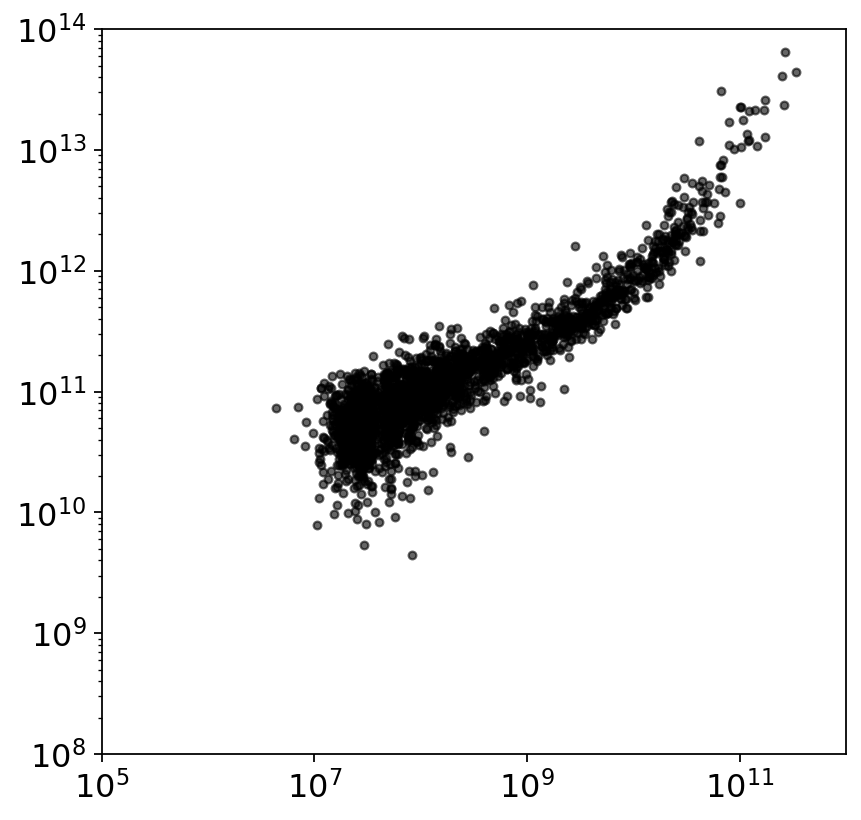

In [16]:
fig = plt.figure(figsize=(6,6))
ax = plt.gca()
  
# main scatter plotting
plt.scatter(featurizer.y_scalar*mass_multiplier, featurizer.x_scalar_features[:,1]*mass_multiplier, s=12, alpha=0.6, c='k')
plt.xscale('log')
plt.yscale('log')
#ax.set_aspect('equal')

plt.xlim(1e5, 1e12)
plt.ylim(1e8, 1e14)

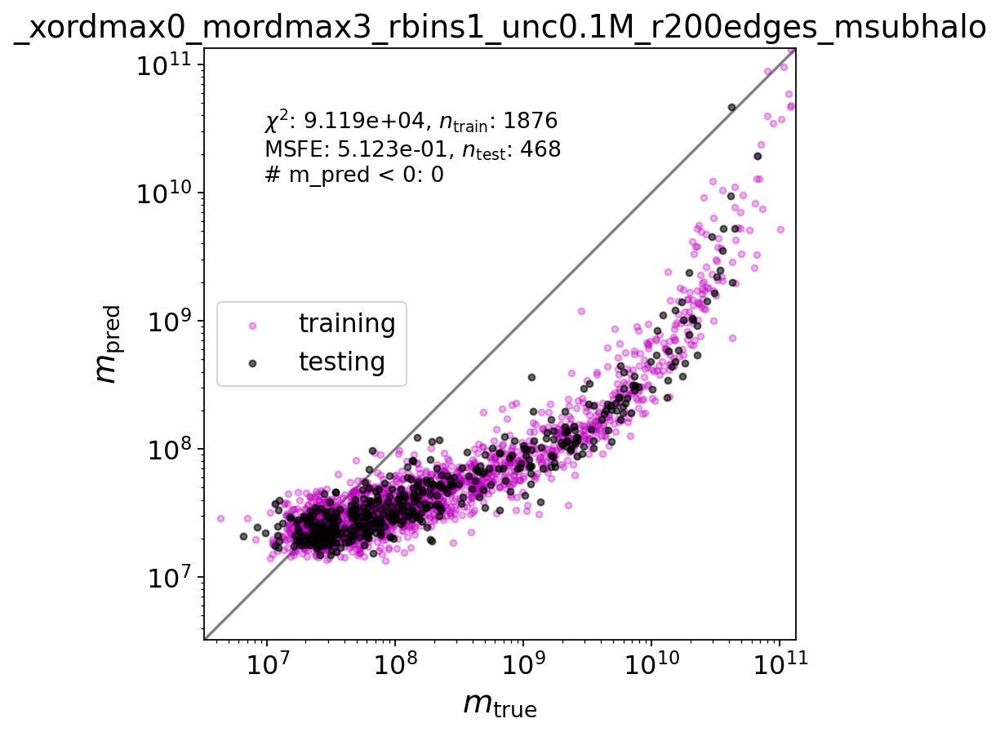

In [17]:
fig = plt.figure(figsize=(6,6))
ax = plt.gca()
  
# main scatter plotting
plt.scatter(y_train, y_train_pred, s=12, alpha=0.3, c='m', label='training')
plt.scatter(y_true, y_pred, s=12, alpha=0.6, c='k', label='testing')


# get limits, plot true line
m_minmin = min(min(y_true[np.where(y_true > 0)]), 
               min(y_pred[np.where(y_pred > 0)]))
m_maxmax = max(max(y_true[np.where(y_true > 0)]), 
               max(y_pred[np.where(y_pred > 0)]))
true_line = np.linspace(0.5*m_minmin, 2*m_maxmax)
plt.plot(true_line, true_line, color='grey', zorder=0)

# labels & adjustments
plt.xlabel(r'$m_\mathrm{true}$')
plt.ylabel(r'$m_\mathrm{pred}$')
plt.xscale('log')
plt.yscale('log')
ax.set_aspect('equal')
plt.xlim(0.5*m_minmin, 2*m_maxmax)
plt.ylim(0.5*m_minmin, 2*m_maxmax)

n_neg = len(np.where(fitter.y_scalar_pred*mass_multiplier < 0)[0])
plt.text(0.1, 0.9, fr'$\chi^2$: {chi2:.3e}, $n_\mathrm{{train}}$: {fitter.n_train}' '\n'
                   fr'MSFE: {msfe_test:.3e}, $n_\mathrm{{test}}$: {fitter.n_test}' '\n'
                   fr'# m_pred < 0: {n_neg}', 
         transform=ax.transAxes, verticalalignment='top', fontsize=12)
plt.title(save_tag)
plt.legend(loc='center left', fontsize=14)

# save
save_fn = f'mass_recovery{save_tag}.pdf'
if save_plots:
      plt.savefig(f"{plot_dir}/{save_fn}", bbox_inches='tight')

(array([235., 104.,  74.,  23.,  21.,   3.,   2.,   1.,   1.,   4.]),
 array([-0.9806068 , -0.65820252, -0.33579823, -0.01339395,  0.30901033,
         0.63141461,  0.9538189 ,  1.27622318,  1.59862746,  1.92103175,
         2.24343603]),
 [<matplotlib.patches.Polygon at 0x1535219fdca0>])

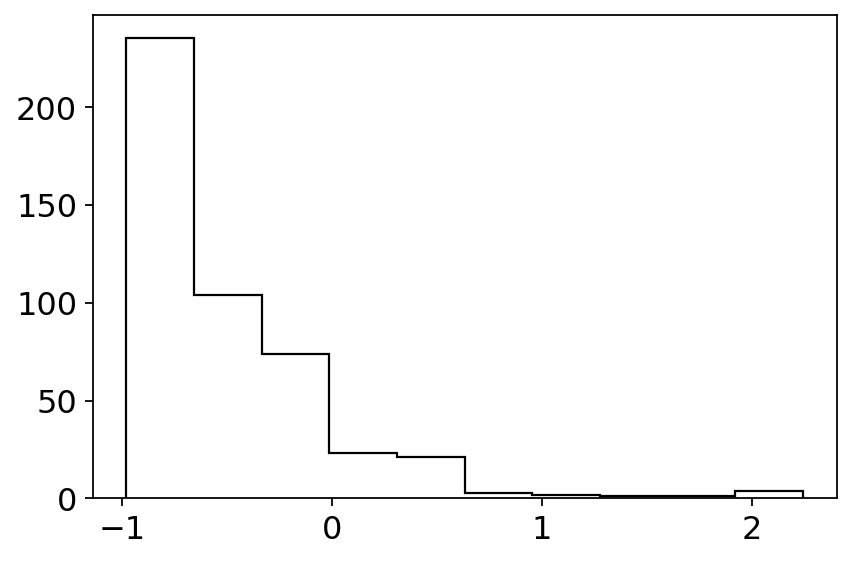

In [18]:
plt.hist((y_pred - y_true)/y_true, histtype='step', color='k')

(array([  0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0., 468.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.]),
 array([-100.        ,  -89.47368421,  -78.94736842,  -68.42105263,
         -57.89473684,  -47.36842105,  -36.84210526,  -26.31578947,
         -15.78947368,   -5.26315789,    5.26315789,   15.78947368,
          26.31578947,   36.84210526,   47.36842105,   57.89473684,
          68.42105263,   78.94736842,   89.47368421,  100.        ]),
 [<matplotlib.patches.Polygon at 0x153521a0d1f0>])

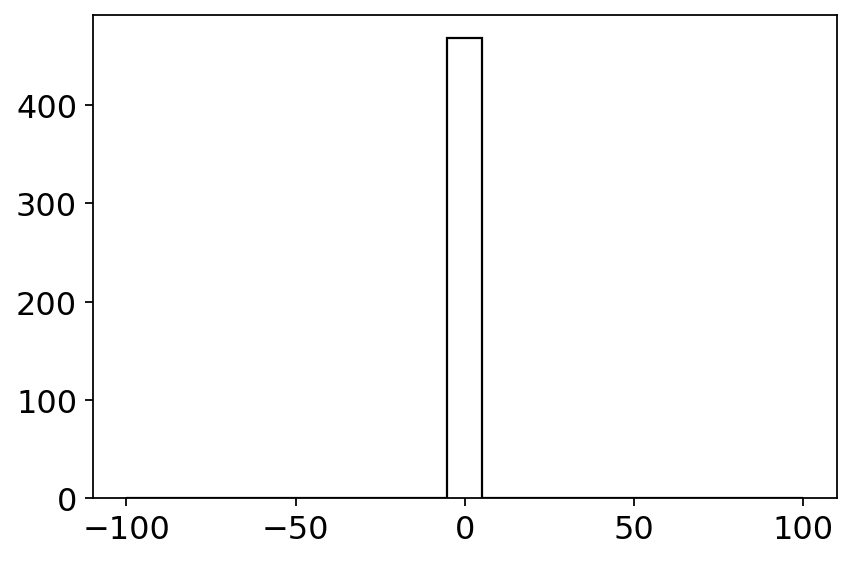

In [19]:
bins = np.linspace(-100, 100, 20)
plt.hist((y_pred - y_true)/y_true, bins=bins, histtype='step', color='k')

(array([  1.,   2.,   2.,   4.,   4.,   7.,   9.,  16.,  94., 329.]),
 array([-4.74518587e+10, -4.22235431e+10, -3.69952276e+10, -3.17669121e+10,
        -2.65385965e+10, -2.13102810e+10, -1.60819654e+10, -1.08536499e+10,
        -5.62533433e+09, -3.97018791e+08,  4.83129675e+09]),
 [<matplotlib.patches.Polygon at 0x153521aba580>])

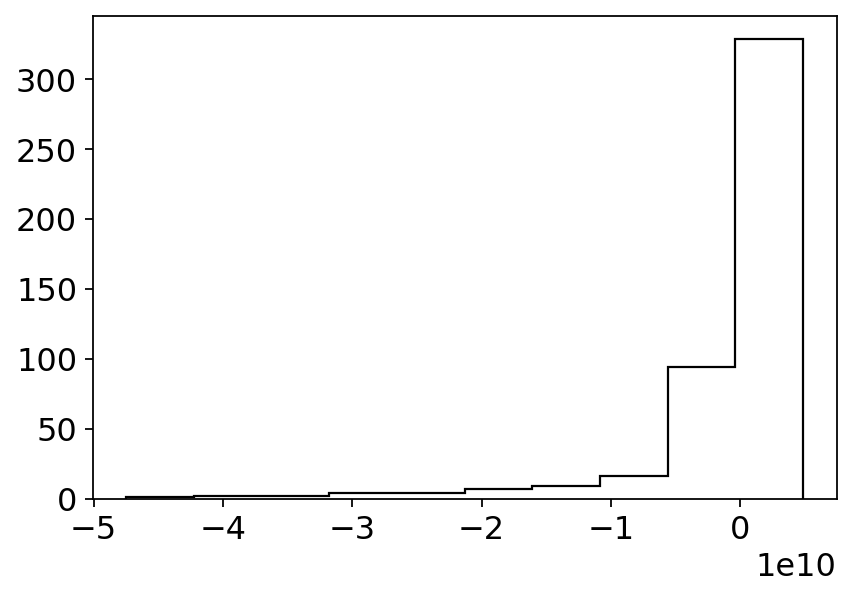

In [20]:
plt.hist((y_pred - y_true), histtype='step', color='k')

## Figure out zero-mass features

Plot random sample of halos

In [ ]:
nrows_outer, ncols_outer = 2, 3
n_plots = nrows_outer * ncols_outer

# random sample
np.random.seed(42)
idxs_rand = sorted(np.random.choice(featurizer.N_halos, size=n_plots, replace=False))

halo_dicts_rand = featurizer.halo_dicts[idxs_rand]
titles = idxs_rand[:n_plots]
print(titles)
plotter.plot_halos_dark_and_hydro(halo_dicts_rand, nrows_outer, ncols_outer, titles)

[350, 668, 808, 1797, 1994, 2066]


Get zero-mass features

In [ ]:
m0 = featurizer.x_scalar_features[:,1]
idxs_m0_zero = np.where(m0==0)[0]
print(idxs_m0_zero)

We solved the bug so there are none now! 
(was issue with halos at edges of box, had to wrap)